# Project Overview

> This is an in-depth notebook which explores the King County Housing Dataset through several different models. The notebook includes a thorough EDA and cleaning section, numerous visualizations, exploration of different models, feature selection methods, and a model stack to create the final model.

> You can read my tutorial about simple model stacking on Medium: https://towardsdatascience.com/simple-model-stacking-explained-and-automated-1b54e4357916

## Table of Contents

* **Project Overview**
    * Table of Contents
    * Objective
    * Package Imports
    * Notebook Functions

* **Obtaining our Data**

* **Scrubbing/Cleaning Data**
    * Checking Time Series
    * Duplicate Data
    * Outlier Detection
    * Binary Data

* **Exploring/Visualizing Data**
    * Study Target Variable
    * Create Holdout Set
    * Feature Engineering
    * Correlations and Multicollinearity
    * Polynomial Relationships
    * Visualize Categoricals
    * Visualize Continuous
    * Feature Interactions

* **Cleaning Final Data**
    * Standardize and Transform
    * Add Polynomial Features
    * Process Test Set
    * Create Train/Test Final Set

* **Modeling**
    * Spot Check Models
        * Feature Selectors
        * Spot Check Evaluation
    * Final Model Setup
        * Prepare Testing Assets
        * Get OOF Predictions
        * Run Stack Selector
        * Prepare Final Assets
    * Final Model Evaluation

* **Analysis**

* **APPENDIX**

## Objective

* Perform exhaustive and accurate data cleaning
* Explore different categorical handling methods
* Build a stacked model that accurately predicts house prices in King County

## Package Imports

In [1]:
# data processing tools
import pandas as pd
import numpy as np
from numpy import mean
from numpy import std
from numpy import argmax
from math import sqrt
import time
from collections import Counter
import itertools

# preprocessing
from statsmodels.tsa.stattools import adfuller
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import train_test_split, cross_validate, HalvingGridSearchCV, validation_curve, cross_val_score, GridSearchCV, KFold, RepeatedKFold

# scoring and algorithm selection packages
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score 
from sklearn.inspection import permutation_importance

# model tools
import statsmodels.api as sm
from statsmodels.formula.api import ols

import scipy.stats as stats
from scipy.stats import norm

from sklearn.linear_model import LinearRegression, BayesianRidge, ElasticNet, GammaRegressor, HuberRegressor,  Lars, Lasso, SGDRegressor
from sklearn.linear_model import LassoLars, OrthogonalMatchingPursuit, PassiveAggressiveRegressor, PoissonRegressor, RANSACRegressor, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR, LinearSVR, NuSVR
from sklearn.feature_selection import RFECV
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor, ExtraTreesRegressor, AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.kernel_ridge import KernelRidge
import xgboost as xgb


# visualization packages
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# ignore warnings (gets rid of Pandas copy warnings)
import warnings
warnings.filterwarnings('ignore')
pd.options.display.max_columns = None


## Notebook Functions

##### Cleaning Functions

In [2]:
def iqr_outliers(column, iqr_level):
    """return the lower range and upper range for the data based on IQR
    Arguments: 
    column - column to be evaluated
    iqr_level - iqr range to be evaluated
    """
    Q1,Q3 = np.percentile(column , [25,75])
    iqr = Q3 - Q1
    lower_range = Q1 - (iqr_level * iqr)
    upper_range = Q3 + (iqr_level * iqr)
    return lower_range,upper_range  

##### Preprocessing Functions

In [3]:
# this function is by Max Halford at the address noted above
def calc_smooth_mean(df, by, on, m, target_df):
    '''Function returns a weighted mean value for the each member of a column.
    Arguments:
    df: The df being used to calculate the means
    by: the column being target encoded
    on: the thing to be encoded; almost always price in this circumstance
    m: weight before moving toward global mean; usually a min # samples
    target_df: the target df for the mean encoding. Could be same as df or different.'''
    # Compute the global mean
    mean = df[on].mean() 

    # Compute the number of values and the mean of each group
    agg = df.groupby(by)[on].agg(['count', 'mean'])  
    counts = agg['count']
    means = agg['mean']

    # Compute the "smoothed" means
    smooth = (counts * means + m * mean) / (counts + m)

    # Replace each value by the according smoothed mean
    return round(target_df[by].map(smooth), 0) 

In [4]:
def test_feature_combinations(price, variables):
    
    """Function takes in target price and a dataframe of independent variables, and 
    tests model improvement for each combination of variables
    ARGUMENTS:
    Y of target values
    X-dataframe of continuous features
    Returns dataframe of score improvements over base score for each interaction combination"""
    
    # select our estimator and our cross validation plan
    regression = LinearRegression()
    cv = RepeatedKFold(n_splits=5, n_repeats=2, random_state=1)
    
    # prepare our scoring dataframe
    scoring_df = pd.DataFrame()
    
    # prepare our lists to store our features and scores as we iterate
    scores = []
    feature1 = []
    feature2 = []
    
    # Get a list of all of our features, and remove our target variable 'price' from the list
    features = list(variables.columns)

    # make a list of all of our possible feature combinations
    feature_combos = itertools.combinations(features, 2)
    feature_combos = list(feature_combos)
    
    # set our y-value as our target variable
    y = price
    
    # prepare our x-value with our independent variables. We do an initial split here in order to run a 
    # linear regression to get a base r^2 on our basic model without interactions
    X = variables
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=randomstate)
    base_score = round(np.mean(cross_val_score(regression, X_train, y_train, scoring='r2', cv=cv)), 4)   
    print("Model base score is ",base_score)
    
    # now we run the regression on each feature combo
    for feature in feature_combos:
        feat1, feat2 = feature[0], feature[1]
        
        # create the test interaction on our data set
        variables['test_interaction'] = variables[feat1] * variables[feat2]
        # create a new X which includes the test interaction and drops our target value
        X = variables
        # make a new split so that our x-splits include the test interaction
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=randomstate)
        
        # Run a linear regression with cross-val just like our base model, and append the score to our scores list
        new_score = round(np.mean(cross_val_score(regression, X_train, y_train, scoring='r2', cv=cv)), 4)
        scores.append(new_score)
        # put feature 1 on a list
        feature1.append(feat1)
        # put feature 2 on a list
        feature2.append(feat2)
        print(feat1, feat2, new_score)
        
        
    
    # load all of our lists into the scoring dataframe
    scoring_df['feature1'] = feature1
    scoring_df['feature2'] = feature2
    scoring_df['scores'] = scores
    scoring_df['improvement'] = scoring_df['scores'] - base_score
    variables.drop('test_interaction', axis=1, inplace=True)
    
    # return our scoring dataframe to the function
    return scoring_df

##### Tuning Functions

In [5]:
def stepwise_selection(X, y, 
                       initial_list=[], 
                       threshold_in=0.01, 
                       threshold_out = 0.05, 
                       verbose=True):
    """ 
    Perform a forward-backward feature selection 
    based on p-value from statsmodels.api.OLS
    Arguments:
        X - pandas.DataFrame with candidate features
        y - list-like with the target
        initial_list - list of features to start with (column names of X)
        threshold_in - include a feature if its p-value < threshold_in
        threshold_out - exclude a feature if its p-value > threshold_out
        verbose - whether to print the sequence of inclusions and exclusions
    Returns: list of selected features 
    Always set threshold_in < threshold_out to avoid infinite looping.
    See https://en.wikipedia.org/wiki/Stepwise_regression for the details
    """
    included = list(initial_list)
    while True:
        changed=False
        # forward step
        excluded = list(set(X.columns)-set(included))
        new_pval = pd.Series(index=excluded)
        for new_column in excluded:
            modelols = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included+[new_column]]))).fit()
            new_pval[new_column] = modelols.pvalues[new_column]
        best_pval = new_pval.min()
        if best_pval < threshold_in:
            best_feature = new_pval.idxmin()
            included.append(best_feature)
            changed=True
            if verbose:
                print('Add  {:30} with p-value {:.6}'.format(best_feature, best_pval))

        # backward step
        modelols = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included]))).fit()
        # use all coefs except intercept
        pvalues = modelols.pvalues.iloc[1:]
        worst_pval = pvalues.max() # null if pvalues is empty
        if worst_pval > threshold_out:
            changed=True
            worst_feature = included[pvalues.argmax()]
            included.remove(worst_feature)
            if verbose:
                print('Drop {:30} with p-value {:.6}'.format(worst_feature, worst_pval))
        if not changed:
            break
    return included



In [6]:
def grid_optimizer(model, grid, x, y):
    
    '''Takes in a model and a grid of hyperparameters, and runs a HalvingGridSearch
    arguments: 
    model - the model to be grid searched
    parameter grid - all parameters to grid search
    x, y - train features and target to be tested in search
    returns: best parameters'''
    
    start=time.time()
    
    print("Making Search")
    grid_search = HalvingGridSearchCV(model, grid, verbose=10, scoring='neg_mean_absolute_error', cv=5, min_resources='exhaust')

    print("Running Grid")
    grid_search.fit(x, y)

    grid_search.best_estimator_
    
    # Best f1
    print('Best mae: %.3f' % grid_search.best_score_)

    print("Best parameters set found on train set: \n")
    print(grid_search.best_params_)
    print("\nGrid scores on train set:\n")
    means = grid_search.cv_results_['mean_test_score']
    stds = grid_search.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))
    
    print(f'Elapsed Time: {time.time() - start}')
    
    return grid_search.best_params_

##### Scoring Functions

In [7]:
def score_model(model, x, y, model_type, score_list):
    '''Takes in an instantiated model along with x, y and scores it, then appends to list
    Arguments:
    model: tuned/instantiated model
    x, y: train features and targets to be scored with CV
    model_type: label with name of model
    score_list: score list which is then returned back
    Returns: List with scores appended
    '''
    # get accuracy cross val score for cv 5
    scores = cross_validate(model, x, y, cv=5, n_jobs=-1,
        scoring=('r2', 'neg_mean_absolute_error', 'neg_root_mean_squared_error'),
        return_train_score=True)
    r2 = round(scores['test_r2'].mean()*100,2)
    mae = round(scores['test_neg_mean_absolute_error'].mean(), 4)
    mrse = round(scores['test_neg_root_mean_squared_error'].mean(), 4)
    
    print("\n\n",model_type," scores")
    print("CV 5 R2 Train Score: {}".format(r2))
    print("CV 5 MAE Train Score: {}".format(mae))
    print("CV 5 RMSE Train Score: {}".format(mrse))

    # append our scores to our lists
    score_list['model'].append(model_type)
    score_list['r2'].append(r2)
    score_list['mae'].append(mae)
    score_list['rmse'].append(mrse)
    
    return score_list

##### Visualization Functions

In [8]:
def plot_polys(y, xlabel, title):
    '''Takes in a y-axis, x-axis label, and title and plots with various polynomial levels
    ARGUMENTS:
    y axis variable values
    x-axis label
    visualization title'''
    x = y.index
    
    # express numbers as arrays and reshape
    y = np.array(y)
    x = np.array(x)
    x = x.reshape(-1, 1)
    
    # plot figure
    plt.figure(figsize=(16, 8))

    # standard linear regression
    linreg = LinearRegression()
    linreg.fit(x, y)

    # 2nd degree polynomial regression
    poly2 = PolynomialFeatures(degree=2)
    x_poly2 = poly2.fit_transform(x)
    poly_reg2 = LinearRegression()
    poly_reg2.fit(x_poly2, y)

    # third degree polynomial regression 
    poly3 = PolynomialFeatures(degree=3)
    x_poly3 = poly3.fit_transform(x)
    poly_reg3 = LinearRegression()
    poly_reg3.fit(x_poly3, y)

    # predict on x values
    pred = linreg.predict(x)
    pred2 = poly_reg2.predict(x_poly2)
    pred3 = poly_reg3.predict(x_poly3)

    # plot regression lines
    plt.scatter(x, y)
    plt.yscale('log')
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel('Average')
    plt.plot(x, pred, c='red', label='Linear regression line')
    plt.plot(x, pred2, c='yellow', label='Polynomial regression line 2')
    plt.plot(x, pred3, c='#a3cfa3', label='Polynomial regression line 3');

In [9]:
# adding our chosen polynomial features

def create_polynomial_array(data, column, num_features):
    '''takes a dataframe, a target column, and number of polynomial features
    returns a small dataframe of polynomial features
    '''
    values = data[column]
    poly_array = np.array(values)
    poly_array = poly_array.reshape(-1,1)
    poly_fit = PolynomialFeatures(degree=num_features, include_bias=False)
    fit_features = poly_fit.fit_transform(poly_array)
    poly_df = pd.DataFrame(fit_features)
    return poly_df

##### Stacking Functions

In [10]:
def train_oof_predictions(x, y, models, verbose=True):
    '''Function to perform Out-Of-Fold predictions on train data
    returns re-ordered predictors x, re-ordered target y, and model dictionary with filled predictors
    Parameters:
    x: training predictors
    y: training targets
    models: dictionary of models in form of 'model name' : [instantiated model, predictors list]
    verbose: whether to print the sequence of inclusions(True recommended)
    '''
    
    # instantiate a KFold with 10 splits
    kfold = KFold(n_splits=10, shuffle=True, random_state=randomstate)
    
    # prepare lists to hold the re-ordered x and y values
    data_x, data_y  = [], []
    
    # run the following block for each of the 10 kfold splits
    for train_ix, test_ix in kfold.split(x, y):
    
        if verbose: print("\nStarting a new fold\n")
    
        if verbose: print("Creating splits")
        #create this fold's training and test sets
        train_X, test_X = x[train_ix], x[test_ix] 
        train_y, test_y = y[train_ix], y[test_ix]
    
        if verbose: print("Adding x and y to lists\n")
        # add the data that is used in this fold to the re-ordered lists
        data_x.extend(test_X)
        data_y.extend(test_y)
    
        # run each model on this kfold and add the predictors to the model's running predictors list
        for item in models:
            
            label = item # get label for reporting purposes
            model = models[item][0] # get the model to use on the kfold
        
            # fit and make predictions 
            if verbose: print("Running",label,"on this fold")
            model.fit(train_X, train_y) # fit to the train set for the kfold
            predictions = model.predict(test_X) # fit on the out-of-fold set
            models[item][1].extend(predictions) # add predictions to the model's running predictors list
    
    return data_x, data_y, models

In [11]:
def model_selector(X, y, meta_model, models_dict, model_label, verbose=True):
    
    """ 
    Perform a forward model selection based on MAE improvement
    Parameters:
        X - baseline X_train with all features
        y - baseline y_train with all targets
        meta_model - meta_model to be trained
        models_dict - dictionary of models in format of 'model name' : [model object, out-of-fold predictions]
        label - the label for the current meta model
        verbose - whether to print the sequence of inclusions(True recommended)
    Returns: list of selected models, best MAE 
    """

    print("\n\nRunning model selector for ", model_label)
    included_models = []
     
    while True:
        changed=False
        
        # forward step
        
        if verbose: print("\nNEW ROUND - Setting up score charts")
        excluded_models = list(set(models_dict.keys())-set(included_models)) # make a list of the current excluded_models
        if verbose: print("Included models: {}".format(included_models))
        if verbose: print("Exluded models: {}".format(excluded_models))
        new_mae = pd.Series(index=excluded_models) # make a series where the index is the current excluded_models
        
        current_meta_x = np.array(X)
        
        if len(included_models) > 0:
            for included in included_models:
                included = np.array(models_dict[included][1]).reshape((len(models_dict[included][1]), 1))
                current_meta_x = np.hstack((current_meta_x, included))

        # score the current model
        scores = cross_validate(meta_model, current_meta_x, y, cv=5, n_jobs=-1, scoring=('neg_mean_absolute_error'))
        starting_mae = round(scores['test_score'].mean(),4)
        if verbose: print("Starting mae: {}\n".format(starting_mae))
        
       
        for excluded in excluded_models:  # for each item in the excluded_models list:
            
            new_yhat = np.array(models_dict[excluded][1]).reshape(-1, 1) # get the current item's predictions
            meta_x = np.hstack((current_meta_x, new_yhat)) # add the predictions to the meta set
            
            # score the current item
            scores = cross_validate(meta_model, meta_x, y, cv=5, n_jobs=-1, scoring=('neg_mean_absolute_error'))
            mae = round(scores['test_score'].mean(),4)
            if verbose: print("{} score: {}".format(excluded, mae))
            
            new_mae[excluded] = mae # append the mae to the series field
        
        best_mae = new_mae.max() # evaluate best mae of the excluded_models in this round
        if verbose: print("Best mae: {}\n".format(best_mae))
        
        if best_mae > starting_mae:  # if the best mae is better than the initial mae
            best_feature = new_mae.idxmax()  # define this as the new best feature
            included_models.append(str(best_feature)) # append this model name to the included list
            changed=True # flag that we changed it
            if verbose: print('Add  {} with mae {}\n'.format(best_feature, best_mae))
        else: changed = False
        
        if not changed:
            break
            
    print(model_label, "model optimized")
    print('resulting models:', included_models)
    print('MAE:', starting_mae)
    
    return included_models, starting_mae

In [12]:
def create_meta_dataset(data_x, items):
    '''Function that takes in a data set and list of predictions, and forges into one dataset
    parameters:
    data_x - original data set
    items - list of predictions
    returns: stacked data set
    '''
    
    meta_x = data_x
    
    for z in items:
        z = np.array(z).reshape((len(z), 1))
        meta_x = np.hstack((meta_x, z))
        
    return meta_x

In [13]:
def stack_prediction(X_test, final_models): 
    '''takes in a test set and a list of fitted models.
    Fits each model in the list on the test set and stores it in a predictions list
    Then sends the test set and the predictions to the create_meta_dataset to be combined
    Returns: combined meta test set
    Parameters:
    X_test - testing dataset
    final_dict - list of fitted models
    '''
    predictions = []
    
    for item in final_models:
        print(item)
        preds = item.predict(X_test).reshape(-1,1)
        predictions.append(preds)
    
    meta_X = create_meta_dataset(X_test, predictions)
        
    return meta_X

# Obtaining Our Data

In [14]:
# load and look at our king county housing data
df = pd.read_csv('kc_house_data.csv')
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,263000018,20140521T000000,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509
21609,6600060120,20150223T000000,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200
21610,1523300141,20140623T000000,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007
21611,291310100,20150116T000000,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287


In [15]:
# What are the data types?
df.dtypes

id                 int64
date              object
price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object

In [16]:
# Get the basic statistics
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [17]:
# Missing data?
df.isna().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

# Scrubbing/Cleaning Data

## Checking for Time Series Trends

Our first step is to check if our data has a time series trend. This data covers home prices for a period of a year, and a lot can change in a year for real estate. If we find a trend in our home prices, we'll want to correct and remove this trend before continuing.

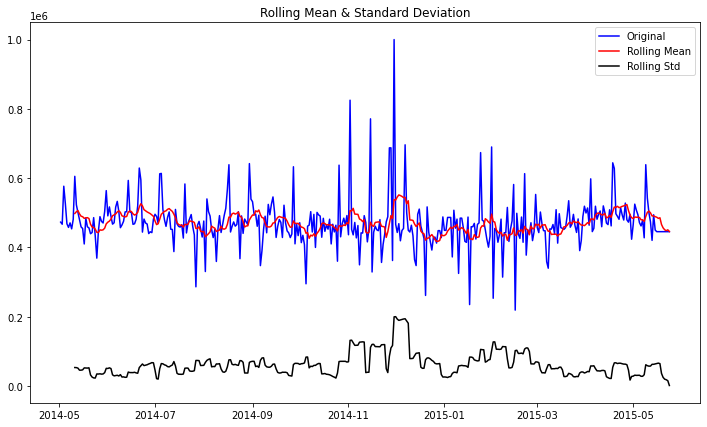

In [18]:
# make a new df with just the date and price
temp_df = df[['date', 'price']]

# convert our date field to a proper datetime
temp_df['date'] = pd.to_datetime(temp_df['date'])

# drop outliers (somewhat arbitrary)
temp_df.drop(temp_df.loc[(temp_df['price'] > 1000000) | (temp_df['price'] < 100000)].index, axis=0, inplace=True)

# set the date as our index
temp_df.set_index('date', inplace=True)

# group our data by day
temp = temp_df.groupby(pd.Grouper(freq='D')).mean()

# backfill any empty days by getting previous day's mean
temp.bfill(inplace=True)

# find the rolling mean and rolling standard deviation
roll_mean = temp.rolling(window=10, center=False).mean()
roll_std = temp.rolling(window=10, center=False).std()

# plot the figure with rolling mean and standard deviation
fig = plt.figure(figsize=(12,7))
plt.plot(temp, color='blue', label='Original')
plt.plot(roll_mean, color='red', label='Rolling Mean')
plt.plot(roll_std, color='black', label = 'Rolling Std')
plt.legend(loc='best')
plt.title('Rolling Mean & Standard Deviation')
plt.show(block=False)

We run a Dickey-Fuller hypothesis test on our time series to test for stationarity. The null hypothesis is that the data is not stationary. If we have a p-value below .05, we will reject the null hypothesis.

In [19]:
dftest = adfuller(temp)

# Extract and display test results in a user friendly manner
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value

print ('Results of Dickey-Fuller test: \n')
print(dfoutput)

Results of Dickey-Fuller test: 

Test Statistic                -9.511959e+00
p-value                        3.231511e-16
#Lags Used                     2.000000e+00
Number of Observations Used    3.850000e+02
Critical Value (1%)           -3.447450e+00
Critical Value (5%)           -2.869077e+00
Critical Value (10%)          -2.570785e+00
dtype: float64


The p-value of 3.23e-16 on the Dickey-Fuller test is FAR under .05, so we reject the null hypothesis that there is a trend in the data. 
Our data set is not exhibiting time series trends, so we don't need to account for this (surprisingly!!)

In [20]:
# on our original df, convert the date to a proper date-time, and then drop the day so it's only year-month
df['date'] = pd.to_datetime(df['date'])
df['date'] = df['date'].dt.strftime('%Y-%m')

## Duplicate Data

In [21]:
# Look for duplicate data using lat/long

df[df.duplicated(subset=['lat','long'], keep=False)].sort_values('lat')

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
20925,8141310040,2014-06,246950.0,3,3.00,1670,4440,1.0,0,0,3,7,1670,0,2014,0,98022,47.1948,-121.975,1670,4622
20686,8141310030,2014-07,256703.0,3,2.00,1670,4441,1.0,0,0,3,7,1670,0,2014,0,98022,47.1948,-121.975,1670,4622
16535,5595900345,2015-01,460000.0,4,2.75,3460,13168,2.0,0,0,4,8,3460,0,1932,1986,98022,47.2046,-121.996,1500,7670
5147,5595900280,2015-03,235000.0,3,1.00,1050,7670,1.5,0,0,5,7,1050,0,1955,0,98022,47.2046,-121.996,1220,7670
8429,9432900180,2014-07,307999.0,4,2.75,2420,8438,2.0,0,0,3,8,2420,0,1996,0,98022,47.2091,-122.009,2420,8580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16320,7418700050,2014-05,299000.0,3,1.00,1390,9624,1.5,0,0,4,7,1390,0,1954,0,98155,47.7758,-122.301,1440,9624
10538,253600160,2014-05,384950.0,3,2.50,1860,3690,2.0,0,0,3,7,1860,0,2000,0,98028,47.7760,-122.239,1870,4394
7532,253600150,2014-08,380000.0,2,2.50,1860,3504,2.0,0,0,3,7,1860,0,2000,0,98028,47.7760,-122.239,1860,4246
747,293720140,2014-06,449950.0,3,2.50,2170,4912,2.0,0,0,3,7,2170,0,2003,0,98028,47.7767,-122.239,2010,4395


In [22]:
# We have a lot of duplicate entries. We're going to keep the later of these entries and hope that if it's an outlier,
# it's caught in our outlier processing later.

df.drop_duplicates(['lat','long'], keep='last', inplace=True)

## Outlier Detection

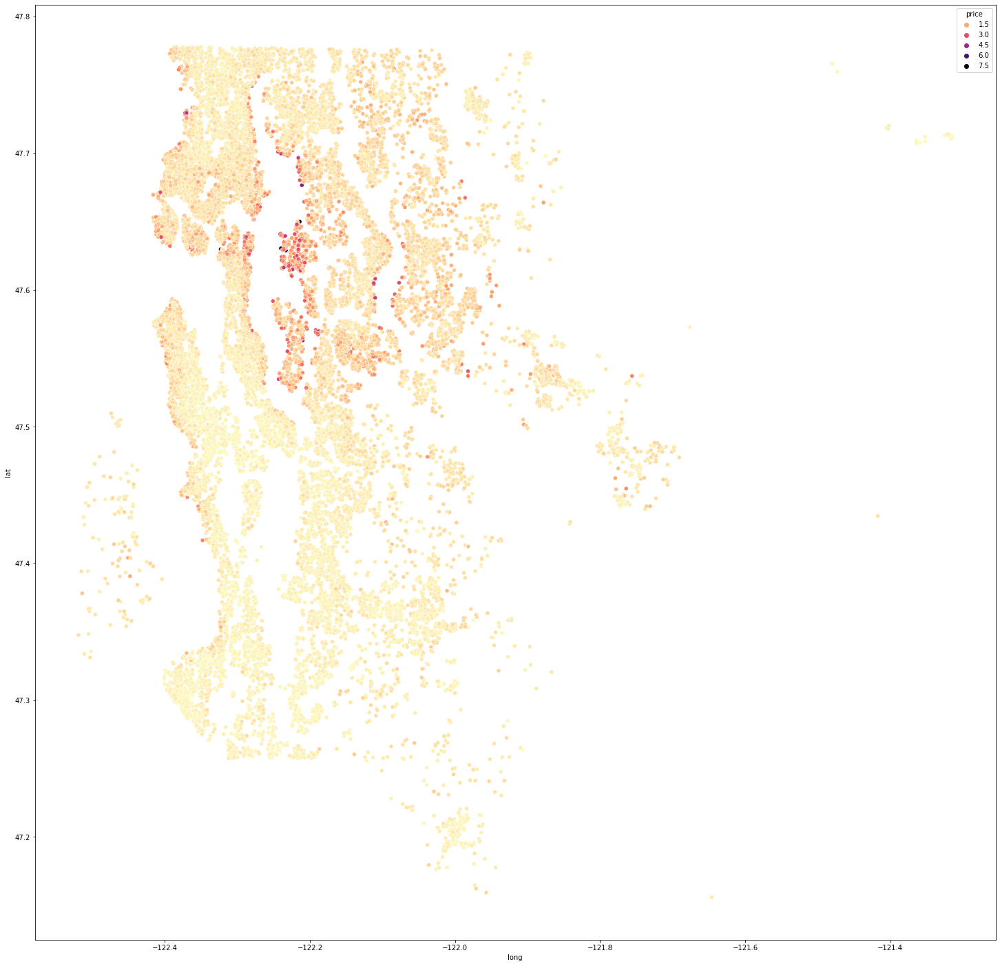

In [23]:
# plotting latitude and longitude as a visual scatter plot to look for location outliers

plt.figure(figsize=(25,25))

sns.scatterplot(data=df, x="long", y="lat", hue="price", palette="magma_r");

Using latitude and longitude, we make a visual map of the King County area that lets us see the map outliers. We can see that there are a few sales in locations that are outliers in some way - still in King County but very far away from the metro area on which we are focusing. Sales that are too far outside of our comparison area geographically may add noise to our model. So I'm going to drop the longitude outliers as well. 

This visualization suggests that location is very important to home price. We're going to check that out more directly.

In [24]:
# drop the properties east of the metropolitan area
df.drop(df[df['long'] > -121.7].index, inplace=True)

In [25]:
# looking for outliers in the percentiles
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.080900e+04,2.080900e+04,20809.000000,20809.000000,20809.000000,2.080900e+04,20809.000000,20809.000000,20809.000000,20809.000000,20809.000000,20809.000000,20809.000000,20809.000000,20809.000000,20809.000000,20809.000000,20809.000000,20809.000000,20809.000000
mean,4.577438e+09,5.434746e+05,3.380556,2.118482,2092.673651,1.540826e+04,1.487097,0.007737,0.238839,3.413715,7.665097,1796.978183,295.695468,1970.862944,85.459561,98077.644433,47.559213,-122.213780,1995.607285,12983.825652
std,2.875639e+09,3.696620e+05,0.929549,0.771670,922.394989,4.209881e+04,0.533516,0.087622,0.773236,0.651549,1.180244,832.229017,445.657536,29.223085,404.081343,53.598262,0.138948,0.138697,687.649367,27690.839852
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.159300,-122.519000,399.000000,659.000000
25%,2.123049e+09,3.240000e+05,3.000000,1.750000,1430.000000,5.102000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1200.000000,0.000000,1951.000000,0.000000,98033.000000,47.468600,-122.327000,1490.000000,5160.000000
50%,3.904960e+09,4.520000e+05,3.000000,2.250000,1930.000000,7.680000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1570.000000,0.000000,1975.000000,0.000000,98065.000000,47.570900,-122.228000,1850.000000,7670.000000
75%,7.305301e+09,6.500000e+05,4.000000,2.500000,2560.000000,1.080000e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2230.000000,580.000000,1996.000000,0.000000,98117.000000,47.677600,-122.124000,2376.000000,10133.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.701000,6210.000000,871200.000000


We see potential outliers in price, sqft_lot, sqft_living, and bedrooms.

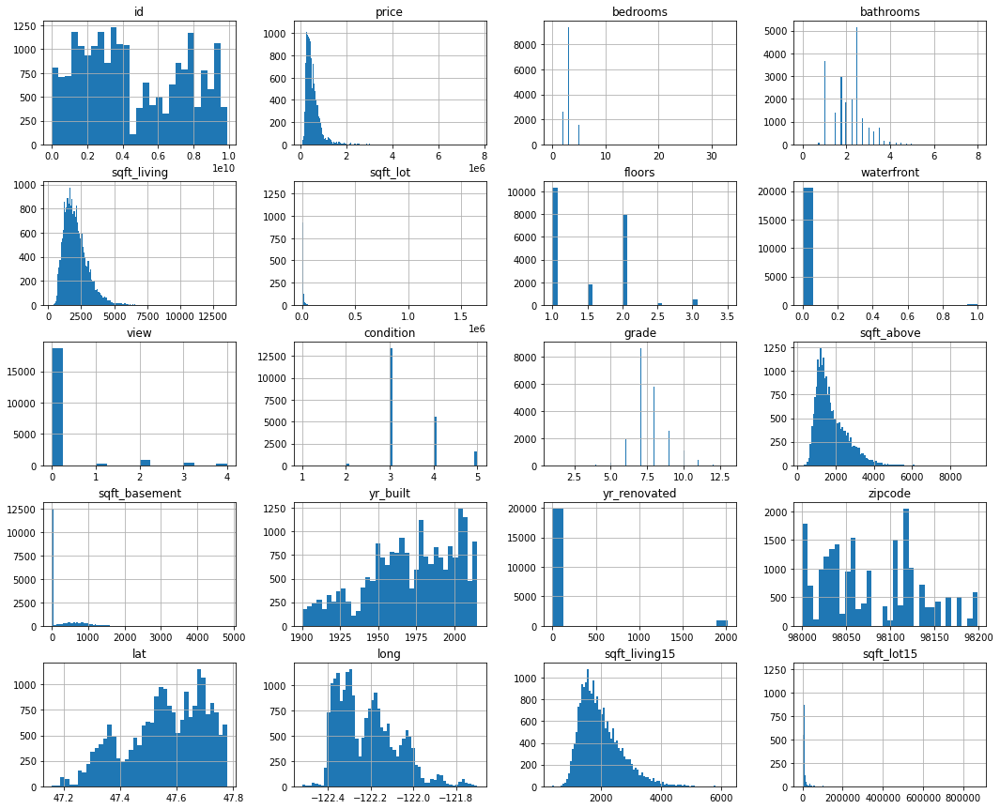

In [26]:
# check how our histograms are looking

df.hist(figsize=(18,15), bins='auto');

We should never remove outliers indiscriminately, especially if they contain real data. Ultimately I opt to remove via IQR on sqft_living and sqft_lot, with reservations. A lot of our variables are not normally distributed, so we can't reliably remove outliers via standard deviation.

For the square footage variables, I ultimately concluded that extremely large houses and lots are so seriously under-represented in the dataset that we won't be able to reliably predict on them anyway and they are better left off.

In order to prevent a lot of data loss in this way, I kept IQR range of 1.6 instead of the standard 1.5

In [27]:
# determing our IQR ranges for lot size, sq footage by calling our iqr_outliers function
lotlower,lotupper = iqr_outliers(df.sqft_lot, 1.6)
sqftlower, sqftupper = iqr_outliers(df.sqft_living, 1.6)

# dropping the things outside of our lower and upper range
df.drop(df[ (df.sqft_lot > lotupper) | (df.sqft_lot < lotlower) ].index , inplace=True)
df.drop(df[ (df.sqft_living > sqftupper) | (df.sqft_living < sqftlower) ].index , inplace=True)

In [28]:
# We're going to visualize a zip code's importance, so we're making a temporary feature
# we're using the median house value for a zip code to determine the zip code's sort 

# group our dataframe by zipcode on median home price, sorted ascending. 
zipsorted = pd.DataFrame(df.groupby('zipcode')['price'].median().sort_values(ascending=True))

# rank each zip code and assign rank to new column
zipsorted['rank'] = np.divmod(np.arange(len(zipsorted)), 1)[0]+1

# function that looks up a segment that a data entry belongs to
def make_group(x, frame, column):
    '''Takes in a line, a lookup table, and a target column
    returns value of target column
    ARGUMENTS:
    line from dataframe x
    lookup table frame
    column to return rank'''
    y = frame.loc[(frame.index == x)][column]
    z = np.array(y)
    z[0]
    return z[0]

# make a new column on our dataframe. Look up each zip entry's group, and append to the column.
df['zip_rank'] = df['zipcode'].apply(lambda x: make_group(x, zipsorted, 'rank'))

# apply the median home price per zip code to the data frame
df['median_zip'] = df['zipcode'].apply(lambda x: round(df.loc[df['zipcode']==x]['price'].median(), 0))

''

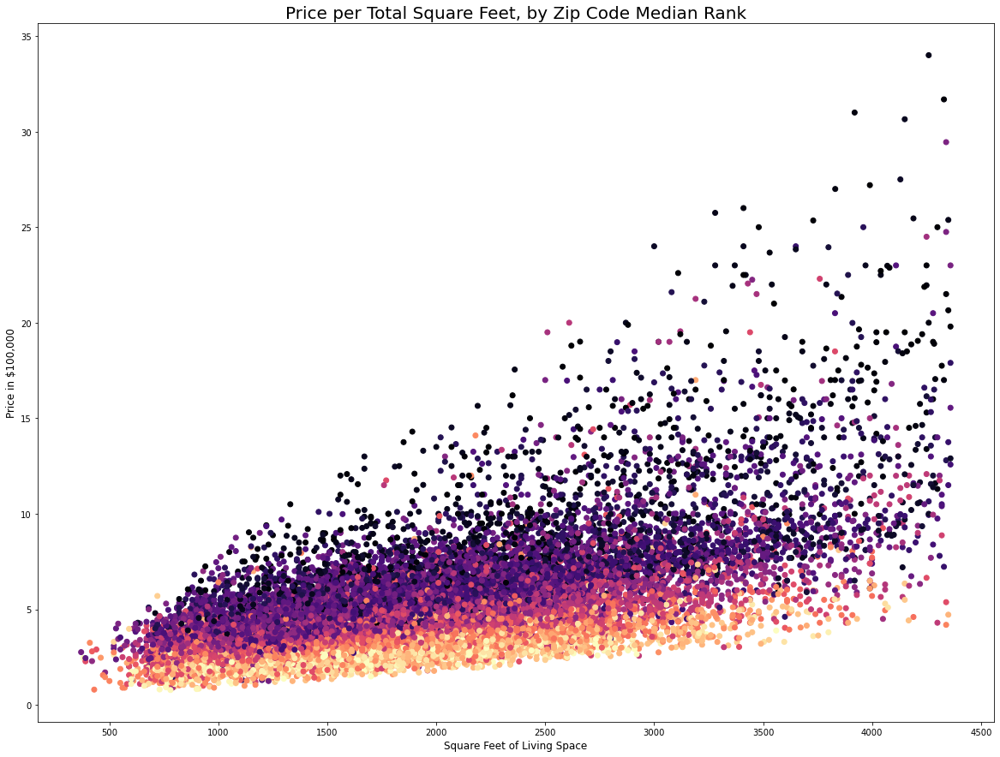

In [29]:
# visualize zip code as a color function, on a plot of price per square footage

fig, ax = plt.subplots(figsize=(20, 15))

ax.scatter(df['sqft_living'], df['price'] /100000, c=df['zip_rank'], cmap='magma_r')

ax.set_xlabel('Square Feet of Living Space', fontsize=12)
ax.set_ylabel('Price in $100,000', fontsize=12)
ax.set_title('Price per Total Square Feet, by Zip Code Median Rank', fontsize=20)
;

This plot of price per total square feet of living space, colored by the zip code median rank, visually shows the importance of location. Let's look at that closer.

''

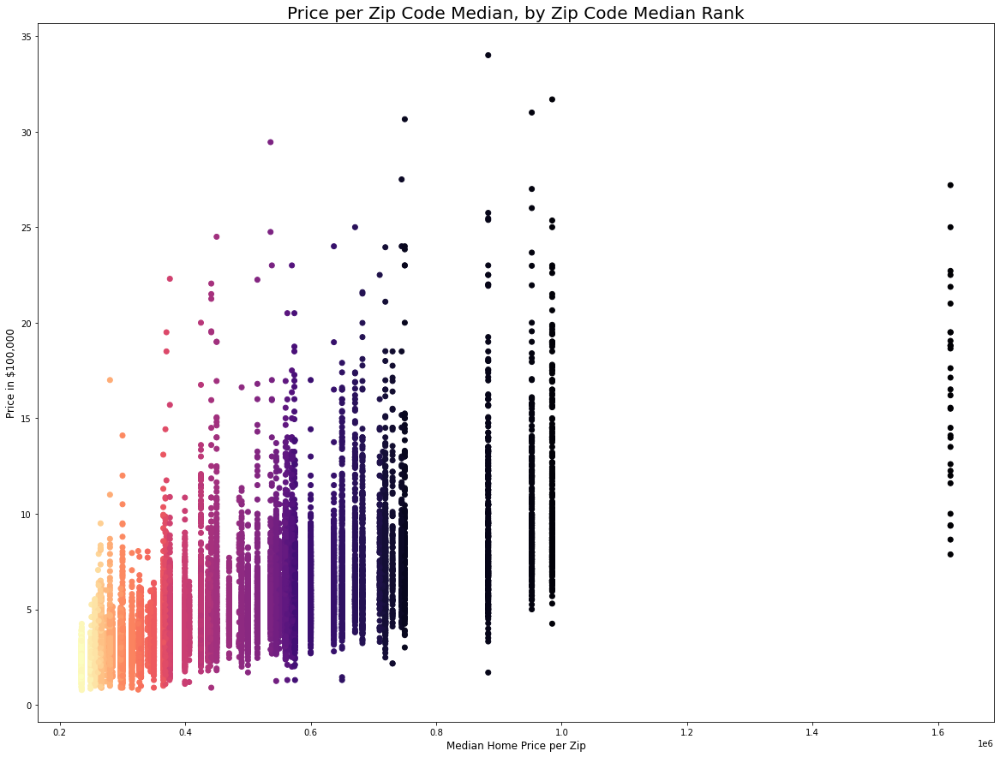

In [30]:
# visualize zip code as a color function

fig, ax = plt.subplots(figsize=(20, 15))

ax.scatter(df['median_zip'], df['price'] /100000, c=df['zip_rank'], cmap='magma_r')

ax.set_xlabel('Median Home Price per Zip', fontsize=12)
ax.set_ylabel('Price in $100,000', fontsize=12)
ax.set_title('Price per Zip Code Median, by Zip Code Median Rank', fontsize=20)
;

Looking at our price per zip code in a different way, we can see a potential issue with our data. Most of our data set is fairly normal and expected. Then we have three zip codes giving us very strong right tails. Then we have ONE zip code way off yonder which may cause problems with our model. 

I'll be eliminating price outliers on a per-zipcode basis using the same IQR range. My goal here is not to strip usable data, but to identify and excise any rogue non-standard sales. If I were to do this dataset-wide, many zipcodes would retain their own outliers. We can see in the visualizations just above that zipcodes each have their own price distribution. So we keep our price outlier detection within zipcode.

In [31]:
# Eliminating outliers on a per-zipcode basis

zipcodes = df['zipcode'].unique()

for i in zipcodes:
    lower, upper = iqr_outliers(df[df['zipcode'] == i]['price'], 1.6)
    df.drop(df[ ( (df.price > upper) & (df['zipcode'] == i) ) | ( (df.price < lower)  & (df['zipcode'] == i) ) ].index , inplace=True)


##### Manually locating zip/price outliers

One thing this data set lacks is *type of sale*. We want a model that properly describes the open market, but this dataset definitely includes sales that are outside the market, such as inter-family sales or other sales that don't properly reflect market value. The best way I can think of to find these outliers is to find suspiciously low sales based on location, because we can see in the lat/long scatter that location makes a difference. We will hunt these down manually even though that takes some time.

In [32]:
# check price stats by zip code and displaying top 30 zip codes by mean
# I'm looking for suspiciously low "min" values

find_zip_outliers = df.groupby('zipcode')['price'].describe()
find_zip_outliers.sort_values('mean', ascending=False).head(35)

# very suspicious values in many zip codes for min
# 98112, 98109, 98033, 98115, 98027, 98116, 98122, 98117, 98136, 98065, 98144, 98072, 98028

,count,mean,std,min,25%,50%,75%,max
zipcode,,,,,,,,
98039,31.0,1.622343e+06,494484.329810,787500.0,1242500.0,1620000.0,1927500.0,2720000.0
98004,228.0,1.123688e+06,422953.730490,425000.0,786500.0,982500.0,1421750.0,2300000.0
98040,219.0,1.013088e+06,302553.223891,500000.0,790000.0,947500.0,1207500.0,1955000.0
98112,231.0,9.382975e+05,366493.217484,169317.0,668000.0,855000.0,1197500.0,1925000.0
98109,97.0,7.882523e+05,287731.990461,216650.0,605000.0,710200.0,915000.0,1550000.0
98105,203.0,7.772565e+05,308771.511434,380000.0,547497.5,667750.0,945500.0,1655000.0
98119,162.0,7.688812e+05,251694.191893,300523.0,595000.0,725500.0,896250.0,1465000.0
98102,90.0,7.685191e+05,259545.975523,330000.0,577250.0,695000.0,946250.0,1450000.0
98075,246.0,7.448135e+05,142114.798775,406430.0,660750.0,741000.0,834153.5,1150000.0


In [33]:
df.loc[(df['price'] <= 250000) & (df['zipcode'] == 98109)]
# There are two listings in this zip code selling for under 250k. We're going to consider this an outlier sale.
# worth noting these are both the exact same property. These are both bad listings.

# It looks like we missed a dupe due to a slight mismatch in lat. Since this is a dupe AND an anomalous price, we are going to dump it.

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,zip_rank,median_zip
3844,2734100734,2014-10,216650.0,3,3.5,1540,1427,2.0,0,0,3,7,1360,180,2007,0,98109,47.5420,-122.322,1220,4000,64,730500.0
11436,2734100732,2014-10,216650.0,3,3.5,1480,1077,2.0,0,0,3,7,1300,180,2007,0,98109,47.5421,-122.322,1140,2003,64,730500.0


In [34]:
df.loc[(df['price'] <= 250000) & (df['zipcode'] == 98033)]
#We're going to consider these outlier sales.

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,zip_rank,median_zip
1222,1238500451,2015-02,130000.0,3,1.0,1110,7520,1.0,0,0,4,7,1110,0,1960,0,98033,47.6830,-122.176,1440,8400,58,650000.0
12823,2870000040,2014-11,145000.0,2,1.0,800,8125,1.0,0,0,3,6,800,0,1964,0,98033,47.6836,-122.174,2390,8125,58,650000.0


In [35]:
df.loc[(df['price'] <= 250000) & (df['zipcode'] == 98115)]
#We're going to consider these outlier sales.

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,zip_rank,median_zip
1975,5101404170,2014-11,200000.0,1,0.75,680,9600,1.0,0,0,3,5,680,0,1947,0,98115,47.6964,-122.306,1580,6624,52,570000.0
16384,5101400561,2014-10,250000.0,2,1.00,890,6380,1.0,0,0,3,6,890,0,1951,0,98115,47.6910,-122.303,990,6380,52,570000.0


In [36]:
df.loc[(df['price'] <= 250000) & (df['zipcode'] == 98027)]
# listings under 250k in this zip. We'll drop them.

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,zip_rank,median_zip
3885,5279100625,2015-04,248000.0,2,1.0,770,8600,1.0,0,0,4,4,770,0,1914,0,98027,47.5325,-122.031,1420,6960,55,575000.0
7088,5279100680,2014-06,240000.0,3,1.0,1150,4825,1.0,0,0,4,6,1150,0,1957,0,98027,47.5321,-122.029,1760,7121,55,575000.0
14001,2354300456,2015-03,130000.0,2,1.0,600,1500,1.0,0,0,4,4,600,0,1900,0,98027,47.5289,-122.033,1130,6000,55,575000.0
18897,2354300845,2014-08,210000.0,3,1.0,1020,6000,1.0,0,0,3,5,1020,0,1900,0,98027,47.5281,-122.031,2070,7200,55,575000.0


In [37]:
df.loc[(df['price'] <= 250000) & (df['zipcode'] == 98116)]
# suspicious but in bad condition. We will drop though.

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,zip_rank,median_zip
3975,6324000090,2015-05,210000.0,2,1.0,990,8140,1.0,0,0,1,6,990,0,1910,0,98116,47.5828,-122.382,2150,5000,51,562750.0
18332,9272202260,2014-09,130000.0,3,1.0,1200,7000,2.0,0,0,1,7,1200,0,1908,0,98116,47.5883,-122.384,3290,6000,51,562750.0


In [38]:
df.loc[(df['price'] <= 250000) & (df['zipcode'] == 98122)]
# suspicious but VERY tiny. We will leave.

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,zip_rank,median_zip
3987,6840700165,2014-07,202000.0,1,1.0,590,833,1.0,0,0,4,7,590,0,1926,0,98122,47.6082,-122.299,780,1617,54,574000.0
7375,7228501903,2014-08,250000.0,1,1.0,780,1033,1.0,0,0,3,7,780,0,1922,1985,98122,47.6155,-122.306,1040,1319,54,574000.0


In [39]:
df.loc[(df['price'] <= 250000) & (df['zipcode'] == 98136)]
# Drop

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,zip_rank,median_zip
881,2349300060,2015-02,200000.0,4,2.0,1920,4822,1.0,0,0,2,6,920,1000,1914,0,98136,47.5507,-122.381,1120,4822,42,489950.0
11500,4322200105,2015-03,229050.0,1,1.0,420,3298,1.0,0,0,4,4,420,0,1949,0,98136,47.5375,-122.391,1460,4975,42,489950.0
17578,7625702616,2014-11,219000.0,2,2.5,809,940,2.0,0,0,3,7,809,0,2003,0,98136,47.5499,-122.384,1260,4240,42,489950.0
18308,3524039060,2014-06,250000.0,1,1.0,750,4000,1.0,0,0,3,6,750,0,1918,0,98136,47.5243,-122.390,1770,4850,42,489950.0


In [40]:
df.loc[(df['price'] <= 250000) & (df['zipcode'] == 98065)]
# Drop

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,zip_rank,median_zip
8133,7849202585,2014-09,170000.0,1,1.0,480,4560,1.0,0,0,3,5,480,0,1922,0,98065,47.5253,-121.826,890,4803,43,500000.0
9854,7849202190,2014-12,235000.0,0,0.0,1470,4800,2.0,0,0,3,7,1470,0,1996,0,98065,47.5265,-121.828,1060,7200,43,500000.0
10120,9423800030,2014-11,250000.0,3,1.0,1100,7470,1.0,0,0,4,5,1100,0,1917,0,98065,47.5242,-121.831,1280,7055,43,500000.0
18338,7606200090,2015-03,208000.0,2,1.0,1160,5750,1.0,0,0,4,6,1160,0,1924,0,98065,47.5322,-121.829,1160,8250,43,500000.0


In [41]:
df.loc[(df['price'] <= 250000) & (df['zipcode'] == 98144)]
# Dropping most

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,zip_rank,median_zip
1457,1596600060,2015-05,250000.0,1,1.0,660,2600,1.0,0,0,3,6,660,0,1919,0,98144,47.5723,-122.304,1560,5445,39,450000.0
3343,7132300042,2014-10,247300.0,2,2.0,1140,1118,2.0,0,0,3,7,1040,100,2009,0,98144,47.5960,-122.311,1140,1118,39,450000.0
5573,3080000005,2015-04,181000.0,2,1.0,1310,4000,1.0,0,0,3,7,950,360,1942,0,98144,47.5798,-122.306,1310,4000,39,450000.0
5885,1250200345,2014-10,230000.0,3,1.0,680,2400,1.0,0,0,4,6,680,0,1903,0,98144,47.5982,-122.299,1470,3600,39,450000.0
8911,8728100775,2015-03,190500.0,3,1.5,1110,1150,2.0,0,0,3,8,940,170,2007,0,98144,47.5929,-122.306,1380,1751,39,450000.0
16608,3644100073,2014-11,245000.0,2,1.0,670,1675,1.0,0,0,5,6,670,0,1960,0,98144,47.5918,-122.295,1220,1740,39,450000.0
20963,6058600220,2014-07,230000.0,3,1.5,1040,1264,2.0,0,0,3,9,900,140,2015,0,98144,47.5951,-122.301,1350,3000,39,450000.0


In [42]:
df.loc[(df['price'] <= 250000) & (df['zipcode'] == 98072)]
# Dropping

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,zip_rank,median_zip
11298,9518100059,2014-08,203700.0,2,1.0,770,2500,1.0,0,0,3,6,770,0,1913,1960,98072,47.7534,-122.172,1500,8286,37,440000.0


In [43]:
df.loc[(df['price'] <= 250000) & (df['zipcode'] == 98028)]
# Dropping

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,zip_rank,median_zip
2,5631500400,2015-02,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,36,436500.0
1922,4027701275,2014-07,230000.0,3,1.00,1240,6195,1.0,0,0,3,6,1240,0,1948,0,98028,47.7681,-122.266,1760,11080,36,436500.0
5730,5634500170,2014-08,250000.0,2,1.00,950,11835,1.0,0,0,3,5,950,0,1932,0,98028,47.7494,-122.237,1690,12586,36,436500.0
7892,9406500540,2014-06,243000.0,2,1.50,1068,1758,2.0,0,0,3,7,1068,0,1990,0,98028,47.7527,-122.244,1078,1315,36,436500.0
8984,9406500530,2014-09,249000.0,2,2.00,1090,1357,2.0,0,0,3,7,1090,0,1990,0,98028,47.7526,-122.244,1078,1318,36,436500.0
9231,114100763,2014-07,230000.0,3,0.75,1040,15000,1.0,0,0,3,6,1040,0,1941,0,98028,47.7639,-122.234,1410,19000,36,436500.0
10643,114100791,2015-04,250000.0,3,1.50,1170,9848,1.0,0,0,3,7,1170,0,1963,0,98028,47.7612,-122.234,2220,5542,36,436500.0
11316,9406500310,2014-11,240000.0,2,1.50,1078,1263,2.0,0,0,3,7,1078,0,1990,0,98028,47.7532,-122.244,1078,1263,36,436500.0
11969,114100354,2014-12,249000.0,3,1.00,1090,10296,1.0,0,0,4,6,1090,0,1950,0,98028,47.7743,-122.260,1910,10296,36,436500.0
12306,2570600140,2015-01,196000.0,3,2.25,1510,9600,1.0,0,0,1,7,1090,420,1966,0,98028,47.7758,-122.238,1870,10681,36,436500.0


In [44]:
df.drop(index=[3844, 11436, 1222, 12823, 1975, 3885, 14001, 18897, 3975, 18332, 3987, 881, 11500, 17578, 8133, 9854, 18338, 5573, 5885, 8911, 11298, 2, 1922, 9231, 12306], inplace=True) #16879, 7088,  

Why should we spend the time excising just a few outliers from thousands of rows of data? Because it's the right thing to do to clean well and improve our data quality.

##### Other outlier detection

Now we'll look for bad data in other categories. This is easy to do using describe.

In [45]:
# looking again at our percentile outliers

df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,zip_rank,median_zip
count,1.758600e+04,1.758600e+04,17586.000000,17586.000000,17586.000000,17586.000000,17586.000000,17586.000000,17586.000000,17586.000000,17586.000000,17586.000000,17586.000000,17586.000000,17586.000000,17586.000000,17586.000000,17586.000000,17586.000000,17586.000000,17586.000000,1.758600e+04
mean,4.728625e+09,4.846591e+05,3.326510,2.031374,1922.565450,7381.887467,1.466593,0.001194,0.149949,3.420277,7.486353,1655.331969,267.233481,1969.622711,74.348573,98080.561697,47.561109,-122.227085,1879.683441,7380.215455,36.364494,4.685695e+05
std,2.872604e+09,2.476771e+05,0.911469,0.703185,720.683292,3605.675226,0.535577,0.034537,0.586144,0.650834,0.991210,678.086431,398.876162,29.705032,378.025047,54.084582,0.137162,0.131032,587.438560,4434.462461,18.918705,1.780285e+05
min,1.000102e+06,7.800000e+04,0.000000,0.000000,370.000000,520.000000,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,0.000000,1900.000000,0.000000,98001.000000,47.177500,-122.512000,460.000000,659.000000,1.000000,2.340000e+05
25%,2.277250e+09,3.100000e+05,3.000000,1.500000,1380.000000,4945.000000,1.000000,0.000000,0.000000,3.000000,7.000000,1160.000000,0.000000,1950.000000,0.000000,98033.000000,47.476125,-122.334000,1450.000000,5000.000000,21.000000,3.269950e+05
50%,4.052176e+09,4.299000e+05,3.000000,2.000000,1820.000000,7200.000000,1.000000,0.000000,0.000000,3.000000,7.000000,1480.000000,0.000000,1970.000000,0.000000,98074.000000,47.572000,-122.260000,1770.000000,7245.000000,36.000000,4.365000e+05
75%,7.504011e+09,5.990000e+05,4.000000,2.500000,2360.000000,9360.000000,2.000000,0.000000,0.000000,4.000000,8.000000,2020.000000,520.000000,1996.000000,0.000000,98118.000000,47.678600,-122.150000,2210.000000,9005.000000,52.000000,5.700000e+05
max,9.900000e+09,2.720000e+06,33.000000,7.500000,4360.000000,19901.000000,3.500000,1.000000,4.000000,5.000000,12.000000,4360.000000,2170.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.730000,4950.000000,196591.000000,70.000000,1.620000e+06


In [46]:
#check what is going on with the sqft_lot15 outliers by sorting descending
df.sort_values('sqft_lot15', ascending=False).head(5)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,zip_rank,median_zip
4611,3523029059,2014-07,181000.0,2,1.5,1560,10807,1.0,0,0,2,7,1560,0,1949,0,98070,47.4444,-122.509,1660,196591,27,367000.0
9445,3523029077,2014-10,297000.0,3,1.0,1340,18000,1.0,0,0,4,7,1340,0,1924,0,98070,47.4443,-122.509,1660,196591,27,367000.0
8119,1923039089,2014-06,285000.0,2,2.0,1651,18200,1.0,0,0,3,6,1651,0,1946,0,98070,47.4621,-122.461,1510,89595,27,367000.0
7093,8656800020,2015-02,309000.0,3,2.5,1450,11480,2.0,0,0,3,7,1450,0,1990,0,98014,47.6720,-121.864,2080,87991,20,325000.0
13166,1523069197,2014-05,379880.0,3,2.5,1650,14054,1.0,0,0,4,7,1130,520,1986,0,98027,47.4821,-122.017,1940,87555,55,575000.0


In [47]:
# there is something off about these two large and nearly identical entries at the top of the list. We are going to drop these two rows.

df.drop(index=[4611, 9445], inplace=True)

In [48]:
#check what is going on with the weird bedroom value by sorting descending

df.loc[df['floors']==3.5]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,zip_rank,median_zip
875,6306400140,2014-06,1095000.0,0,0.0,3064,4764,3.5,0,2,3,7,3064,0,1990,0,98102,47.6362,-122.322,2360,4000,61,710000.0
10077,1972202010,2014-08,435000.0,3,3.0,1440,1350,3.5,0,2,3,8,1440,0,2005,0,98103,47.6525,-122.345,1440,1350,50,560000.0
11594,3180100023,2015-01,544000.0,3,2.5,1760,1755,3.5,0,0,3,8,1760,0,1998,0,98105,47.6688,-122.279,1700,1721,59,670750.0
14885,8673400177,2015-04,525000.0,3,3.0,1730,1074,3.5,0,0,3,8,1730,0,2006,0,98107,47.6692,-122.392,1370,1185,45,536000.0
15424,1702900664,2015-04,479000.0,2,2.5,1730,1037,3.5,0,0,3,8,1730,0,2008,0,98118,47.5594,-122.285,1280,1026,28,368388.0
20772,1972200428,2014-06,563500.0,3,2.5,1400,1312,3.5,0,0,3,8,1400,0,2007,0,98103,47.6534,-122.355,1350,1312,50,560000.0


In [49]:
#check what is going on with the weird bedroom value by sorting descending

df.sort_values('bedrooms', ascending=False).head(5)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,zip_rank,median_zip
15870,2402100895,2014-06,640000.0,33,1.75,1620,6000,1.0,0,0,5,7,1040,580,1947,0,98103,47.6878,-122.331,1330,4700,50,560000.0
8757,1773100755,2014-08,520000.0,11,3.00,3000,4960,2.0,0,0,3,7,2400,600,1918,1999,98106,47.5560,-122.363,1420,4960,19,315000.0
15161,5566100170,2014-10,650000.0,10,2.00,3610,11914,2.0,0,0,4,7,3010,600,1958,0,98006,47.5705,-122.175,2040,11914,63,719000.0
19254,8812401450,2014-12,660000.0,10,3.00,2920,3745,2.0,0,0,4,7,1860,1060,1913,0,98105,47.6635,-122.320,1810,3745,59,670750.0
4235,2902200015,2015-01,700000.0,9,3.00,3680,4400,2.0,0,0,3,7,2830,850,1908,0,98102,47.6374,-122.324,1960,2450,61,710000.0


In [50]:
# this value of 33 in 1620 square feet is obviously a mistake. We're going to impute the mean into this field.

# 11 bedrooms in 3000sf, 10 bedrooms in 2920sf, 10 bedrooms in 3610sf are also obviously mistakes
# We're going to impute the mean into the fields for 10 and 11 bedrooms as well.

# we'll also impute the mean into the few bedroom listings with 0 bedrooms

bedroom_mean = round(df['bedrooms'].mean(), 0)
bedroom_mean
df.loc[df['bedrooms'] == 33.0, 'bedrooms'] = bedroom_mean
df.loc[df['bedrooms'] == 11.0, 'bedrooms'] = bedroom_mean
df.loc[df['bedrooms'] == 10.0, 'bedrooms'] = bedroom_mean
df.loc[df['bedrooms'] == 0, 'bedrooms'] = bedroom_mean
df.loc[df['bathrooms'] == 0, 'bathrooms'] = 2

# I remain suspicious of the 9-bedroom entries, but we'll decline from manipulating them further

## Binary data

There are a few columns that I might want to be binary flags. I need to see what value choices are in these columns.

In [51]:
df['yr_renovated'].value_counts(normalize=True).head(10)
# 96% of houses have not been renovated, so we will turn this into a binary flag

0       0.962750
2014    0.004606
2013    0.001763
2007    0.001479
2000    0.001365
2005    0.001308
2003    0.001308
2004    0.001137
2006    0.000967
2009    0.000967
Name: yr_renovated, dtype: float64

In [52]:
#For renovated, will change all values > 0 in those columns to 1
# this will turn renovated into dichotomous choice flags
df.loc[df['yr_renovated'] > 0, 'yr_renovated'] = 1

# now anything that is not a 1 becomes a 0, just in case we missed something weird
df.loc[df['yr_renovated'] != 1, 'yr_renovated'] = 0

# since we're making it a binary flag, we'll rename yr_renovated to renovated
df.rename(columns={'yr_renovated' : 'renovated'}, inplace=True)

In [53]:
df['waterfront'].value_counts(normalize=True).head(10)
# Hardly any homes on the waterfront, and it's already a binary flag

0    0.998806
1    0.001194
Name: waterfront, dtype: float64

In [54]:
df['view'].value_counts(normalize=True).head(10)
# most houses don't have a view, but we have a few distinct choices, so we will KEEP this categorical 

0    0.929936
2    0.036909
3    0.014843
1    0.013876
4    0.004436
Name: view, dtype: float64

In [55]:
df['sqft_basement'].value_counts(normalize=True).head(10)
#Many properties don't have basements, but enough do to keep this as a continuous

0       0.611010
500     0.010805
700     0.010748
600     0.010578
800     0.009895
400     0.009213
300     0.007279
900     0.006426
1000    0.006028
720     0.005403
Name: sqft_basement, dtype: float64

In [56]:
# We're trying out engineering a feature that penalizes or rewards being the smallest or biggest
# property in the neighborhood, as generally you don't want to be either. This is attempting 
# to impose a categorical relationship on how the property relates to its neighbors

df['comparative_sf'] = 0
df.loc[df['sqft_living'] <= (df['sqft_living15']*.75), 'comparative_sf'] = '1'
df.loc[(df['sqft_living'] > (df['sqft_living15']*.75)) & (df['sqft_living'] < (df['sqft_living15']*1.25)), 'comparative_sf'] = '2'
df.loc[df['sqft_living'] >= (df['sqft_living15']*1.25), 'comparative_sf'] = '3'
df['comparative_sf'] = df['comparative_sf'].astype('int8')

In [57]:
# We're making all 0 basement values 1, and 0 view values .01, so that we can log transform this column ( cannot log 0)
df.loc[df['sqft_basement'] == 0, 'sqft_basement'] = 1
df.loc[df['view'] == 0, 'view'] = .01

##### Reset Indices

In [58]:
# Now that we are done cleaning, we will reset our indices
df.reset_index(inplace=True, drop=True)

# Exploring/Visualizing Data

In [59]:
# redo our zip code medians and rankings after data cleaning for visualizations
# this is a repeat of the task we did further up

# apply the median home price per zip code to the data frame again after outlier removal
df['median_zip'] = df['zipcode'].apply(lambda x: round(df.loc[df['zipcode']==x]['price'].median(), 0))

# group our dataframe by zipcode on median home price, sorted ascending. We want to bin like-medians together.
zipsorted = pd.DataFrame(df.groupby('zipcode')['price'].median().sort_values(ascending=True))

# divide our dataframe into groups with entries per group as specified above,
# and assign this number to a new column
zipsorted['rank'] = np.divmod(np.arange(len(zipsorted)), 1)[0]+1

# make a new column on our dataframe. Look up each zip entry's group, and append to the column.
df['zip_rank'] = df['zipcode'].apply(lambda x: make_group(x, zipsorted, 'rank'))

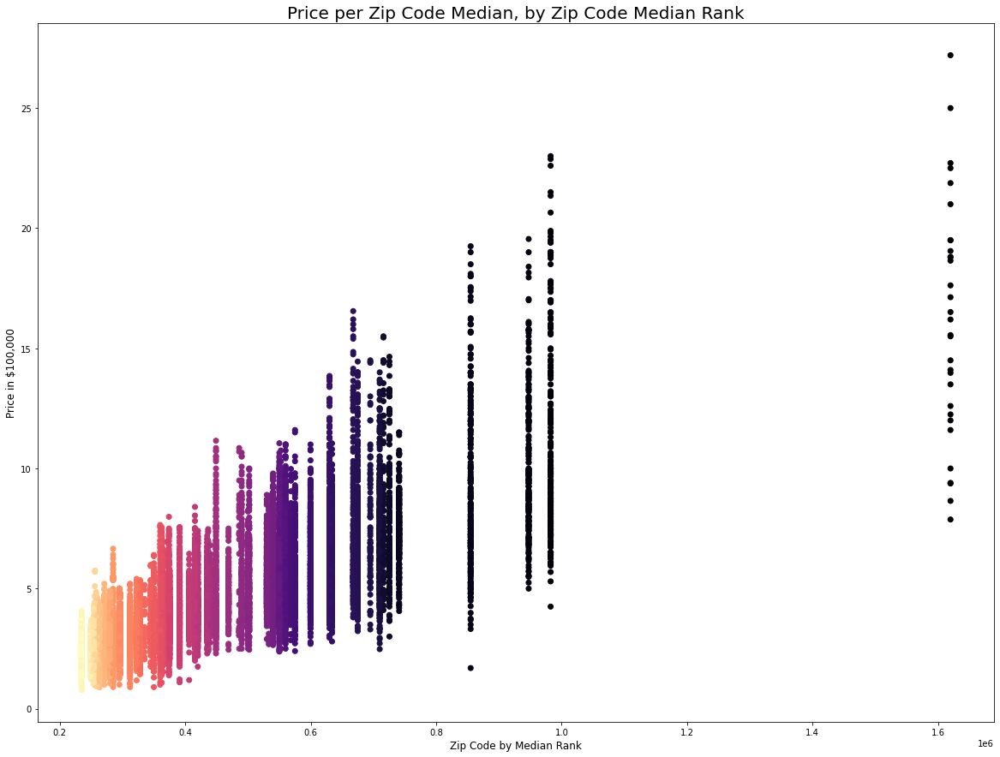

In [60]:
# re-visualize zip code as a color function, using the median zip after outlier removal. 

fig, ax = plt.subplots(figsize=(20, 15))

ax.scatter(df['median_zip'], df['price'] /100000, c=df['zip_rank'], cmap='magma_r')

ax.set_xlabel('Zip Code by Median Rank', fontsize=12)
ax.set_ylabel('Price in $100,000', fontsize=12)
ax.set_title('Price per Zip Code Median, by Zip Code Median Rank', fontsize=20);

# save visualization to png
#plt.savefig('images/zip_prices.png')

''

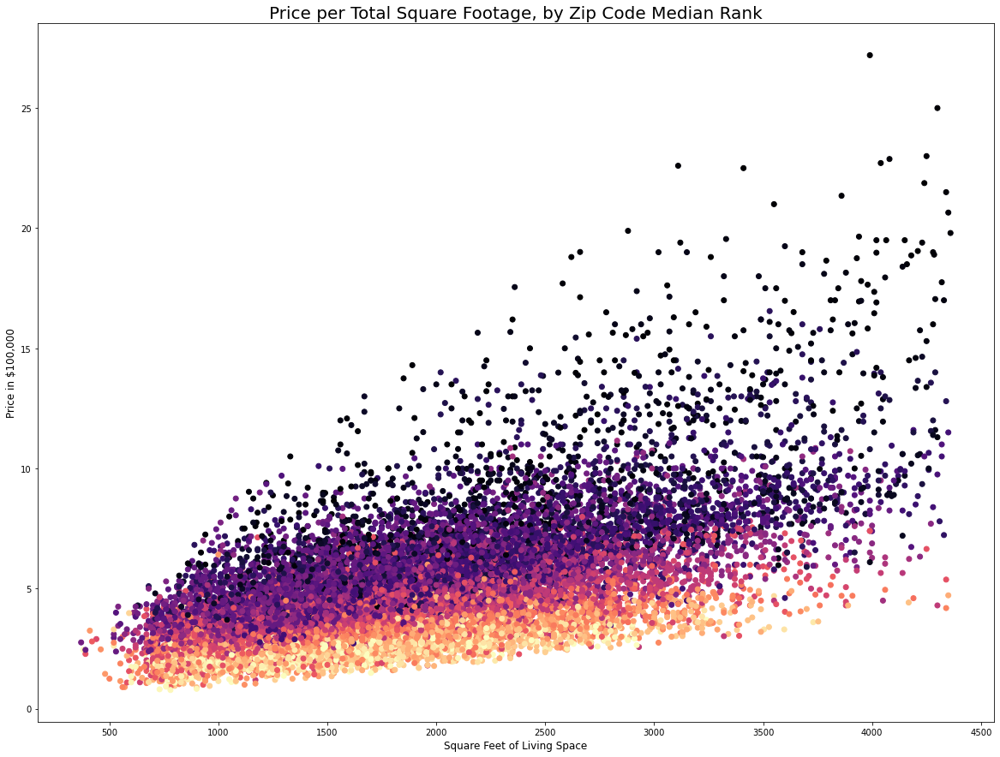

In [61]:
# visualize zip code as a color function, on a plot of price per square footage

fig, ax = plt.subplots(figsize=(20, 15))

ax.scatter(df['sqft_living'], df['price'] /100000, c=df['zip_rank'], cmap='magma_r')

ax.set_xlabel('Square Feet of Living Space', fontsize=12)
ax.set_ylabel('Price in $100,000', fontsize=12)
ax.set_title('Price per Total Square Footage, by Zip Code Median Rank', fontsize=20)
;

Here's a fun way to see the improvements to our data quality after we cleaned outliers! A much deeper color map.

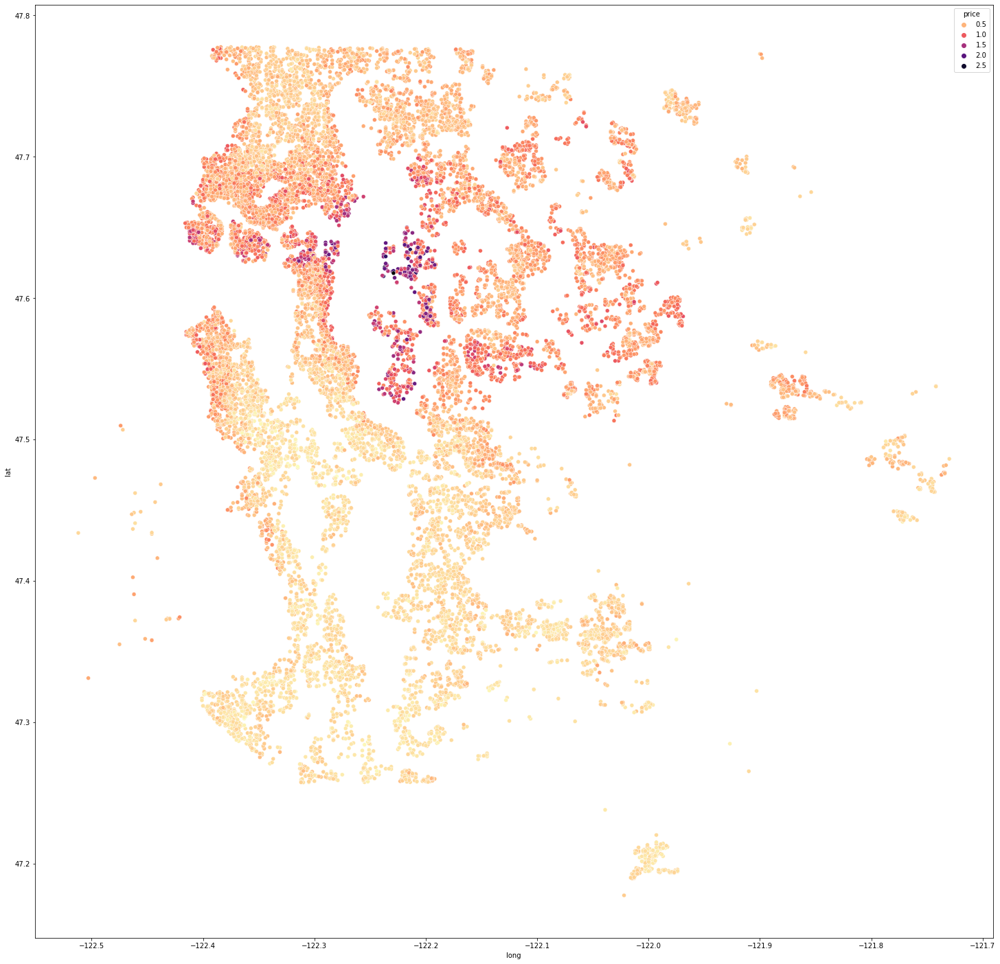

In [62]:
# plotting latitude and longitude as a visual scatter plot to look for location outliers

plt.figure(figsize=(25,25))

ax = sns.scatterplot(data=df, x="long", y="lat", hue='price', palette="magma_r");

# save visualization to png
plt.savefig("images/colored_map.png")
plt.show()

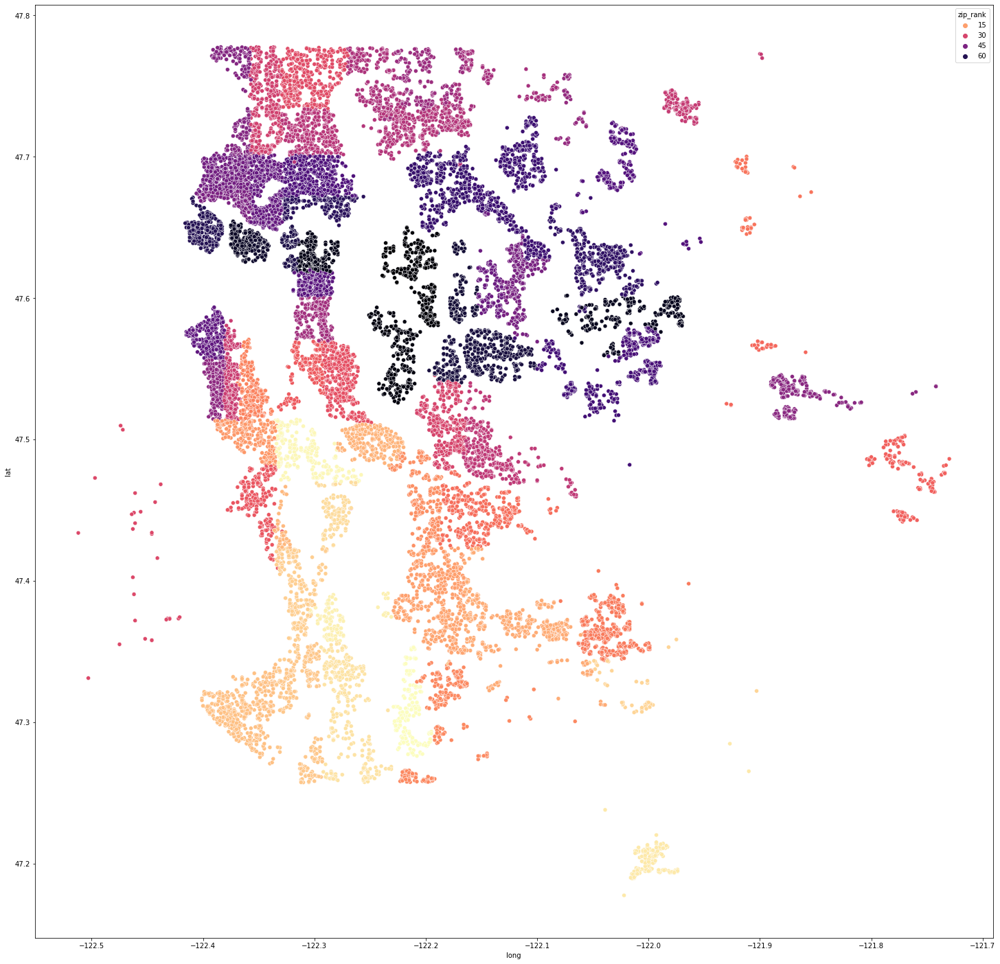

In [63]:
# We can also use our scatter to see the zip codes by rank! Pretty cool.

plt.figure(figsize=(25,25))

sns.scatterplot(data=df, x="long", y="lat", hue="zip_rank", palette="magma_r");

## Study Target Variable

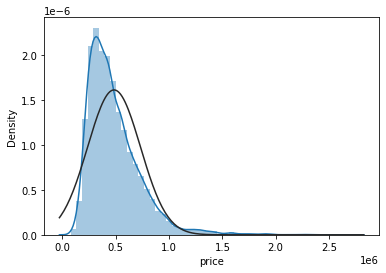

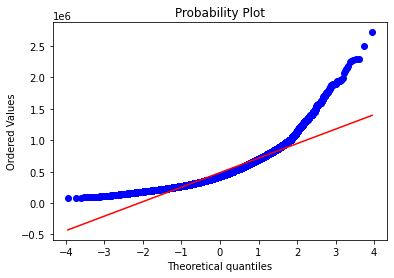

In [64]:
#histogram and normal probability plot
sns.distplot(df['price'], fit=norm);
fig = plt.figure()

res = stats.probplot(df['price'], plot=plt)

# our sales price histogram is positively skewed and has a high peak
# Our QQ-plot shows that we have heavy tails with right skew

In [65]:
#skewness and kurtosis
print("Skewness: %f" % df['price'].skew())
print("Kurtosis: %f" % df['price'].kurt())

# price is highly right skewed
# very positive kurtosis, indicating lots in the tails. We can see those tails in the right skew.

Skewness: 1.819176
Kurtosis: 5.854992


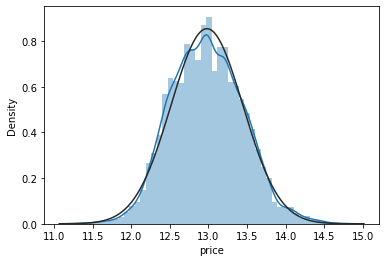

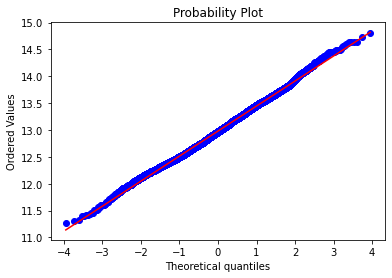

In [66]:
# log transform our target price to improve normality of distribution
df_target_log = np.log(df['price'])

#histogram and normal probability plot
sns.distplot(df_target_log, fit=norm);
fig = plt.figure()
res = stats.probplot(df_target_log, plot=plt)

# Our target price is quite normally distributed when log transformed, so we'll be doing that


## Create Holdout Set

We need to separate our holdout data before any further processing.

The reasons for this are:

    * We will standardize our continuous variables, and you should standardize only on your train set and apply that to your test set.
    * We will be feature engineering on our train set, and applying that later to our test set. We cannot have our test set data leak into our engineered features.

We're going to artificially stratify our train/test sets so that we get samples for all price ranges in both train and test sets. To stratify a continuous target we're using the strategy outlined by Michael J Sanders, located here: https://michaeljsanders.com/2017/03/24/stratify-continuous-variable.html

In [67]:
y = pd.DataFrame(np.log(df['price']))
# get min and max for binning

y.describe()

,price
count,17584.000000
mean,12.979821
std,0.466791
min,11.264464
25%,12.644328
50%,12.971308
75%,13.303017
max,14.816142


In [68]:
# I enter the min price, max price, and how many bins I want
bins = np.linspace(y['price'].min(), y['price'].max()+.01, 5)

# numpy sorts the indices into the proper bins based on value of y
y_binned = np.digitize(y, bins)

In [69]:
# set our random seed for the notebook. We could randomize this each time the notebook is run,
# but ultimately we want all of our train/test splits to use the same data
randomstate = 30785

# creating our train/validation sets and our test sets
train_data, holdout, y_train, y_test = train_test_split(df, y, test_size=0.15, random_state=randomstate, stratify=y_binned)

# reset indices to prevent any index mismatches
train_data.reset_index(inplace=True, drop=True)
holdout.reset_index(inplace=True, drop=True)
y_train.reset_index(inplace=True, drop=True)
y_test.reset_index(inplace=True, drop=True)

## Feature Engineering

We're going to do some target-encoded feature engineering on our data set, using additive smoothing based on this article by Max Halford https://maxhalford.github.io/blog/target-encoding/

Using this method we'll add features for:
   * smoothed zip code
   * smoothed year
   * smoothed month sold
   * smoothed latitude
   * smoothed longitude
   * lat/long zone as function of smoothed lat and smoothed long

This feature engineering is the primary reason that we chose to separate our holdout set before any other processing. We cannot, under any circumstances, use the test data to inform our train set features!

In [70]:
# Adding target encoding, which we will opt to try instead of one-hot with a few models

# get size of training data
num_of_samples = train_data.shape[0]

# determining minimum number of samples for zip and month to use their
# own mean rather than expanding into the full data set mean 
zip_samples = num_of_samples/train_data['zipcode'].unique().shape[0]
month_samples = num_of_samples/train_data['date'].unique().shape[0]

# create smooth additive encoded variables for zipcode, year built, and monthsold
train_data['zip_smooth'] = calc_smooth_mean(train_data, 'zipcode', 'price', zip_samples, train_data)
train_data['year_smooth'] = calc_smooth_mean(train_data, 'yr_built', 'price', 300, train_data)
train_data['month_smooth'] = calc_smooth_mean(train_data, 'date', 'price', month_samples, train_data)

# Create a wider lat and long zone to calculate an area mean
train_data['lat_zone'] = round(train_data['lat'], 2)
train_data['long_zone'] = round(train_data['long'], 2)

# determing min number samples for lat and long mean
lat_samples = num_of_samples/train_data['lat_zone'].unique().shape[0]
long_samples = num_of_samples/train_data['long_zone'].unique().shape[0]

# calculate smooth mean variables for lat and long, then create an interactive variable describing both together
train_data['lat_smooth'] = calc_smooth_mean(train_data, 'lat_zone', 'price', lat_samples, train_data)
train_data['long_smooth'] = calc_smooth_mean(train_data, 'long_zone', 'price', long_samples, train_data)
train_data['lat_long'] = (train_data['lat_smooth'] + train_data['long_smooth'])/2

## Correlations/Multicollinearity

Time to check and remove any features with high collinearity.

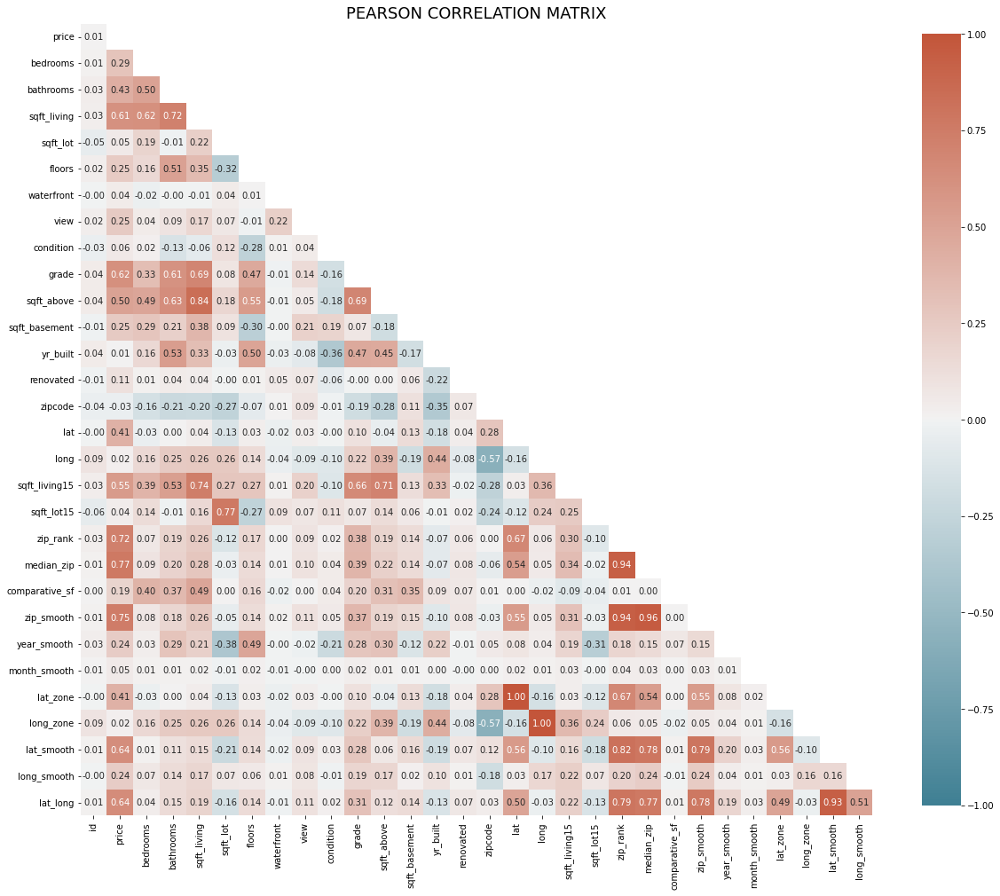

In [71]:
# look for multicollinearity of features
fig, ax = plt.subplots(figsize=(20, 20))

# get the correlations for our train data
train_data_c = train_data.corr()

# we want our heatmap to not show the upper triangle, which is redundant data
# get a mask for the upper diagonal
train_data_c_mask = np.triu(np.ones_like(train_data_c, dtype=np.bool))

# adjust mask and df to hide center diagonal
train_data_c_mask = train_data_c_mask[1:, :-1]
corr = train_data_c.iloc[1:,:-1].copy()

# color map
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# plot heatmap
sns.heatmap(corr, mask=train_data_c_mask, annot=True, fmt=".2f", cmap=cmap,
           vmin=-1, vmax=1, cbar_kws={"shrink": .8}, square=True)

# title
plt.title('PEARSON CORRELATION MATRIX', fontsize=18)

plt.show()

In [72]:
train_data.corr()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,renovated,zipcode,lat,long,sqft_living15,sqft_lot15,zip_rank,median_zip,comparative_sf,zip_smooth,year_smooth,month_smooth,lat_zone,long_zone,lat_smooth,long_smooth,lat_long
id,1.000000,0.007146,0.010226,0.033874,0.028935,-0.049930,0.024923,-0.004136,0.023698,-0.032205,0.039311,0.039209,-0.014353,0.042706,-0.014442,-0.035931,-0.004870,0.086564,0.034560,-0.056988,0.030334,0.012952,0.004854,0.012893,0.025024,0.005247,-0.004613,0.086549,0.009443,-0.000255,0.008157
price,0.007146,1.000000,0.291983,0.434495,0.612653,0.049715,0.249533,0.040515,0.251185,0.060511,0.618166,0.503859,0.250789,0.005094,0.111494,-0.033955,0.410999,0.019781,0.552193,0.036977,0.721886,0.772583,0.192555,0.749343,0.238880,0.054681,0.411033,0.019865,0.635221,0.235182,0.641636
bedrooms,0.010226,0.291983,1.000000,0.503590,0.619176,0.191129,0.163875,-0.024031,0.042100,0.021008,0.329195,0.488392,0.288941,0.160100,0.014663,-0.162792,-0.031412,0.157311,0.392398,0.136031,0.065664,0.087949,0.402874,0.075494,0.029225,0.011552,-0.031242,0.157074,0.011029,0.070133,0.035470
bathrooms,0.033874,0.434495,0.503590,1.000000,0.715299,-0.008080,0.514634,-0.004842,0.088680,-0.134756,0.607452,0.634120,0.214879,0.532087,0.042637,-0.214520,0.000034,0.251984,0.531135,-0.012815,0.190127,0.198069,0.366915,0.176380,0.294723,0.012622,0.000061,0.252043,0.110246,0.139846,0.147836
sqft_living,0.028935,0.612653,0.619176,0.715299,1.000000,0.218846,0.349464,-0.005979,0.166079,-0.062578,0.691698,0.839135,0.381023,0.331492,0.035472,-0.203802,0.037312,0.261976,0.737108,0.161095,0.255112,0.280721,0.490727,0.261551,0.214645,0.015615,0.037447,0.261962,0.145455,0.174527,0.191374
sqft_lot,-0.049930,0.049715,0.191129,-0.008080,0.218846,1.000000,-0.322932,0.044127,0.067398,0.124477,0.078799,0.177133,0.094540,-0.028543,-0.000468,-0.268747,-0.126062,0.261801,0.273690,0.770720,-0.117686,-0.034172,0.003954,-0.046946,-0.378332,-0.008578,-0.125790,0.261845,-0.214824,0.065602,-0.163532
floors,0.024923,0.249533,0.163875,0.514634,0.349464,-0.322932,1.000000,0.007535,-0.014498,-0.280745,0.467258,0.548702,-0.301120,0.497738,0.008071,-0.066446,0.026880,0.143255,0.274646,-0.273327,0.170314,0.144421,0.162277,0.135663,0.490839,0.018209,0.026639,0.142991,0.139727,0.058082,0.143477
waterfront,-0.004136,0.040515,-0.024031,-0.004842,-0.005979,0.044127,0.007535,1.000000,0.220703,0.014345,-0.011791,-0.005247,-0.001887,-0.028595,0.052059,0.005277,-0.023968,-0.036575,0.011790,0.094200,0.004673,0.007805,-0.020454,0.015619,-0.001205,-0.006909,-0.023640,-0.036874,-0.019811,0.009938,-0.013649
view,0.023698,0.251185,0.042100,0.088680,0.166079,0.067398,-0.014498,0.220703,1.000000,0.039714,0.142566,0.054001,0.208393,-0.076106,0.068400,0.087883,0.027936,-0.086387,0.204117,0.070381,0.093658,0.096161,0.002781,0.108162,-0.016308,-0.000731,0.027965,-0.086517,0.087172,0.079295,0.105373
condition,-0.032205,0.060511,0.021008,-0.134756,-0.062578,0.124477,-0.280745,0.014345,0.039714,1.000000,-0.164744,-0.179713,0.192436,-0.359594,-0.063783,-0.009653,-0.003541,-0.097381,-0.103246,0.113312,0.022152,0.043387,0.044370,0.049672,-0.209098,0.000354,-0.003500,-0.097107,0.030611,-0.013194,0.021885


In [73]:
#Get our list of highly correlated feature pairs with following steps:

# save correlation matrix as a new data frame
# converts all values to absolute value
# stacks the row:column pairs into a multindex
# reset the index to set the multindex to seperate columns
# sort values. 0 is the column automatically generated by the stacking
df_correlations = train_data.corr().abs().stack().reset_index().sort_values(0, ascending=False)

# zip the variable name columns in a new column named "pairs"
df_correlations['pairs'] = list(zip(df_correlations.level_0, df_correlations.level_1))

# set index to pairs
df_correlations.set_index(['pairs'], inplace = True)

# rename our results column to correlation
df_correlations.rename(columns={0: "correlation"}, inplace=True)

# Drop 1:1 correlations to get rid of self pairs
df_correlations.drop(df_correlations[df_correlations['correlation'] == 1.000000].index, inplace=True)

# view pairs above 70% correlation and below 90% correlation (engineered features will correlate with each other above 95%)
df_correlations[(df_correlations.correlation>.75) & (df_correlations.correlation<.95)]


,level_0,level_1,correlation
pairs,,,
"(zip_rank, median_zip)",zip_rank,median_zip,0.937411
"(median_zip, zip_rank)",median_zip,zip_rank,0.937411
"(zip_smooth, zip_rank)",zip_smooth,zip_rank,0.935722
"(zip_rank, zip_smooth)",zip_rank,zip_smooth,0.935722
"(lat_long, lat_smooth)",lat_long,lat_smooth,0.931481
"(lat_smooth, lat_long)",lat_smooth,lat_long,0.931481
"(sqft_living, sqft_above)",sqft_living,sqft_above,0.839135
"(sqft_above, sqft_living)",sqft_above,sqft_living,0.839135
"(lat_smooth, zip_rank)",lat_smooth,zip_rank,0.819068


median_zip and zip_rank are dummy variables that we won't be using, so we can ignore correlations using those for now.

We drop sqft_above and sqft_lot15

In [74]:
# drop multicollinear features and unneeded features
train_data.drop(['id', 'zip_rank', 'median_zip', 'sqft_above', 'sqft_lot15'], axis=1, inplace=True)

In [75]:
# Check out our variables correlationg with price
df_correlations = train_data.corr().abs().stack().reset_index().sort_values(0, ascending=False)
df_correlations.loc[df_correlations['level_0'] == 'price'].sort_values(0, ascending=False)

,level_0,level_1,0
0,price,price,1.000000
18,price,zip_smooth,0.749343
25,price,lat_long,0.641636
23,price,lat_smooth,0.635221
9,price,grade,0.618166
3,price,sqft_living,0.612653
16,price,sqft_living15,0.552193
2,price,bathrooms,0.434495
21,price,lat_zone,0.411033
14,price,lat,0.410999


It looks like zip code works better than the lat/long zones I made. We should also note here that zip and lat/long descriptors are all highly correlated, so we should consider if we need to include all of them in our model or just the best one (zipcode)

We can get a sense of the most important features to our price from our correlation table. Zipcode as a plain variable does not correlate, which makes sense, because without some sort of transformation it is an arbitrary unordered number. We can see how transformed as zip_smooth, median_zip, or zip_rank it becomes the MOST important contributor to price. We can see here that big contributors to price include:
    
    * zip code (in some altered form, not as arbitrary number)
    * grade
    * sqft_living
    * bathrooms

## Polynomial Relationships

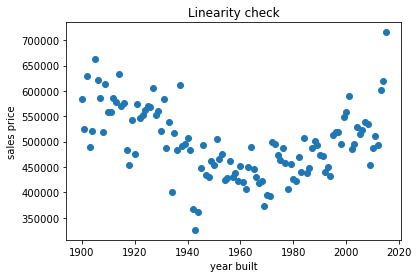

In [76]:
# Checking out our mean sales price for year built scattered versus price shows a polynomial relationship

yearly_prices = train_data.groupby('yr_built')['price'].mean()

plt.scatter(yearly_prices.index, yearly_prices)
plt.title("Linearity check")
plt.xlabel('year built')
plt.ylabel('sales price')
plt.show()

Seems like year built might have a polynomial relationship with price

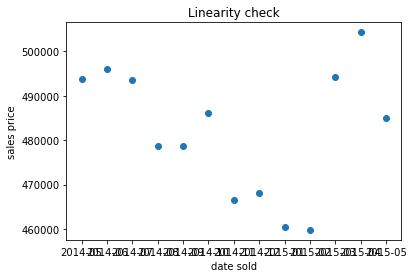

In [77]:
# Checking out our mean sales price for month sold scattered versus price shows a polynomial relationship
monthly_prices = train_data.groupby('date')['price'].mean()

plt.scatter(monthly_prices.index, monthly_prices)
plt.title("Linearity check")
plt.xlabel('date sold')
plt.ylabel('sales price')
plt.show()

Month sold has no polynomial relationship

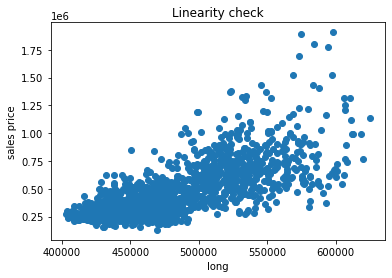

In [78]:
# Checking out our mean sales price for longitude does not show a polynomial relationship
long_prices = train_data.groupby('lat_long')['price'].mean()

plt.scatter(long_prices.index, long_prices)
plt.title("Linearity check")
plt.xlabel('long')
plt.ylabel('sales price')
plt.show()

There does not appear to be a polynomial relationship

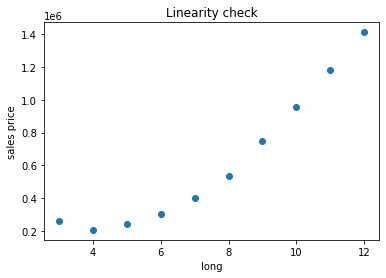

In [79]:
# Checking out our mean sales price for grade shows a polynomial relationship
grade_prices = train_data.groupby('grade')['price'].mean()

plt.scatter(grade_prices.index, grade_prices)
plt.title("Linearity check")
plt.xlabel('long')
plt.ylabel('sales price')
plt.show()

Grade appears to have a polynomial relationship

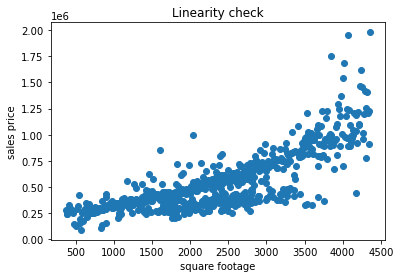

In [80]:
# Checking out our mean sales price for grade shows a polynomial relationship
grade_prices = train_data.groupby('sqft_living')['price'].mean()

plt.scatter(grade_prices.index, grade_prices)
plt.title("Linearity check")
plt.xlabel('square footage')
plt.ylabel('sales price')
plt.show()

## Visualize Categoricals

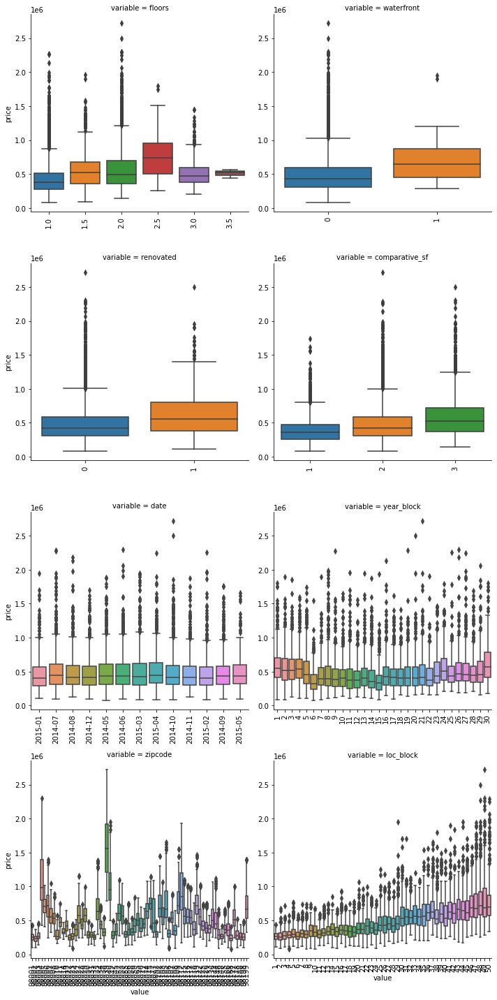

In [81]:
categoricals = ['floors', 'waterfront', 'renovated', 'comparative_sf', 'date', 'yr_built', 'zipcode', 'lat_long'] #

# make our categorical data frame to work with
df_categoricals = train_data[categoricals]

# binning our year built bins
df_categoricals["year_block"] = pd.qcut(df_categoricals['yr_built'], q=30, labels=np.array(range(1,30+1)))

# binning our latitude bins
df_categoricals["loc_block"] = pd.qcut(df_categoricals['lat_long'], q=50, labels=np.array(range(1,50+1)))

# dropping the original categories we just binned
df_categoricals.drop(['yr_built', 'lat_long'], axis=1, inplace=True)

# telling Pandas that these columns are categoricals
for item in df_categoricals.columns:
    df_categoricals[item] = df_categoricals[item].astype('category')

# temporarily adding price to our dataframe so that we can do some visualizations    
df_categoricals['price'] = train_data['price']

# plot our categoricals as box plots vs price
def boxplot(x, y, **kwargs):
    sns.boxplot(x=x, y=y)
    x=plt.xticks(rotation=90)

#visualization categories
categorical=['floors', 'waterfront', 'renovated', 'comparative_sf', 'date', 'year_block', 'zipcode', 'loc_block']
f = pd.melt(df_categoricals, id_vars=['price'], value_vars=categorical)
g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False, size=5)
g = g.map(boxplot, "value", "price")

df_categoricals.drop('price', axis=1, inplace=True)

In [82]:
# make a processed one hot file 

final_cats =  ['floors', 'waterfront', 'renovated','comparative_sf', 'zipcode', 'date', 'year_block', 'loc_block']

df_cats_train = pd.get_dummies(df_categoricals[final_cats], prefix=final_cats, drop_first=True)

## Visualize Continuous

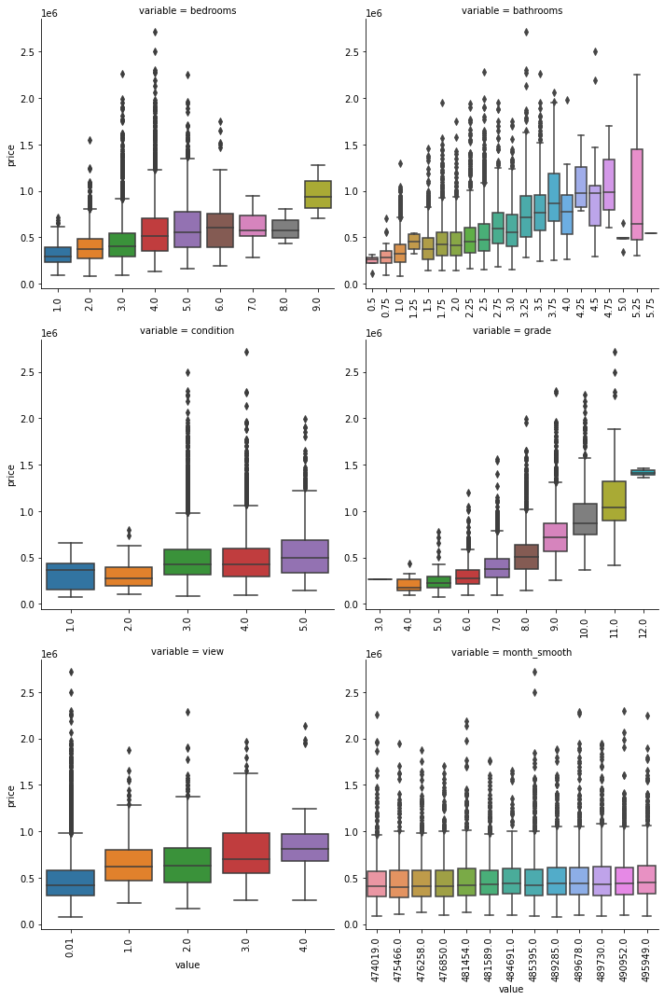

In [83]:
continuous = ['sqft_living', 'sqft_living15', 'sqft_lot', 'sqft_basement', 'view', 'bedrooms', 'bathrooms', 'condition', 'grade', 'zip_smooth', 'year_smooth', 'month_smooth', 'lat_long'] #'floors',  

# make our continuous frame to work with
x_continuous = train_data[continuous]
x_continuous['price'] = train_data['price']

# plot our smaller choice continuous as box plots vs price
small_cont = ['bedrooms', 'bathrooms', 'condition', 'grade', 'view', 'month_smooth'] 

def boxplot(x, y, **kwargs):
    sns.boxplot(x=x, y=y)
    x=plt.xticks(rotation=90)

f = pd.melt(x_continuous, id_vars=['price'], value_vars=small_cont)
g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False, size=5)
g = g.map(boxplot, "value", "price")

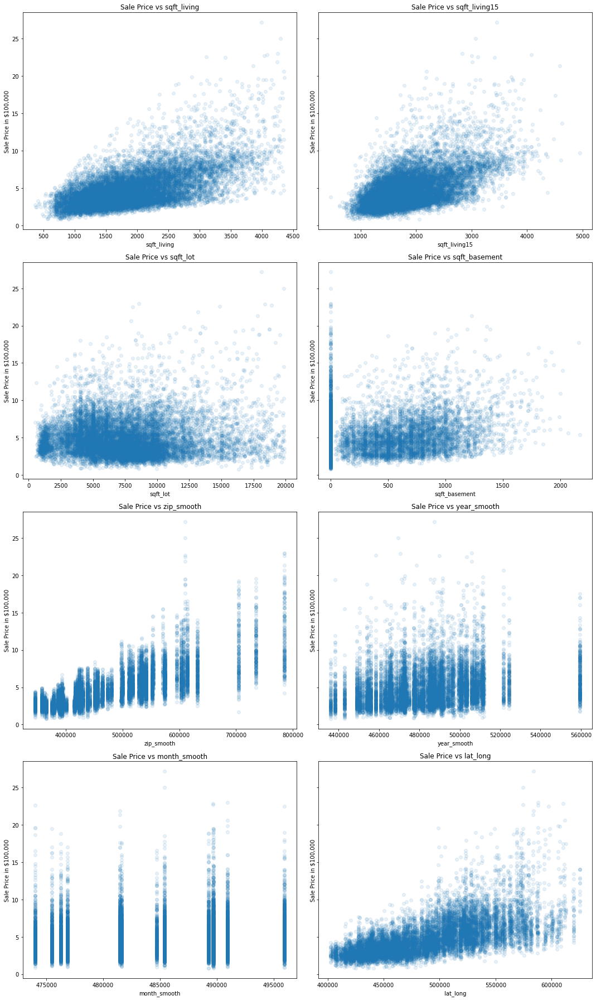

In [84]:
# plot our larger continuous as scatter plots vs price
large_cont = ['sqft_living', 'sqft_living15', 'sqft_lot', 'sqft_basement', 'zip_smooth', 'year_smooth', 'month_smooth', 'lat_long']

fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15,25), sharey=True)

for ax, column in zip(axes.flatten(), large_cont):
    ax.scatter(x_continuous[column], x_continuous['price']/100000, label=column, alpha=.1)
    ax.set_title(f'Sale Price vs {column}')
    ax.set_xlabel(column)
    ax.set_ylabel('Sale Price in $100,000')

fig.tight_layout()

x_continuous.drop('price', axis=1, inplace=True)

    * sqft_living, sqft_living15, zip_smooth, lat_long, sqft_basement(when present) have a very strong visual relationship with price
    * sqft_lot do not appear to have a strong relationship with price
    * year_smooth and month_smooth are unclear, we will investigate further

Fun fact - "grade" was not well defined in the features list. I looked it up and found that grade is "	Classification by construction quality which refers to the types of materials used and the quality of workmanship. Buildings of better quality (higher grade) cost more to build per unit of measure and command higher value." So, it's the quality of building materials, and DEFINITELY worth keeping in our model.

## Finding Interactions

The test_feature_combinations function finds all of the feature combinations possible in our dataset. Then for each combination, the function runs a linear regression with cross validation on 5 folds and gets the r^2 score for the regression including that feature combination. All scores are recorded and r^2 score improvement is assessed, with the resulting table giving the increase in model improvement from a feature combo. 

In [85]:
# running our function on our continuous variables to look for improvement
# our R2 is much lower for model base score because we aren't including our categorical variables in this improvement assessment

scoring_df = test_feature_combinations(y_train, x_continuous)

Model base score is  0.8165
sqft_living sqft_living15 0.821
sqft_living sqft_lot 0.8171
sqft_living sqft_basement 0.8174
sqft_living view 0.8182
sqft_living bedrooms 0.8179
sqft_living bathrooms 0.8171
sqft_living condition 0.8165
sqft_living grade 0.8185
sqft_living zip_smooth 0.8191
sqft_living year_smooth 0.8165
sqft_living month_smooth 0.8165
sqft_living lat_long 0.8187
sqft_living15 sqft_lot 0.8167
sqft_living15 sqft_basement 0.8171
sqft_living15 view 0.817
sqft_living15 bedrooms 0.8187
sqft_living15 bathrooms 0.8184
sqft_living15 condition 0.8169
sqft_living15 grade 0.8193
sqft_living15 zip_smooth 0.8197
sqft_living15 year_smooth 0.8171
sqft_living15 month_smooth 0.8165
sqft_living15 lat_long 0.8192
sqft_lot sqft_basement 0.8172
sqft_lot view 0.8168
sqft_lot bedrooms 0.8174
sqft_lot bathrooms 0.8167
sqft_lot condition 0.817
sqft_lot grade 0.8166
sqft_lot zip_smooth 0.8172
sqft_lot year_smooth 0.8167
sqft_lot month_smooth 0.8166
sqft_lot lat_long 0.8176
sqft_basement view 0.817
sq

In [86]:
# showing our improvement scores for our interactions

scoring_df.sort_values('improvement', ascending=False)

,feature1,feature2,scores,improvement
74,zip_smooth,lat_long,0.8252,0.0087
0,sqft_living,sqft_living15,0.8210,0.0045
68,grade,zip_smooth,0.8203,0.0038
19,sqft_living15,zip_smooth,0.8197,0.0032
71,grade,lat_long,0.8196,0.0031
...,...,...,...,...
21,sqft_living15,month_smooth,0.8165,0.0000
10,sqft_living,month_smooth,0.8165,0.0000
9,sqft_living,year_smooth,0.8165,0.0000
6,sqft_living,condition,0.8165,0.0000


We see no real improvements based on feature combinations, and opt to add none.

# Cleaning Final Data

## Standardize and Transform

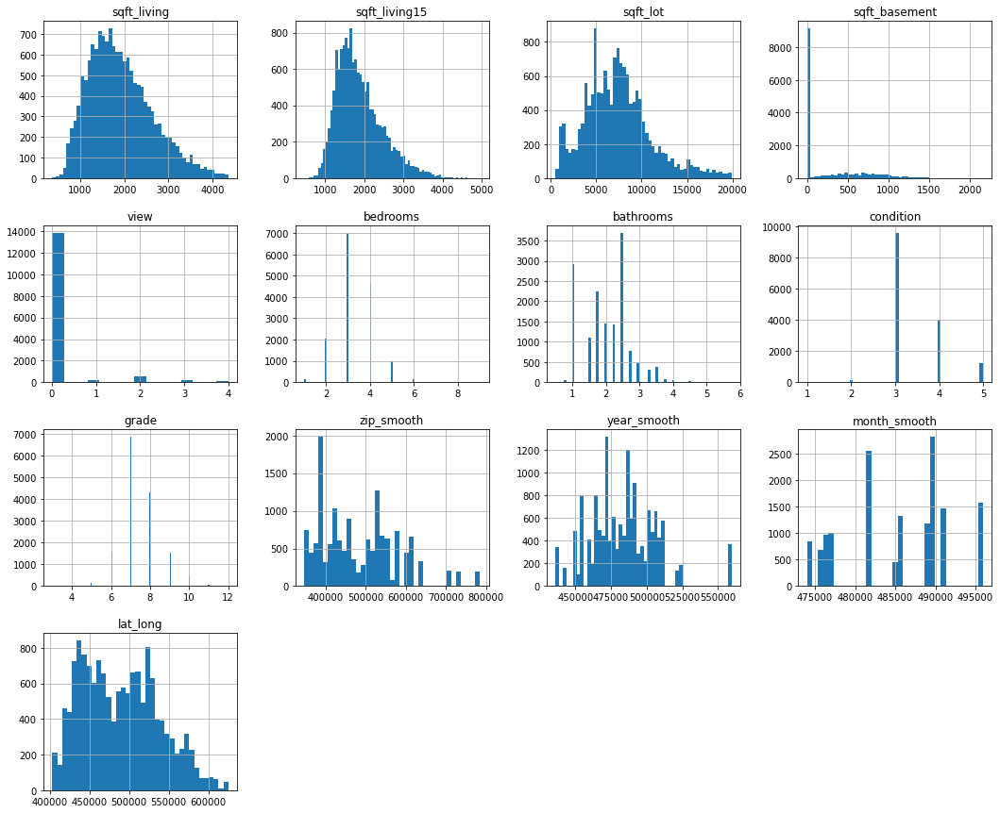

In [87]:
# check out our histograms to see if we should transform our data before scaling

x_continuous.hist(figsize=(18,15), bins='auto');

We will log transform our data, and standardize our continuous inputs.

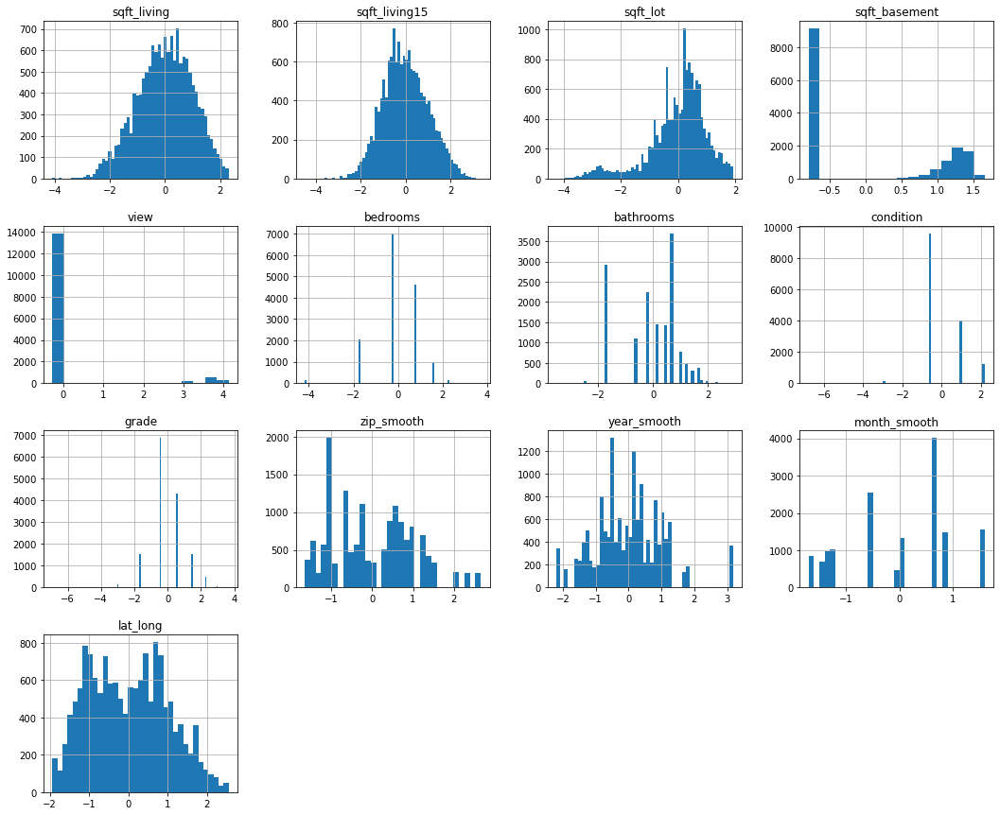

In [88]:
# log transform
log_continuous = np.log(x_continuous)

# standardize all of our values with scikit-learn StandardScaler
scaler = StandardScaler()

scaled_continuous = pd.DataFrame(scaler.fit_transform(log_continuous),columns = log_continuous.columns)
scaled_continuous.head(5)

# Our scaled and transformed continuous features

scaled_continuous.hist(figsize=(18,15), bins='auto');

We're ready to make our final continuous data set.

In [89]:
# make a processed continuous frame

continuous =  ['sqft_living', 'sqft_living15', 'sqft_lot', 'sqft_basement', 'view', 'bedrooms', 'bathrooms', 'condition', 'grade',  'zip_smooth', 'year_smooth', 'month_smooth', 'lat_long']  

df_cont_train = scaled_continuous[continuous]

## Add Polynomial Features

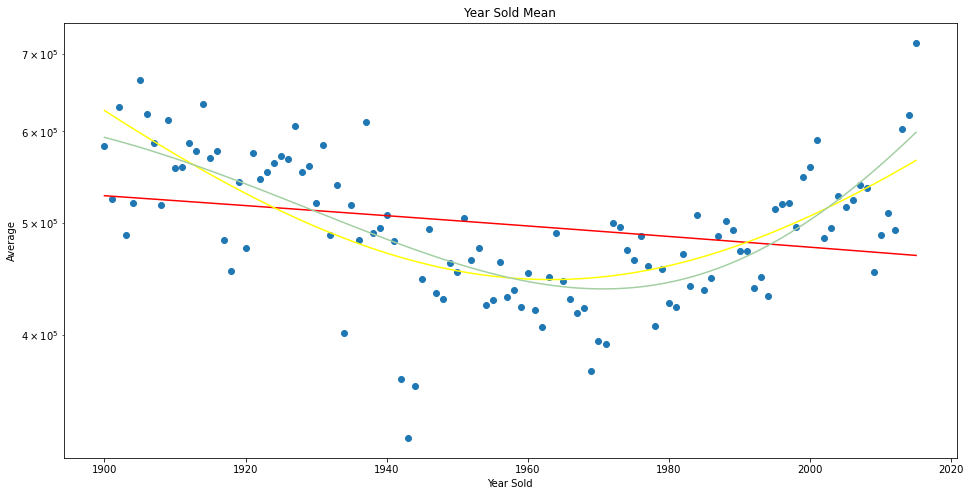

In [90]:
# group by average year built mean to see relationship
y = train_data.groupby('yr_built')['price'].mean()
plot_polys(y, "Year Sold", "Year Sold Mean")

We'll add year built as a second degree polynomial.

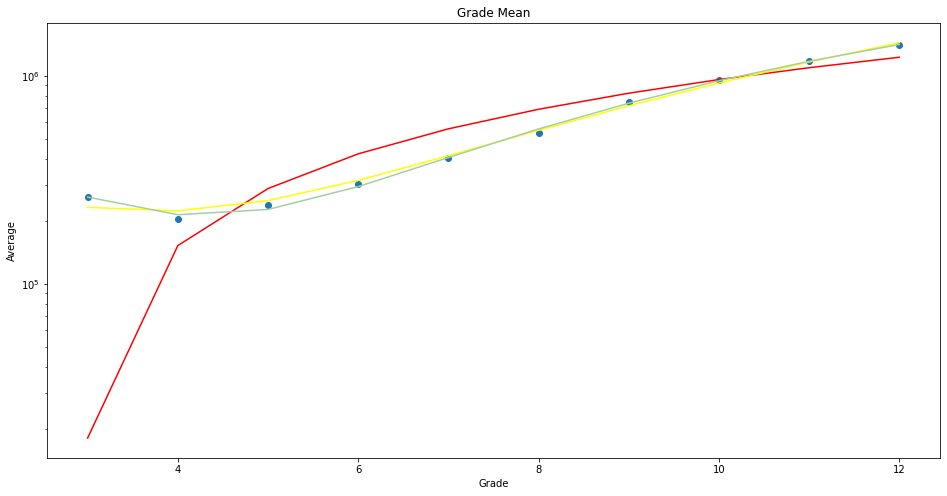

In [91]:
# group by grade mean to see relationship
y = train_data.groupby('grade')['price'].mean()
plot_polys(y,'Grade', "Grade Mean")

We will express this as a second degree polynomial.

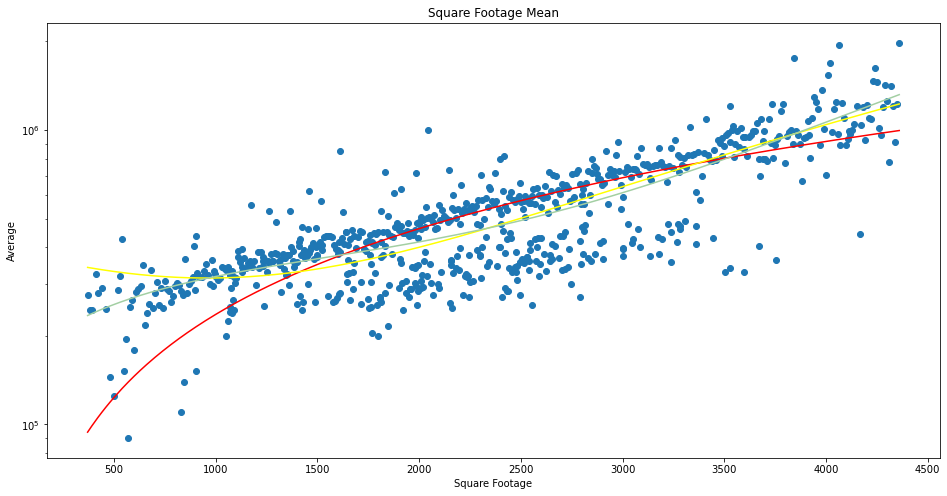

In [92]:
# group by grade mean to see relationship
y = train_data.groupby('sqft_living')['price'].mean()
plot_polys(y,'Square Footage', "Square Footage Mean")

This looks better expressed with a third degree polynomial

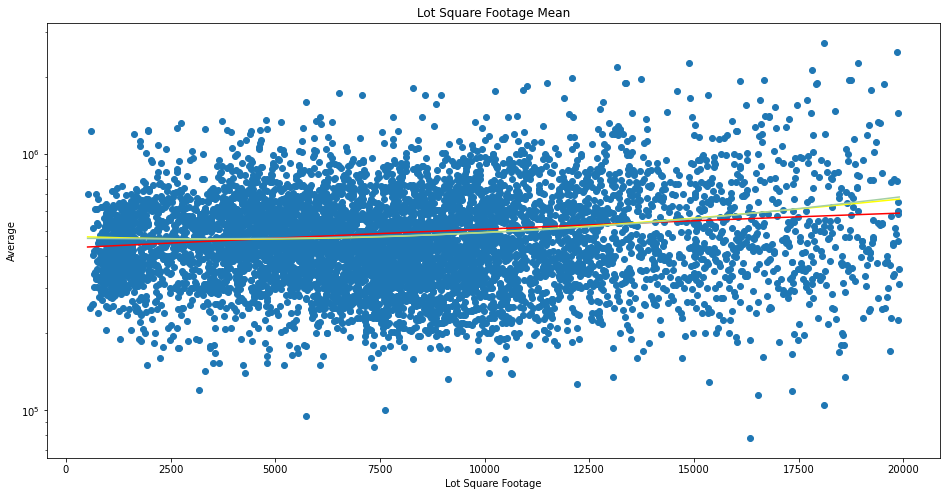

In [93]:
# group by grade mean to see relationship
y = train_data.groupby('sqft_lot')['price'].mean()
plot_polys(y,'Lot Square Footage', "Lot Square Footage Mean")

No clear relationship

In [94]:
year_poly = create_polynomial_array(df_cont_train, 'year_smooth', 2)
grade_poly = create_polynomial_array(df_cont_train, 'grade', 2)
sq_ft_poly = create_polynomial_array(df_cont_train, 'sqft_living', 3)

df_cont_train['grade1'] = grade_poly[1]
df_cont_train['year1'] = year_poly[1]
df_cont_train['sqft_living3'] = sq_ft_poly[2]
df_cont_train['sqft_living2'] = sq_ft_poly[1]


## Process Test Set

We now need to process our holdout in the same way we processed our training set.

##### Target Encoding

In [95]:
# apply target encoding to test data, using train data to map

# create smooth additive encoded variables for zipcode, year built, and monthsold
holdout['zip_smooth'] = calc_smooth_mean(train_data, 'zipcode', 'price', zip_samples, holdout)
holdout['year_smooth'] = calc_smooth_mean(train_data, 'yr_built', 'price', 300, holdout)
holdout['month_smooth'] = calc_smooth_mean(train_data, 'date', 'price', month_samples, holdout)


# Create a wider lat and long zone to calculate an area mean
holdout['lat_zone'] = round(holdout['lat'], 2)
holdout['long_zone'] = round(holdout['long'], 2)

# calculate smooth mean variables for lat and long, then create an interactive variable describing both together
holdout['lat_smooth'] = calc_smooth_mean(train_data, 'lat_zone', 'price', lat_samples, holdout)
holdout['long_smooth'] = calc_smooth_mean(train_data, 'long_zone', 'price', long_samples, holdout)
holdout['lat_long'] = (holdout['lat_smooth'] + holdout['long_smooth'])/2
holdout.fillna(holdout.mean(), inplace=True)

##### Process Categoricals

In [96]:
# Process Holdout Categoricals

holdout_categoricals = holdout[categoricals]

# binning our year built bins
holdout_categoricals["year_block"] = pd.qcut(holdout_categoricals['yr_built'], q=30, labels=np.array(range(1,30+1)))

# binning our latitude bins
holdout_categoricals["loc_block"] = pd.qcut(holdout_categoricals['lat_long'], q=50, labels=np.array(range(1,50+1)))

holdout_categoricals.drop(['yr_built'], axis=1, inplace=True)

# telling Pandas that these columns are categoricals
for item in holdout_categoricals.columns:
    holdout_categoricals[item] = holdout_categoricals[item].astype('category')

# make a processed bins file for use with linear regression
df_cats_test = pd.get_dummies(holdout_categoricals[final_cats], prefix=final_cats, drop_first=True)

##### Process Continuous

In [97]:
# Process Holdout Continuous

holdout_continuous = holdout[continuous]

# log transform
log_holdout = np.log(holdout_continuous)

# standard scaler
scaled_holdout_continuous = pd.DataFrame(scaler.transform(log_holdout),columns = log_holdout.columns)

# adding polynomial features

year_poly = create_polynomial_array(scaled_holdout_continuous, 'year_smooth', 2)
grade_poly = create_polynomial_array(scaled_holdout_continuous, 'grade', 2)
sq_ft_poly = create_polynomial_array(scaled_holdout_continuous, 'sqft_living', 3)

scaled_holdout_continuous['grade1'] = grade_poly[1]
scaled_holdout_continuous['year1'] = year_poly[1]
scaled_holdout_continuous['sqft_living3'] = sq_ft_poly[2]
scaled_holdout_continuous['sqft_living2'] = sq_ft_poly[1]

## Create Train/Test Final Set

In [98]:
X_train = pd.concat([df_cont_train, df_cats_train], axis=1)
X_test = pd.concat([scaled_holdout_continuous, df_cats_test], axis=1)

test_actual = np.array(np.exp(y_test))

In [99]:
y_train = np.array(y_train).ravel()
y_test = np.array(y_test).ravel()

# Modeling

In order to keep track of our results, we'll be making a dictionary to store our model scores.

In [100]:
# prepare dictionary to store results
models = {}
models['model'] = []
models['r2'] = []
models['mae'] = []
models['rmse'] = [] 

In [101]:
# Unless we specify a different model, this is our baseline model
model = LinearRegression()

##### Visualizing Base Features via Residuals Map

We can use residuals plots to determine if features are important enough to add to our model. If we regress our target on a predictor, and then plot those residuals against a DIFFERENT predictor, our plot will tell us if the new feature might add to our model.

We're going to add features in order of their correlation with price on our correlation heat map, so our base feature is a transformed zip code because it has the strongest correlation.

We regress our target on zip code (we'll use zip_smooth), then we plot our residuals against total square footage.

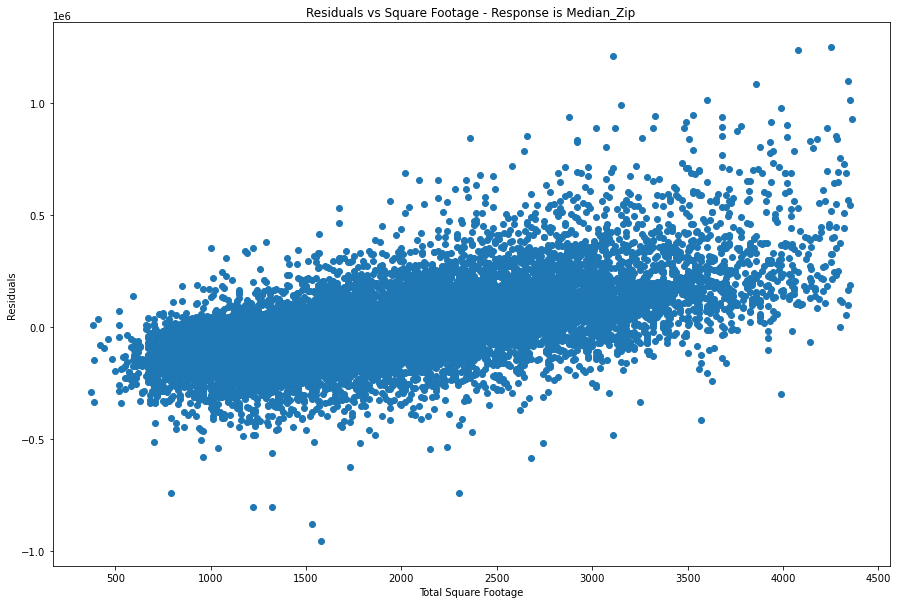

In [102]:
x, y = np.array(df['median_zip']).reshape(-1,1), df['price']
z = np.array(df['sqft_living']).reshape(-1,1)

model = LinearRegression()
model.fit(x, y)

test_predictions = model.predict(x)

residuals = y - test_predictions

fig = plt.figure(figsize=(15,10))

# Add labels for x and y axes
plt.xlabel('Total Square Footage')
plt.ylabel('Residuals')

# Add a title for the plot
plt.title('Residuals vs Square Footage - Response is Median_Zip')


plt.scatter(z, residuals, label="sample");

We can see a clear pattern in our residuals, which tells us that adding square footage will add to our model. Now we know this already from our correlation map, but this visual reinforces that information.

We'll do the same regression on zip code again, this time residuals plotted against grade. Again a relationship can be seen.

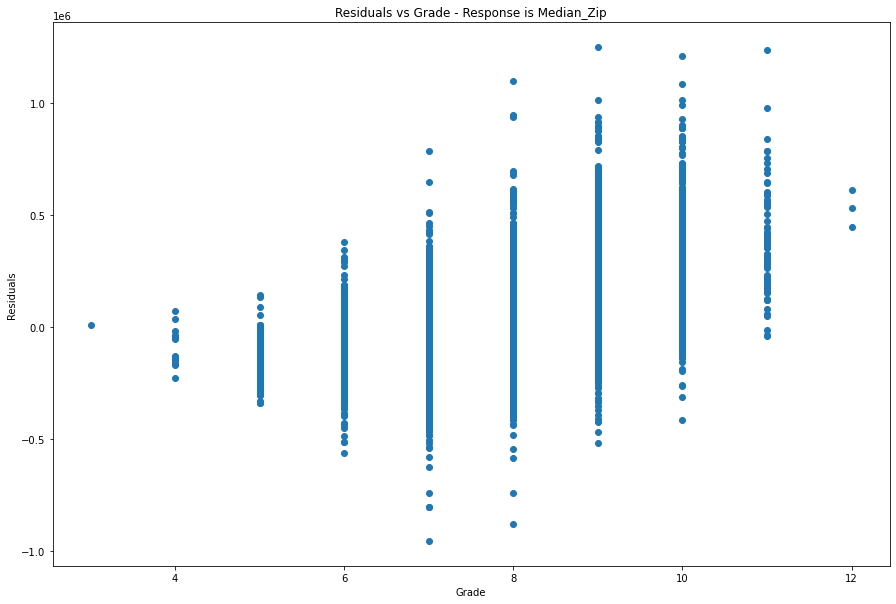

In [103]:
x, y = np.array(df['median_zip']).reshape(-1,1), df['price']
z = np.array(df['grade']).reshape(-1,1)

model.fit(x, y)

test_predictions = model.predict(x)

residuals = y - test_predictions

fig = plt.figure(figsize=(15,10))

# Add labels for x and y axes
plt.xlabel('Grade')
plt.ylabel('Residuals')

# Add a title for the plot
plt.title('Residuals vs Grade - Response is Median_Zip')


plt.scatter(z, residuals, label="sample");

We can see from this graph that Grade has relevance to our model, because the data show a clear pattern. 

Contrast this with yr_built, our lowest correlated feature before we encoded it.

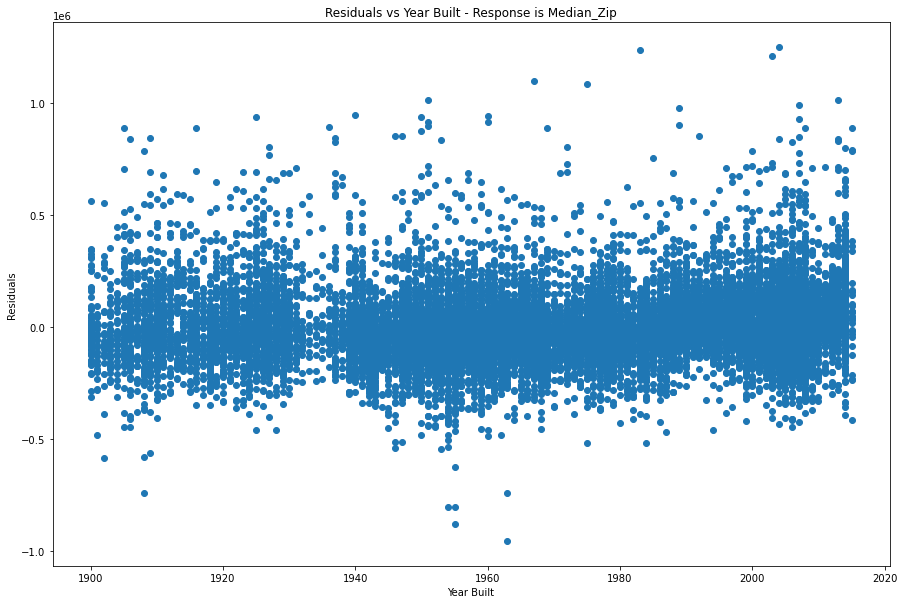

In [104]:
x, y = np.array(df['median_zip']).reshape(-1,1), df['price']
z = np.array(df['yr_built']).reshape(-1,1)

model.fit(x, y)

test_predictions = model.predict(x)

residuals = y - test_predictions

fig = plt.figure(figsize=(15,10))

# Add labels for x and y axes
plt.xlabel('Year Built')
plt.ylabel('Residuals')

# Add a title for the plot
plt.title('Residuals vs Year Built - Response is Median_Zip')

plt.scatter(z, residuals, label="sample");

Our scatter looks like a normal residuals plot, implying that the year built does not add much to our model. There's no strong trend exhibited here. If we can see a pattern when we plot residuals vs a different predictor, it can tell us if a feature might add value to our model.

## Spot Check Models

In [102]:
# Set upline models
baseline_models = {
    "LR": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state = randomstate),
    "Elastic Net": ElasticNet(random_state = randomstate, normalize=True, copy_X=True, tol=1e-3),
    "Extra Trees": ExtraTreesRegressor(random_state = randomstate),
    "Gaussian": GaussianProcessRegressor(random_state = randomstate, normalize_y=True),
    "Gradient Boosted" : GradientBoostingRegressor(random_state = randomstate),
    "KNN" : KNeighborsRegressor(),
    "Lars" : Lars(random_state = randomstate, copy_X=True, normalize=False),
    "Lasso" : Lasso(random_state = randomstate, copy_X=True, tol=1e-3),
    "LinearSVR" : LinearSVR(random_state = randomstate),
    "MLPRegressor" : MLPRegressor(random_state = randomstate),
    "Bayesian Ridge" : BayesianRidge(),
    "Gamma Regressor" : GammaRegressor(),
    "Lasso Lars" : LassoLars(random_state = randomstate, normalize=False, copy_X=True),
    "Nu SVR": NuSVR(),
    "Orthogonal Matching Pursuit" : OrthogonalMatchingPursuit(),
    "Passive Aggressive" : PassiveAggressiveRegressor(random_state = randomstate),
    "RANSAC" : RANSACRegressor(random_state = randomstate),
    "Ridge" : Ridge(random_state = randomstate, tol=1e-3, normalize=False),
    "SVR" : SVR(),
    "XGB Regressor" : xgb.XGBRegressor(random_state = randomstate),
    "Ada Boost" : AdaBoostRegressor(random_state=randomstate),
    "SGD Regressor" : SGDRegressor(random_state=randomstate),
    "Random Forest Regressor" : RandomForestRegressor(random_state=randomstate)
}

# run spot check on each model inline
for model in baseline_models:
    this_model = baseline_models[model]
    label = model
    spot_check = score_model(this_model, X_train, y_train, label, models)



 LR  scores
CV 5 R2 Train Score: 89.06
CV 5 MAE Train Score: -0.1139
CV 5 RMSE Train Score: -0.1542


 Decision Tree  scores
CV 5 R2 Train Score: 76.24
CV 5 MAE Train Score: -0.1688
CV 5 RMSE Train Score: -0.2272


 Elastic Net  scores
CV 5 R2 Train Score: -0.01
CV 5 MAE Train Score: -0.3757
CV 5 RMSE Train Score: -0.4661


 Extra Trees  scores
CV 5 R2 Train Score: 88.81
CV 5 MAE Train Score: -0.1142
CV 5 RMSE Train Score: -0.1559


 Gaussian  scores
CV 5 R2 Train Score: 27.82
CV 5 MAE Train Score: -0.2942
CV 5 RMSE Train Score: -0.396


 Gradient Boosted  scores
CV 5 R2 Train Score: 87.32
CV 5 MAE Train Score: -0.1251
CV 5 RMSE Train Score: -0.166


 KNN  scores
CV 5 R2 Train Score: 81.34
CV 5 MAE Train Score: -0.1504
CV 5 RMSE Train Score: -0.2013


 Lars  scores
CV 5 R2 Train Score: nan
CV 5 MAE Train Score: nan
CV 5 RMSE Train Score: nan


 Lasso  scores
CV 5 R2 Train Score: -0.01
CV 5 MAE Train Score: -0.3757
CV 5 RMSE Train Score: -0.4661


 LinearSVR  scores
CV 5 R2 Train Scor

In [103]:
# make data frame from our models dictionary
target = pd.DataFrame(models).reset_index(drop=True)

# sort data frame by mae and reset index
target.sort_values('mae', ascending=False).head(20)

,model,r2,mae,rmse
14,Nu SVR,88.93,-0.1113,-0.1551
20,XGB Regressor,89.28,-0.1121,-0.1526
19,SVR,88.78,-0.1132,-0.1561
0,LR,89.06,-0.1139,-0.1542
18,Ridge,89.06,-0.1139,-0.1542
11,Bayesian Ridge,89.05,-0.1140,-0.1542
3,Extra Trees,88.81,-0.1142,-0.1559
9,LinearSVR,88.55,-0.1154,-0.1577
23,Random Forest Regressor,88.24,-0.1177,-0.1598
5,Gradient Boosted,87.32,-0.1251,-0.1660


### Feature Selectors

Let's look closer at the feature importances

In [104]:
# Unless we specify a different model, this is our baseline model
model = LinearRegression()

First we'll glance at feature importances using OLS regression in Statsmodels

In [105]:
predictors_train = sm.add_constant(X_train)
modelols = sm.OLS(y_train, predictors_train).fit()
modelols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.894
Model:                            OLS   Adj. R-squared:                  0.893
Method:                 Least Squares   F-statistic:                     679.2
Date:                Thu, 07 Oct 2021   Prob (F-statistic):               0.00
Time:                        16:24:09   Log-Likelihood:                 6962.0
No. Observations:               14946   AIC:                        -1.356e+04
Df Residuals:                   14762   BIC:                        -1.216e+04
Df Model:                         183                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               12.7221      0.070    181.105      0.000      12.584      12.860
sqft_living          0.1485      0.005     30.920      0.000       0.139       0.158
sqft_living15        0.0376      0.003     11.409      0.000       0.031       0.044
sqft_lot             0.0508      0.002     20.781      0.000       0.046       0.056
sqft_basement       -0.0149      0.002     -8.122      0.000      -0.018      -0.011
view                 0.0245      0.001     17.609      0.000       0.022       0.027
bedrooms            -0.0018      0.002     -1.008      0.313      -0.005       0.002
bathrooms            0.0178      0.002      7.539      0.000       0.013       0.022
condition            0.0379      0.001     25.732      0.000       0.035       0.041
grade                0.0829      0.002     36.751      0.000       0.078       0.087
zip_smooth           0.1931      0.006     34.837      0.000       0.182       0.204
year_smooth          0.0115      0.003      3.526      0.000       0.005       0.018
month_smooth         0.3421      0.003    110.611      0.000       0.336       0.348
lat_long             0.1474      0.039      3.755      0.000       0.070       0.224
grade1               0.0036      0.001      3.890      0.000       0.002       0.005
year1                0.0032      0.002      1.788      0.074      -0.000       0.007
sqft_living3        -0.0029      0.001     -4.117      0.000      -0.004      -0.001
sqft_living2         0.0060      0.001      4.482      0.000       0.003       0.009
floors_1.5           0.0035      0.006      0.626      0.532      -0.007       0.014
floors_2.0          -0.0145      0.005     -2.945      0.003      -0.024      -0.005
floors_2.5          -0.0124      0.018     -0.702      0.483      -0.047       0.022
floors_3.0          -0.0778      0.011     -7.346      0.000      -0.099      -0.057
floors_3.5          -0.1076      0.069     -1.556      0.120      -0.243       0.028
waterfront_1         0.3383      0.038      8.828      0.000       0.263       0.413
renovated_1          0.0685      0.007      9.540      0.000       0.054       0.083
comparative_sf_2     0.0055      0.006      0.913      0.361      -0.006       0.017
comparative_sf_3     0.0020      0.010      0.214      0.831      -0.017       0.021
zipcode_98002       -0.0637      0.016     -3.972      0.000      -0.095      -0.032
zipcode_98003        0.0150      0.014      1.089      0.276      -0.012       0.042
zipcode_98004        0.1810      0.015     11.755      0.000       0.151       0.211
zipcode_98005        0.2275      0.016     14.348      0.000       0.196       0.259
zipcode_98006        0.0099      0.010      0.950      0.342      -0.011       0.030
zipcode_98007        0.1723      0.016     10.746      0.000       0.141       0.204
zipcode_98008        0.

Feature selectors are different methods to help us pick which features we want to use in our model. In our example above where we used ALL predictors in our linear regression, several of our features had a p-value over .05, which indicates that there is more than a 5% chance that the changes attributed to that feature were actually by random chance. We want features where our p-value is below a threshold that we specify where we are reasonably confident that the feature is contributing to the model and not by random chance.

**Forward-Backward Selector**

First we'll try a simple forward-backward feature selection model based on p-value, using a statsmodel OLS linear regression model. This selector starts with zero features, internally runs the model for each feature individually, and adds the lowest p-value feature to its list to include. It then runs the model again with the original feature included and tries adding each other feature individually. It will either add the next best feature under the threshold or remove an existing feature if it is no longer within the threshold. This process iterates until all features in the model are under the p-value threshold.

The selector was written by David Dale: https://datascience.stackexchange.com/questions/937/does-scikit-learn-have-forward-selection-stepwise-regression-algorithm

In [106]:
#result = stepwise_selection(X_train, y_train, verbose=True)

#print('resulting features:', result)

result = ['grade', 'zip_smooth', 'sqft_living', 'lat_long', 'view', 'zipcode_98074', 'condition', 'year_smooth', 'zipcode_98133', 'zipcode_98002', 'zipcode_98075', 'zipcode_98022', 'sqft_living2', 'zipcode_98006', 'zipcode_98052', 'zipcode_98032', 'zipcode_98039', 'zipcode_98092', 'date_2015-04', 'zipcode_98155', 'zipcode_98125', 'renovated_1', 'sqft_living15', 'zipcode_98040', 'zipcode_98199', 'zipcode_98112', 'zipcode_98065', 'zipcode_98004', 'zipcode_98126', 'zipcode_98033', 'sqft_lot', 'zipcode_98106', 'zipcode_98118', 'zipcode_98146', 'zipcode_98034', 'date_2015-05', 'zipcode_98103', 'zipcode_98107', 'zipcode_98117', 'date_2015-03', 'zipcode_98188', 'zipcode_98029', 'year_block_6', 'loc_block_19', 'zipcode_98010', 'zipcode_98102', 'zipcode_98122', 'zipcode_98109', 'zipcode_98115', 'year_block_29', 'waterfront_1', 'zipcode_98031', 'zipcode_98148', 'year_block_16', 'loc_block_23', 'year_block_13', 'zipcode_98136', 'zipcode_98030', 'zipcode_98119', 'floors_3.0', 'sqft_basement', 'zipcode_98003', 'zipcode_98144', 'zipcode_98116', 'zipcode_98105', 'bathrooms', 'zipcode_98056', 'zipcode_98014', 'zipcode_98019', 'year_block_5', 'grade1', 'zipcode_98168', 'year_block_30', 'year_block_17', 'zipcode_98177', 'date_2015-02', 'year_block_3', 'loc_block_5', 'sqft_living3', 'loc_block_24', 'zipcode_98072', 'loc_block_17', 'loc_block_50', 'loc_block_25', 'zipcode_98070', 'zipcode_98024', 'year_block_25', 'year_block_28', 'loc_block_28', 'zipcode_98005', 'loc_block_26', 'zipcode_98198', 'loc_block_44', 'loc_block_22', 'year_block_4', 'year_block_2', 'date_2014-06', 'loc_block_11', 'loc_block_21']

In [107]:
# Run our linear regression again, using only the features recommended by our feature selector

X_train_refined = X_train[result]

predictors_int = sm.add_constant(X_train_refined)
modelols = sm.OLS(y_train, predictors_int).fit()
modelols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.892
Model:                            OLS   Adj. R-squared:                  0.891
Method:                 Least Squares   F-statistic:                     1240.
Date:                Thu, 07 Oct 2021   Prob (F-statistic):               0.00
Time:                        16:24:09   Log-Likelihood:                 6839.6
No. Observations:               14946   AIC:                        -1.348e+04
Df Residuals:                   14846   BIC:                        -1.272e+04
Df Model:                          99                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            12.9258      0.004   3310.507      0.000      12.918      12.933
grade             0.0835      0.002     39.266      0.000       0.079       0.088
zip_smooth        0.2422      0.004     60.363      0.000       0.234       0.250
sqft_living       0.1461      0.003     44.998      0.000       0.140       0.152
lat_long          0.0765      0.003     26.782      0.000       0.071       0.082
view              0.0251      0.001     18.224      0.000       0.022       0.028
zipcode_98074    -0.2543      0.011    -22.988      0.000      -0.276      -0.233
condition         0.0369      0.001     26.304      0.000       0.034       0.040
year_smooth       0.0237      0.002     11.560      0.000       0.020       0.028
zipcode_98133     0.2353      0.009     27.279      0.000       0.218       0.252
zipcode_98002    -0.1396      0.013    -10.402      0.000      -0.166      -0.113
zipcode_98075    -0.2920      0.013    -22.188      0.000      -0.318      -0.266
zipcode_98022    -0.1798      0.015    -12.044      0.000      -0.209      -0.151
sqft_living2      0.0062      0.001      4.886      0.000       0.004       0.009
zipcode_98006    -0.1944      0.012    -16.558      0.000      -0.217      -0.171
zipcode_98052    -0.1220      0.010    -12.579      0.000      -0.141      -0.103
zipcode_98032    -0.2133      0.017    -12.839      0.000      -0.246      -0.181
zipcode_98039     0.3884      0.031     12.592      0.000       0.328       0.449
zipcode_98092    -0.1479      0.011    -13.350      0.000      -0.170      -0.126
date_2015-04      0.0742      0.004     17.612      0.000       0.066       0.082
zipcode_98155     0.1869      0.009     20.293      0.000       0.169       0.205
zipcode_98125     0.1967      0.009     20.775      0.000       0.178       0.215
renovated_1       0.0646      0.007      9.363      0.000       0.051       0.078
sqft_living15     0.0391      0.002     18.076      0.000       0.035       0.043
zipcode_98040    -0.1898      0.015    -12.252      0.000      -0.220      -0.159
zipcode_98199    -0.0432      0.013     -3.373      0.001      -0.068      -0.018
zipcode_98112    -0.0441      0.015     -2.993      0.003      -0.073      -0.015
zipcode_98065    -0.1015      0.012     -8.724      0.000      -0.124      -0.079
zipcode_98004    -0.0907      0.016     -5.646      0.000      -0.122      -0.059
zipcode_98126     0.1927      0.010     19.005      0.000       0.173       0.213
zipcode_98033    -0.0459      0.011     -4.105      0.000      -0.068      -0.024
sqft_lot          0.0468      0.002     22.208      0.000       0.043       0.051
zipcode_98106     0.1809      0.011     16.701      0.000       0.160       0.202
zipcode_98118     0.1567      0.009     18.022      0.000       0.140       0.174
zipcode_98146     0.1168      0.011     10.535   

Same score, but no features above our threshold.

In [108]:
print("{} predictors used".format(len(result)))

99 predictors used


In [109]:
models = score_model(model, X_train_refined, y_train, "NuSVR Forward Backward", models)



 NuSVR Forward Backward  scores
CV 5 R2 Train Score: 89.01
CV 5 MAE Train Score: -0.1144
CV 5 RMSE Train Score: -0.1545


**Permutation Importance**

Next we're going to select features using a method called permutation importance. This is a great model-agnostic method that you can use with any model type, and the way it works is very easy to understand. After fitting the model, it calculates a baseline R^2 score. Then for each feature, it scrambles the inputs of that feature, turnings its contribution into noise. The model is evaluated again with the feature scrambled, and the change in overall R^2 is logged as the importance for that feature. After scrambling all features, each feature has been assigned an importance based on the R^2 reduction. You can then select the features that had an effect on R^2 based on your own threshold (I kept anything >= .001) and throw out the remaining features.

You can learn more about this underrated feature selection method here: https://explained.ai/rf-importance/
The article focuses on Random Forest, but discusses permutation importance as an excellent feature selection method for any model type.

In [110]:
perm_model = LinearRegression()
perm_model.fit(X_train, y_train)


r = permutation_importance(perm_model, X_train, y_train,
                           n_repeats=15,
                            random_state=0,
                          n_jobs=-1)

importances = {}

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] >= 0.001:
        importances[X_train.columns[i]] = r.importances_mean[i]
    else: continue
        
importances

important_features = list(importances.keys())
print(important_features)

['month_smooth', 'zip_smooth', 'date_2015-02', 'date_2014-11', 'date_2014-12', 'date_2015-01', 'date_2014-08', 'zipcode_98004', 'date_2014-09', 'date_2015-04', 'zipcode_98006', 'zipcode_98040', 'zipcode_98112', 'zipcode_98052', 'zipcode_98115', 'zipcode_98033', 'zipcode_98103', 'zipcode_98074', 'zipcode_98199', 'zipcode_98117', 'zipcode_98075', 'zipcode_98105', 'zipcode_98116', 'zipcode_98029', 'zipcode_98119', 'zipcode_98122', 'date_2014-10', 'zipcode_98053', 'zipcode_98027', 'zipcode_98107', 'zipcode_98008', 'zipcode_98144', 'zipcode_98136', 'zipcode_98065', 'zipcode_98177', 'zipcode_98034', 'zipcode_98005', 'zipcode_98109', 'zipcode_98125', 'date_2015-05', 'zipcode_98059', 'zipcode_98102', 'zipcode_98007', 'zipcode_98028', 'zipcode_98011', 'zipcode_98126', 'zipcode_98118', 'zipcode_98072', 'zipcode_98056', 'zipcode_98039', 'zipcode_98155', 'zipcode_98133', 'zipcode_98019', 'date_2014-06', 'zipcode_98166', 'zipcode_98108', 'zipcode_98045', 'zipcode_98077', 'zipcode_98014', 'zipcode_9

In [111]:
# set the features recommended by our feature selector

X_train_perm = X_train[important_features]

predictors_int = sm.add_constant(X_train_perm)
modelols = sm.OLS(y_train, predictors_int).fit()
modelols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     881.5
Date:                Thu, 07 Oct 2021   Prob (F-statistic):               0.00
Time:                        16:24:19   Log-Likelihood:                 6748.8
No. Observations:               14946   AIC:                        -1.322e+04
Df Residuals:                   14808   BIC:                        -1.217e+04
Df Model:                         137                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            12.6186      0.015    817.047      0.000      12.588      12.649
month_smooth      0.3394      0.002    138.459      0.000       0.335       0.344
zip_smooth        0.1965      0.005     35.861      0.000       0.186       0.207
date_2015-02      0.8119      0.005    172.581      0.000       0.803       0.821
date_2014-11      0.6705      0.005    144.867      0.000       0.661       0.680
date_2014-12      0.6472      0.005    140.393      0.000       0.638       0.656
date_2015-01      0.7171      0.005    137.981      0.000       0.707       0.727
date_2014-08      0.3994      0.005     86.276      0.000       0.390       0.408
zipcode_98004     0.1691      0.015     11.045      0.000       0.139       0.199
date_2014-09      0.3973      0.005     82.451      0.000       0.388       0.407
date_2015-04     -0.2567      0.008    -33.259      0.000      -0.272      -0.242
zipcode_98006     0.0049      0.010      0.480      0.631      -0.015       0.025
zipcode_98040     0.0571      0.014      4.012      0.000       0.029       0.085
zipcode_98112     0.2030      0.014     14.922      0.000       0.176       0.230
zipcode_98052     0.0503      0.008      6.133      0.000       0.034       0.066
zipcode_98115     0.3024      0.008     37.566      0.000       0.287       0.318
zipcode_98033     0.1400      0.010     14.527      0.000       0.121       0.159
zipcode_98103     0.3704      0.009     43.321      0.000       0.354       0.387
zipcode_98074    -0.0685      0.010     -6.753      0.000      -0.088      -0.049
zipcode_98199     0.1745      0.012     14.736      0.000       0.151       0.198
zipcode_98117     0.3228      0.008     38.028      0.000       0.306       0.339
zipcode_98075    -0.0872      0.012     -7.346      0.000      -0.110      -0.064
zipcode_98105     0.3010      0.012     24.082      0.000       0.276       0.325
zipcode_98116     0.2533      0.011     23.203      0.000       0.232       0.275
zipcode_98029     0.1036      0.011      9.443      0.000       0.082       0.125
zipcode_98119     0.3362      0.015     21.926      0.000       0.306       0.366
zipcode_98122     0.3131      0.012     27.216      0.000       0.291       0.336
date_2014-10      0.2009      0.005     37.585      0.000       0.190       0.211
zipcode_98053     0.1421      0.012     12.347      0.000       0.120       0.165
zipcode_98027     0.1724      0.012     14.567      0.000       0.149       0.196
zipcode_98107     0.3765      0.012     30.593      0.000       0.352       0.401
zipcode_98008     0.1397      0.012     11.652      0.000       0.116       0.163
zipcode_98144     0.2430      0.011     21.753      0.000       0.221       0.265
zipcode_98136     0.2823      0.012     23.552      0.000       0.259       0.306
zipcode_98065     0.0388      0.012      3.325   

In [112]:
print("{} predictors used".format(len(important_features)))

139 predictors used


In [113]:
models = score_model(model, X_train_perm, y_train, "NuSVR Perm Importance", models)



 NuSVR Perm Importance  scores
CV 5 R2 Train Score: 88.84
CV 5 MAE Train Score: -0.1153
CV 5 RMSE Train Score: -0.1557


**Recursive Feature Elimination with Cross Validation - Linear Regression**

RFECV is a reverse forward-backward selector. It starts the model with all features in use then removes the weakest one, and iterates until the best feature set is found. It uses integrated cross-validation to determine the optimal set of features in the model with the best cross-validated score. We score on mean absolute error.

In [114]:
# Using sklearn RFECV to perform integrated CV while picking the number of features
# picks the number of features itself

rfecv = RFECV(estimator=LinearRegression(), step=1, cv=5, scoring='neg_mean_absolute_error')

# fit model to train set
rfecv.fit(X_train, y_train)

# print optimal number of features
print('Optimal number of features: {}'.format(rfecv.n_features_))

Optimal number of features: 185


In [115]:
dset = pd.DataFrame()
dset['attr'] = X_train.columns
dset['used'] = rfecv.support_

# make a list of the features used in the rfecv
rfecv_result = list(dset[(dset['used'] == True)]['attr'])

# Show the features that RFECV did not use
dset[dset['used']==False]

,attr,used


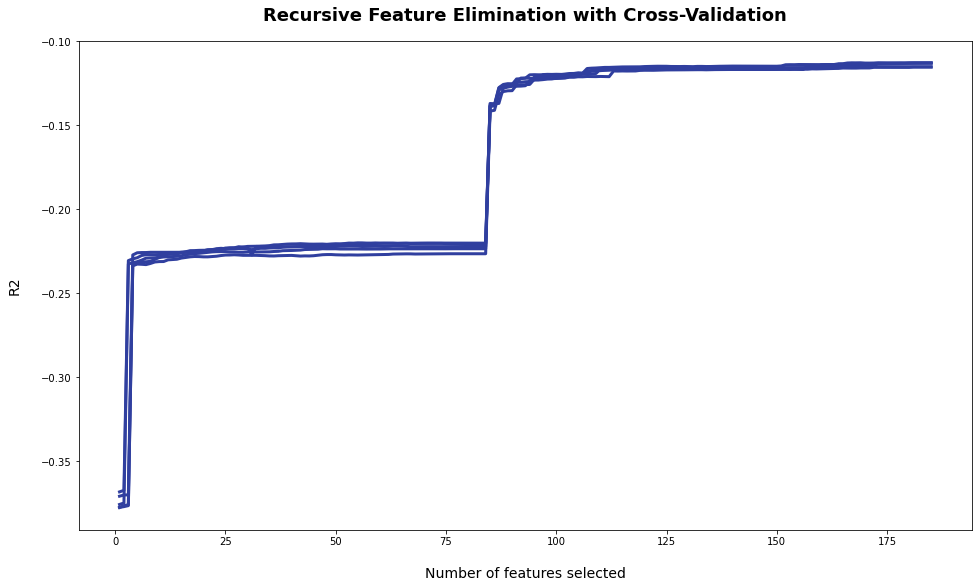

In [116]:
plt.figure(figsize=(16, 9))
plt.title('Recursive Feature Elimination with Cross-Validation', fontsize=18, fontweight='bold', pad=20)
plt.xlabel('Number of features selected', fontsize=14, labelpad=20)
plt.ylabel('R2', fontsize=14, labelpad=20)
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_, color='#303F9F', linewidth=3)

plt.show()

In [117]:
models = score_model(rfecv, X_train, y_train, "LR RFECV", models)



 LR RFECV  scores
CV 5 R2 Train Score: 89.05
CV 5 MAE Train Score: -0.1139
CV 5 RMSE Train Score: -0.1542


**Principal Component Analysis**

PCA is a dimensionality reduction method. It seeks to reduce the size of the feature space into a more manageable feature set by mathematically combining like-features while retaining a specified amount of the variance explainability.

Explained variance with all components is  99.99999999999999
1 component explains  39.09613119496516
1st and 2nd components explains  49.575170230785425
1st to 3rd components explains  57.9576877371392
1st to 4th components explains  63.57021783303769


Text(0, 0.5, 'Explained Variance')

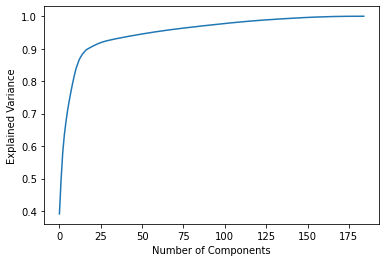

In [118]:
# Exploring the explained variance based on the various components

from sklearn.decomposition import PCA

pca_all = PCA(n_components=X_train.shape[1], random_state=randomstate)
x_pca = pca_all.fit_transform(X_train)

print("Explained variance with all components is ", sum(pca_all.explained_variance_ratio_ * 100))
print("1 component explains ", np.cumsum(pca_all.explained_variance_ratio_ * 100)[0])
print("1st and 2nd components explains ", np.cumsum(pca_all.explained_variance_ratio_ * 100)[1])
print("1st to 3rd components explains ", np.cumsum(pca_all.explained_variance_ratio_ * 100)[2])
print("1st to 4th components explains ", np.cumsum(pca_all.explained_variance_ratio_ * 100)[3])

plt.plot(np.cumsum(pca_all.explained_variance_ratio_))
plt.xlabel("Number of Components")
plt.ylabel("Explained Variance")

In [119]:
# Reducing the dataset into principal components that explain 95% of the variance

pca_95th = PCA(n_components=.95, random_state=randomstate)
x_pca_95 = pca_95th.fit_transform(X_train)

print(x_pca_95.shape[1],"components, starting from all features")

57 components, starting from all features


In [120]:
# Score PCA model

models = score_model(model, x_pca_95, y_train, "NuSVR PCA", models)



 NuSVR PCA  scores
CV 5 R2 Train Score: 84.67
CV 5 MAE Train Score: -0.1398
CV 5 RMSE Train Score: -0.1824


### Spot Check Evaluation

In [121]:
# make data frame from our models dictionary
target = pd.DataFrame(models).reset_index(drop=True)

# sort data frame by mae and reset index
target.sort_values('mae', ascending=False).head(20)

,model,r2,mae,rmse
14,Nu SVR,88.93,-0.1113,-0.1551
20,XGB Regressor,89.28,-0.1121,-0.1526
19,SVR,88.78,-0.1132,-0.1561
18,Ridge,89.06,-0.1139,-0.1542
26,LR RFECV,89.05,-0.1139,-0.1542
0,LR,89.06,-0.1139,-0.1542
11,Bayesian Ridge,89.05,-0.1140,-0.1542
3,Extra Trees,88.81,-0.1142,-0.1559
24,NuSVR Forward Backward,89.01,-0.1144,-0.1545
25,NuSVR Perm Importance,88.84,-0.1153,-0.1557


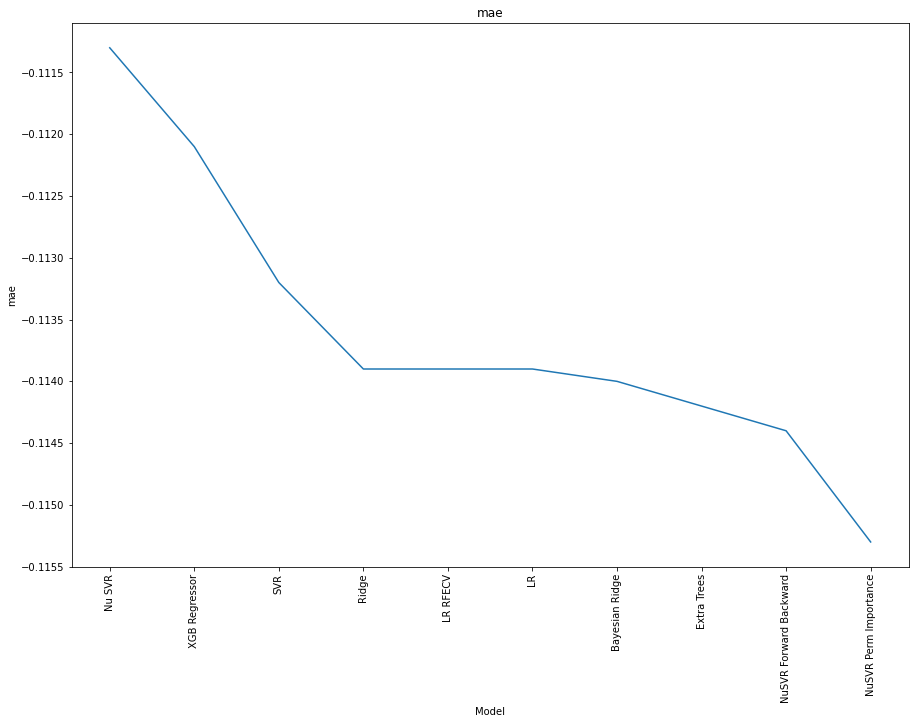

In [122]:
# plot model mae
graph = target.sort_values('mae', ascending=False).head(10)
plt.figure(figsize=(15,10))
plt.plot(graph['model'], graph['mae'])
plt.title("mae")
plt.xticks(rotation=90)
plt.xlabel('Model')
plt.ylabel("mae");

For our model stack we will explore:

* NuSVR
* XGB
* SVR
* Ridge
* Linear Regression
* Bayesian Ridge
* Random Forest
* Gradient Boosted
* Orthogonal Matching Pursuit
* MLP
* KNN

Extra trees performed okay but takes far too long.

## Final Model Setup

**All model tuning is located in the APPENDIX**

### Prepare Testing Assets

Our Permuted Features gave a clear reduction to our MAE in the spot checks, as well as reduced the dimensionality of our data, so we will use this reduced feature space for our final models.

In [123]:
# convert the train/test data frames into arrays
X_train = np.array(X_train)
X_test = np.array(X_test)

In [124]:
# initialize empty lists for the storage of out-of-fold predictions

xgbr_yhat, gradient_boost_yhat, random_forest_yhat, neighbor_yhat, svr_yhat, nu_svr_yhat = [], [], [], [], [], []
orth_yhat, linreg_yhat, ridge_yhat, bay_ridge_yhat, mlp_yhat = [], [], [], [], []

In [125]:
# instantiate tuned models

xgbr = xgb.XGBRegressor(
                n_estimators=500,
                seed=randomstate,
                missing=0,
                eval_metric='mae',
                verbosity=1,
                max_depth = 7,
                eta = .1,
                min_child_weight = 5,
                subsample=.6,
                colsample_bytree = .4,
                reg_alpha = 1e-5,
                reg_lambda = 50)

gradient_boost = GradientBoostingRegressor(
                n_estimators=1000,
                random_state=randomstate,
                learning_rate = .05,
                max_depth = 5,
                max_features = 'auto',
                loss = 'ls',
                subsample = .7)

random_forest = RandomForestRegressor(
                n_estimators=1000,
                random_state=randomstate,
                n_jobs=-1,
                max_depth = 20,
                )

neighbor = KNeighborsRegressor(n_neighbors = 11)
svr = SVR(gamma = 'scale', kernel = 'linear', C=10, epsilon=.05)
nu_svr = NuSVR(kernel = 'rbf', gamma = 'scale')
orth = OrthogonalMatchingPursuit()
linreg = LinearRegression()
ridge = Ridge(random_state = randomstate, tol=1e-3, normalize=False, solver='auto')
bay_ridge = BayesianRidge(alpha_init=50, normalize=False)
mlp = MLPRegressor(random_state = randomstate, solver='lbfgs', activation='logistic', alpha=1, hidden_layer_sizes=100)

In [126]:
# create the model dictionary to do out-of-fold predictions and model stack testing

models_dict = {'XGB' : [xgbr, xgbr_yhat],
            'Gradient Boosted' : [gradient_boost, gradient_boost_yhat],
            'Random Forest' : [random_forest, random_forest_yhat],
            'KNN' : [neighbor, neighbor_yhat],
            'SVR' : [svr, svr_yhat],
            'Nu SVR': [nu_svr, nu_svr_yhat],
            'Orthogonal': [orth, orth_yhat],
            'Linear Regression' : [linreg, linreg_yhat],
            'Ridge' : [ridge, ridge_yhat],
            'Bayesian Ridge': [bay_ridge, bay_ridge_yhat],
            'MLP Perceptron': [mlp, mlp_yhat]
              }

### Get OOF Predictions

Time to run our OOF predictions function. We're sending in our train set, our train targets, and the model dictionary that we just set up. We'll have returned to us a re-ordered train and target set, as well as a model dictionary with full yhat prediction lists.

In [127]:
# run the out-of-fold predictions
# This takes a long time!!

data_x, data_y, models_dict = train_oof_predictions(X_train, y_train, models_dict)


Starting a new fold

Creating splits
Adding x and y to lists

Running XGB on this fold
Running Gradient Boosted on this fold
Running Random Forest on this fold
Running KNN on this fold
Running SVR on this fold
Running Nu SVR on this fold
Running Orthogonal on this fold
Running Linear Regression on this fold
Running Ridge on this fold
Running Bayesian Ridge on this fold
Running MLP Perceptron on this fold

Starting a new fold

Creating splits
Adding x and y to lists

Running XGB on this fold
Running Gradient Boosted on this fold
Running Random Forest on this fold
Running KNN on this fold
Running SVR on this fold
Running Nu SVR on this fold
Running Orthogonal on this fold
Running Linear Regression on this fold
Running Ridge on this fold
Running Bayesian Ridge on this fold
Running MLP Perceptron on this fold

Starting a new fold

Creating splits
Adding x and y to lists

Running XGB on this fold
Running Gradient Boosted on this fold
Running Random Forest on this fold
Running KNN on this f

##### Save Yhat predictions

You can save your out-of-fold predictions for later if you need them.

In [128]:
pd.DataFrame(data_x).to_csv('saved_yhat/data_x.csv', index=False)
pd.DataFrame(data_y).to_csv('saved_yhat/data_y.csv', index=False)
pd.DataFrame(xgbr_yhat).to_csv('saved_yhat/xgbr_yhat.csv', index=False)
pd.DataFrame(gradient_boost_yhat).to_csv('saved_yhat/gradient_boost_yhat.csv', index=False)
pd.DataFrame(random_forest_yhat).to_csv('saved_yhat/random_forest_yhat.csv', index=False)
pd.DataFrame(neighbor_yhat).to_csv('saved_yhat/neighbor_yhat.csv', index=False)
pd.DataFrame(svr_yhat).to_csv('saved_yhat/svr_yhat.csv', index=False)
pd.DataFrame(nu_svr_yhat).to_csv('saved_yhat/nu_svr_yhat.csv', index=False)
pd.DataFrame(orth_yhat).to_csv('saved_yhat/orth_yhat.csv', index=False)
pd.DataFrame(linreg_yhat).to_csv('saved_yhat/linreg_yhat.csv', index=False)
pd.DataFrame(ridge_yhat).to_csv('saved_yhat/ridge_yhat.csv', index=False)
pd.DataFrame(bay_ridge_yhat).to_csv('saved_yhat/bay_ridge_yhat.csv', index=False)
pd.DataFrame(mlp_yhat).to_csv('saved_yhat/mlp_yhat.csv', index=False)

In [129]:
data_x

[array([-0.86941277, -0.84927652, -2.75869235,  0.60850673, -0.27446478,
        -1.69722194, -0.61779719, -0.6428156 ,  0.57375802,  0.46574811,
         0.24034427,  1.59999244,  0.75358396,  0.32919827,  0.05776537,
        -0.65717049,  0.75587857,  0.        ,  1.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0. 

In [130]:
data_y

[12.953352834670046,
 13.222208712374044,
 13.602317337503232,
 12.652359748158593,
 13.001325049027272,
 12.206022644280132,
 13.337550560599723,
 13.262125319779487,
 13.62918097977278,
 13.038981768465277,
 12.948605051270862,
 13.122163357401663,
 12.2783933071098,
 13.226723392728571,
 13.038981768465277,
 13.017002861746503,
 12.84792653170257,
 12.601487417784837,
 11.967180737247824,
 13.038981768465277,
 12.850554654108839,
 12.727838209334498,
 13.085699393032737,
 13.195613839143922,
 12.323633434269318,
 13.38472764187182,
 12.425208175446844,
 13.296316684527767,
 12.736700896592344,
 12.273731294003989,
 12.604848765487542,
 12.524526376648708,
 13.417269294945429,
 13.115942809601407,
 13.493926933836812,
 13.579788224443204,
 13.7056845311805,
 13.396200043034057,
 13.567690018937624,
 13.262125319779487,
 13.170010030871682,
 13.017002861746503,
 12.429216196844383,
 13.726132746813057,
 11.862172893080164,
 13.082957047025236,
 12.818551923022664,
 13.242809530480196,

In [131]:
xgbr_yhat

[13.094948,
 13.19295,
 13.661111,
 12.645971,
 12.878254,
 12.0646105,
 13.298047,
 13.301422,
 13.729542,
 12.991217,
 13.102999,
 13.041668,
 12.541475,
 13.029923,
 12.931619,
 13.05439,
 12.967372,
 12.774611,
 12.071093,
 13.011895,
 12.789229,
 12.952829,
 13.033001,
 13.10467,
 12.520815,
 13.1963,
 12.479677,
 13.2185545,
 12.66998,
 12.404033,
 12.649824,
 12.507829,
 13.315623,
 13.027247,
 13.41654,
 13.53352,
 13.727389,
 13.419263,
 13.51816,
 13.267965,
 13.267024,
 13.080839,
 12.715142,
 13.767336,
 12.057933,
 13.065137,
 12.718111,
 13.209473,
 13.308654,
 12.614563,
 12.615495,
 12.954193,
 12.457035,
 13.299806,
 12.760037,
 12.506326,
 12.526958,
 13.280927,
 13.120031,
 12.775947,
 13.232922,
 13.532499,
 13.511452,
 13.006711,
 12.806951,
 12.895693,
 12.410838,
 12.313363,
 12.272283,
 12.620773,
 12.243953,
 13.442589,
 13.111853,
 12.904201,
 12.744448,
 13.587168,
 12.466341,
 13.420325,
 12.733388,
 13.344525,
 12.760447,
 11.891951,
 13.002521,
 12.678385,

In [132]:
gradient_boost_yhat

[13.11014709541348,
 13.08982287832034,
 13.583278864738517,
 12.605442418898166,
 12.91013644790871,
 12.126440825880179,
 13.283716346266813,
 13.283349521143554,
 13.704763639829263,
 13.04708453811511,
 13.055364847926546,
 13.02641294952292,
 12.558110128095581,
 13.06044584635837,
 12.932527715725662,
 13.031629421745375,
 12.984649195377072,
 12.760426223948585,
 11.998490288882595,
 13.017195332190983,
 12.768181671950934,
 12.906504431251799,
 13.046883293843925,
 13.06353318916594,
 12.519991481503466,
 13.226838485040343,
 12.507871179948934,
 13.240163704492744,
 12.673222997083922,
 12.444784793877364,
 12.636804430293713,
 12.58891198346457,
 13.262469023602764,
 13.06594197846268,
 13.426295268301503,
 13.581944191970846,
 13.737416293643275,
 13.419075891513163,
 13.515188573607915,
 13.284300760678887,
 13.259517712606605,
 13.111154070716315,
 12.703740823375052,
 13.723257936241787,
 12.087397171457459,
 13.099218223058434,
 12.735048052078376,
 13.268062048560653,
 

##### Load Yhat predictions

In [106]:
'''data_x= np.array(pd.read_csv('saved_yhat/data_x.csv'))
data_y= np.array(pd.read_csv('saved_yhat/data_y.csv'))
xgbr_yhat= np.array(pd.read_csv('saved_yhat/xgbr_yhat.csv'))
gradient_boost_yhat= np.array(pd.read_csv('saved_yhat/gradient_boost_yhat.csv'))
random_forest_yhat= np.array(pd.read_csv('saved_yhat/random_forest_yhat.csv'))
neighbor_yhat= np.array(pd.read_csv('saved_yhat/neighbor_yhat.csv'))
svr_yhat= np.array(pd.read_csv('saved_yhat/svr_yhat.csv'))
nu_svr_yhat= np.array(pd.read_csv('saved_yhat/nu_svr_yhat.csv'))
orth_yhat= np.array(pd.read_csv('saved_yhat/orth_yhat.csv'))
linreg_yhat= np.array(pd.read_csv('saved_yhat/linreg_yhat.csv'))
ridge_yhat= np.array(pd.read_csv('saved_yhat/ridge_yhat.csv'))
bay_ridge_yhat= np.array(pd.read_csv('saved_yhat/bay_ridge_yhat.csv'))
mlp_yhat= np.array(pd.read_csv('saved_yhat/mlp_yhat.csv'))'''

In [107]:
'''models_dict['Random Forest'][1] = random_forest_yhat
models_dict['XGB'][1] = xgbr_yhat
models_dict['Gradient Boosted'][1] = gradient_boost_yhat
models_dict['SVR'][1] = svr_yhat
models_dict['Nu SVR'][1] = nu_svr_yhat
models_dict['Bayesian Ridge'][1] = bay_ridge_yhat
models_dict['KNN'][1] = neighbor_yhat
models_dict['Orthogonal'][1] = orth_yhat
models_dict['Linear Regression'][1] = linreg_yhat
models_dict['Ridge'][1] = ridge_yhat
models_dict['MLP Perceptron'][1] = mlp_yhat'''

### Run Stack Selector

Now we'll run our model stack selector!

In [133]:
# Set up a scoring dictionary to hold the model stack selector results
scores = {}
scores['Model'] = []
scores['MAE'] = []
scores['Included'] = []

# Run the model stack selector for each model in our models_dict

for model in models_dict:
    
    label = model
    meta_model = models_dict[model][0]

    resulting_models, best_mae = model_selector(data_x, data_y, meta_model, models_dict, label, verbose=True)
    
    scores['Model'].append(model)
    scores['MAE'].append(best_mae)
    scores['Included'].append(resulting_models)



Running model selector for  XGB

NEW ROUND - Setting up score charts
Included models: []
Exluded models: ['Ridge', 'Nu SVR', 'XGB', 'Linear Regression', 'MLP Perceptron', 'Bayesian Ridge', 'Orthogonal', 'KNN', 'Random Forest', 'SVR', 'Gradient Boosted']
Starting mae: -0.108

Ridge score: -0.1086
Nu SVR score: -0.1108
XGB score: -0.1114
Linear Regression score: -0.1086
MLP Perceptron score: -0.1087
Bayesian Ridge score: -0.1085
Orthogonal score: -0.1082
KNN score: -0.1101
Random Forest score: -0.1107
SVR score: -0.1085
Gradient Boosted score: -0.1104
Best mae: -0.1082

XGB model optimized
resulting models: []
MAE: -0.108


Running model selector for  Gradient Boosted

NEW ROUND - Setting up score charts
Included models: []
Exluded models: ['Ridge', 'Nu SVR', 'XGB', 'Linear Regression', 'MLP Perceptron', 'Bayesian Ridge', 'Orthogonal', 'KNN', 'Random Forest', 'SVR', 'Gradient Boosted']
Starting mae: -0.1067

Ridge score: -0.1066
Nu SVR score: -0.1118
XGB score: -0.1121
Linear Regressio

KNN score: -0.1432
Random Forest score: -0.1411
SVR score: -0.1408
Best mae: -0.1408

Add  Linear Regression with mae -0.1408


NEW ROUND - Setting up score charts
Included models: ['Gradient Boosted', 'Ridge', 'Linear Regression']
Exluded models: ['MLP Perceptron', 'Nu SVR', 'XGB', 'Bayesian Ridge', 'Orthogonal', 'KNN', 'Random Forest', 'SVR']
Starting mae: -0.1408

MLP Perceptron score: -0.1391
Nu SVR score: -0.1392
XGB score: -0.139
Bayesian Ridge score: -0.1392
Orthogonal score: -0.1399
KNN score: -0.141
Random Forest score: -0.1391
SVR score: -0.1391
Best mae: -0.139

Add  XGB with mae -0.139


NEW ROUND - Setting up score charts
Included models: ['Gradient Boosted', 'Ridge', 'Linear Regression', 'XGB']
Exluded models: ['Nu SVR', 'MLP Perceptron', 'Bayesian Ridge', 'Orthogonal', 'KNN', 'Random Forest', 'SVR']
Starting mae: -0.139

Nu SVR score: -0.1374
MLP Perceptron score: -0.1373
Bayesian Ridge score: -0.1374
Orthogonal score: -0.1381
KNN score: -0.1391
Random Forest score: -0.1

Starting mae: -0.1069

Ridge score: -0.1069
Nu SVR score: -0.1067
MLP Perceptron score: -0.107
Linear Regression score: -0.1069
Bayesian Ridge score: -0.1069
Orthogonal score: -0.1069
KNN score: -0.1069
Random Forest score: -0.1064
SVR score: -0.1069
Best mae: -0.1064

Add  Random Forest with mae -0.1064


NEW ROUND - Setting up score charts
Included models: ['Gradient Boosted', 'XGB', 'Random Forest']
Exluded models: ['Ridge', 'Nu SVR', 'MLP Perceptron', 'Linear Regression', 'Bayesian Ridge', 'Orthogonal', 'KNN', 'SVR']
Starting mae: -0.1064

Ridge score: -0.1065
Nu SVR score: -0.1061
MLP Perceptron score: -0.1065
Linear Regression score: -0.1064
Bayesian Ridge score: -0.1065
Orthogonal score: -0.1065
KNN score: -0.1065
SVR score: -0.1064
Best mae: -0.1061

Add  Nu SVR with mae -0.1061


NEW ROUND - Setting up score charts
Included models: ['Gradient Boosted', 'XGB', 'Random Forest', 'Nu SVR']
Exluded models: ['Ridge', 'Linear Regression', 'MLP Perceptron', 'Bayesian Ridge', 'Orthogon

MLP Perceptron score: -0.1051
Nu SVR score: -0.1044
XGB score: -0.1045
Bayesian Ridge score: -0.1048
Orthogonal score: -0.1051
KNN score: -0.105
Random Forest score: -0.1047
SVR score: -0.1051
Best mae: -0.1044

Add  Nu SVR with mae -0.1044


NEW ROUND - Setting up score charts
Included models: ['Gradient Boosted', 'Ridge', 'Nu SVR']
Exluded models: ['MLP Perceptron', 'Linear Regression', 'XGB', 'Bayesian Ridge', 'Orthogonal', 'KNN', 'Random Forest', 'SVR']
Starting mae: -0.1044

MLP Perceptron score: -0.1044
Linear Regression score: -0.1042
XGB score: -0.1041
Bayesian Ridge score: -0.1041
Orthogonal score: -0.1044
KNN score: -0.1044
Random Forest score: -0.1042
SVR score: -0.1043
Best mae: -0.1041

Add  XGB with mae -0.1041


NEW ROUND - Setting up score charts
Included models: ['Gradient Boosted', 'Ridge', 'Nu SVR', 'XGB']
Exluded models: ['Linear Regression', 'MLP Perceptron', 'Bayesian Ridge', 'Orthogonal', 'KNN', 'Random Forest', 'SVR']
Starting mae: -0.1041

Linear Regression sco

In [134]:
# Look at the scores of our model combinations

best_model = pd.DataFrame(scores).reset_index(drop=True)
best_model.sort_values('MAE', ascending=False)

,Model,MAE,Included
4,SVR,-0.0993,"[Gradient Boosted, Bayesian Ridge, Nu SVR, SVR..."
9,Bayesian Ridge,-0.0997,"[Gradient Boosted, Bayesian Ridge, Nu SVR, XGB..."
7,Linear Regression,-0.1001,"[Gradient Boosted, Bayesian Ridge, Nu SVR, XGB..."
8,Ridge,-0.1036,"[Gradient Boosted, Ridge, Nu SVR, XGB, Bayesia..."
6,Orthogonal,-0.1053,"[Gradient Boosted, Nu SVR, SVR]"
2,Random Forest,-0.1060,"[Gradient Boosted, Ridge, Nu SVR, MLP Perceptr..."
5,Nu SVR,-0.1061,"[Gradient Boosted, XGB, Random Forest, Nu SVR]"
1,Gradient Boosted,-0.1064,[Linear Regression]
0,XGB,-0.1080,[]
10,MLP Perceptron,-0.1080,"[Gradient Boosted, Orthogonal]"


In [135]:
scores['Included'][4]

['Gradient Boosted', 'Bayesian Ridge', 'Nu SVR', 'SVR', 'XGB', 'Random Forest']

['XGB', 'Bayesian Ridge', 'Gradient Boosted', 'Nu SVR', 'SVR', 'Random Forest]

### Prepare Final Assets

In [136]:
# make a list with the oof predictions from the stack models that we plan to use in our stack
yhat_predics = [models_dict['XGB'][1],  models_dict['Bayesian Ridge'][1], models_dict['Gradient Boosted'][1], models_dict['SVR'][1],  models_dict['Nu SVR'][1], models_dict['Random Forest'][1]]


# create the meta data set using the oof predictions
meta_X_train = create_meta_dataset(data_x, yhat_predics)

In [137]:
# Fit the models to be used in the stack on the base Train datasets
print("Fitting Models")

print("Fitting XGB")
xgbr.fit(X_train, y_train)

print("Fitting Bay Ridge")
bay_ridge.fit(X_train, y_train)

print("Fitting Gradient Boost")
gradient_boost.fit(X_train, y_train)

print("Fitting SVR")
svr.fit(X_train, y_train)

print("Fitting Nu SVR")
nu_svr.fit(X_train, y_train)

print("Fitting Random Forest")
random_forest.fit(X_train, y_train)

Fitting Models
Fitting XGB
Fitting Bay Ridge
Fitting Gradient Boost
Fitting SVR
Fitting Nu SVR
Fitting Random Forest


RandomForestRegressor(max_depth=20, n_estimators=1000, n_jobs=-1,
                      random_state=30785)

In [138]:
# Make a list holding the fitted models to be used in the stack
final_models = [xgbr, bay_ridge, gradient_boost, svr, nu_svr, random_forest]

# Create the test set, including the predictions of the stack models
meta_X_test = stack_prediction(X_test, final_models)

meta_X_test.shape

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.4, eta=0.1,
             eval_metric='mae', gamma=0, gpu_id=-1, importance_type='gain',
             interaction_constraints='', learning_rate=0.100000001,
             max_delta_step=0, max_depth=7, min_child_weight=5, missing=0,
             monotone_constraints='()', n_estimators=500, n_jobs=16,
             num_parallel_tree=1, random_state=30785, reg_alpha=1e-05,
             reg_lambda=50, scale_pos_weight=1, seed=30785, subsample=0.6,
             tree_method='exact', validate_parameters=1, verbosity=1)
BayesianRidge(alpha_init=50, normalize=False)
GradientBoostingRegressor(learning_rate=0.05, loss='ls', max_depth=5,
                          max_features='auto', n_estimators=1000,
                          random_state=30785, subsample=0.7)
SVR(C=10, epsilon=0.05, kernel='linear')
NuSVR()
RandomForestRegressor(max_depth=20, n_estimators=1000, n_jobs=-1,
      

(2638, 191)

## Final Model Evaluation

In [113]:
# Check our meta model score

nu_svr = NuSVR(kernel = 'rbf', gamma = 'scale')

nu_svr.fit(X_train, y_train)
predictions = nu_svr.predict(X_test)

pred_exp = np.exp(predictions)
actual = np.exp(y_test)

print("MAE: ",int(mean_absolute_error(pred_exp, actual)))
print("RMSE:",int(np.sqrt(mean_squared_error(pred_exp, actual))))
print("R2:", r2_score(pred_exp, actual)*100)

MAE:  51070
RMSE: 82025
R2: 87.2958655038158


In [139]:
# Instantiate the chosen meta model
meta_model =  SVR(gamma = 'scale', kernel = 'linear', C=10, epsilon=.05)

# fit the meta model to the Train meta dataset
# There is no data leakage in the meta dataset since we did all of our predictions out-of-sample
meta_model.fit(meta_X_train, data_y)
predictions = meta_model.predict(meta_X_test)

pred_exp = np.exp(predictions)
actual = np.exp(y_test)

print("MAE: ",int(mean_absolute_error(pred_exp, actual)))
print("RMSE:",int(np.sqrt(mean_squared_error(pred_exp, actual))))
print("R2:", r2_score(pred_exp, actual)*100)

MAE:  47721
RMSE: 74884
R2: 89.75829810498924


# Analysis

> Our final model utilizes a combination of continuous variables and one-hot-encoded categoricals to produce a stacked model with R^2 of 89.78%, a mean absolute error of 47.2k, and a root mean squared error of 74k. I tried several different zip code transformations including polynomial features, mean target encoding, lower-granularity binning, and median rank as a continuous, and ALL of these efforts resulted in a lower R^2 and higher mean absolute error, leading to a final decision to one-hot encode all 70 zip codes individually. Similar efforts on other categoricals such as age and month sold also did not improve the model over one-hot encoding. This resulted in the greatest accuracy despite a model that is more "messy" with a large number of features.

### What are the primary factors influencing housing prices in the King County metro area?
> As square footage increases so does quality of materials. Most importantly you can see the upward price trend with both increased square footage and materials grade. I was intrigued that our lower bound of data points is very linear, but as our square footage increases, the upper bound gradually breaks away with higher variance. 

>I ranked the 70 zip codes in King County by median home value, and used those ranks to color our data points.  Our low median zip codes have a low price per square footage, and price per square foot increases with zip code median, which makes sense, but also shows the importance of zip code to pricing. I found it interesting that while most zip codes exhibit a clear trend of price per square foot decreasing with increased total square footage, which is entirely normal, certain very high value zip codes seem to retain their high price per square foot regardless of total square footage. Certain zip codes seem immune to the usual price per square foot decay. 

> As they say, location is everything, and it is the primary influencing factor for a home price in the King County metro area. Our darkest areas, and therefore highest value sales, are clustered in and around Seattle to the west of Lake Washington and into the eastern lake cities of Bellevue and Redmond which are the technical employer hubs of the region. As we move away from Seattle and the tech hubs into the suburbs, our prices clearly go down.

> These three features alone explain 85% of the price variance.

### Can we effectively use a regression model based system for realtors to determine a proper list price?
> Our model, while explaining over 89.78% of the price variance with our features, was nonetheless far from accurate in absolute terms. A mean average error of 47.2k in either direction is a huge variance to a home price - one that is so large that it renders the prediction much less meaningful and useful. Other models need to be explored, better data needs to be sourced, or easy-to-use features that an average realtor is capable of evaluating/acquiring should be added to the model to improve its predictive quality. The model is providing at best a baseline starting point.


# APPENDIX - PARAMETER TUNING

### XGBoost

Gradient Boosting performs best with optimal parameter tuning. We're going to use sklearn's GridSearchCV to find the optimal hyperparameters to use with our gradient booster! Here are the parameters we are trying out:

* n_estimators: Number of boosts to perform. Gradient boosting is pretty robust to over-fitting so more is usually better
* max_depth: This determines how many tree nodes the estimator looks at before making a prediction. We don't know what is best here, so we are trying things from 2-4 to see what works the best
* min_child_weight: Min sum of instance weight needed in a child
* gamma: Minimum loss reduction to make another partition on a leaf node. Higher results in more conservative algorithm.
* subsample: Ratio of training sets. .5 means that it will sample half the training data before making trees. Occurs with each boosting iteration.
* colsample_by_tree: ratio of columns when making a tree
* alpha: L1 regularization. Higher will make model more conservative.
* learning_rate: Tuning this setting alters how much the model corrects after it runs a boost. .1 is a common rate and we will test a lower and higher rate as well.

In [120]:
param_grid = {"max_depth": [5, 10],
              "min_child_weight" : [2, 7],
              'eta': [.05, .1],
              }

xgbr = xgb.XGBRegressor(
                n_estimators=500,
                seed=randomstate,
                missing=0,
                eval_metric='mae',
                verbosity=1)

best_params = grid_optimizer(xgbr, param_grid, X_train, y_train)

Making Search
Running Grid
n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 4982
max_resources_: 14946
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 8
n_resources: 4982
Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV 1/5; 1/8] START eta=0.05, max_depth=5, min_child_weight=2...................
[CV 1/5; 1/8] END eta=0.05, max_depth=5, min_child_weight=2;, score=(train=-0.080, test=-0.113) total time=   0.5s
[CV 2/5; 1/8] START eta=0.05, max_depth=5, min_child_weight=2...................
[CV 2/5; 1/8] END eta=0.05, max_depth=5, min_child_weight=2;, score=(train=-0.078, test=-0.114) total time=   0.5s
[CV 3/5; 1/8] START eta=0.05, max_depth=5, min_child_weight=2...................
[CV 3/5; 1/8] END eta=0.05, max_depth=5, min_child_weight=2;, score=(train=-0.077, test=-0.107) total time=   0.5s
[CV 4/5; 1/8] START eta=0.05, max_depth=5, min_child_weight=2...................
[CV 4/5; 1/8] END eta=0.05, max_depth=5, m

[CV 1/5; 1/3] END eta=0.1, max_depth=5, min_child_weight=2;, score=(train=-0.077, test=-0.107) total time=   1.2s
[CV 2/5; 1/3] START eta=0.1, max_depth=5, min_child_weight=2....................
[CV 2/5; 1/3] END eta=0.1, max_depth=5, min_child_weight=2;, score=(train=-0.077, test=-0.106) total time=   1.2s
[CV 3/5; 1/3] START eta=0.1, max_depth=5, min_child_weight=2....................
[CV 3/5; 1/3] END eta=0.1, max_depth=5, min_child_weight=2;, score=(train=-0.076, test=-0.108) total time=   1.2s
[CV 4/5; 1/3] START eta=0.1, max_depth=5, min_child_weight=2....................
[CV 4/5; 1/3] END eta=0.1, max_depth=5, min_child_weight=2;, score=(train=-0.076, test=-0.109) total time=   1.2s
[CV 5/5; 1/3] START eta=0.1, max_depth=5, min_child_weight=2....................
[CV 5/5; 1/3] END eta=0.1, max_depth=5, min_child_weight=2;, score=(train=-0.077, test=-0.108) total time=   1.2s
[CV 1/5; 2/3] START eta=0.05, max_depth=5, min_child_weight=2...................
[CV 1/5; 2/3] END eta=0.0

Best mae: -0.108
Best parameters set found on train set: 

{'eta': 0.1, 'max_depth': 5, 'min_child_weight': 2}

In [121]:
param_grid = {"max_depth": [3, 7],
              "min_child_weight" : [2, 5],
              'eta': [.1, .3],
              }

xgbr = xgb.XGBRegressor(
                n_estimators=500,
                seed=randomstate,
                missing=0,
                eval_metric='mae',
                verbosity=1)

best_params = grid_optimizer(xgbr, param_grid, X_train, y_train)

Making Search
Running Grid
n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 4982
max_resources_: 14946
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 8
n_resources: 4982
Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV 1/5; 1/8] START eta=0.1, max_depth=3, min_child_weight=2....................
[CV 1/5; 1/8] END eta=0.1, max_depth=3, min_child_weight=2;, score=(train=-0.088, test=-0.113) total time=   0.3s
[CV 2/5; 1/8] START eta=0.1, max_depth=3, min_child_weight=2....................
[CV 2/5; 1/8] END eta=0.1, max_depth=3, min_child_weight=2;, score=(train=-0.089, test=-0.113) total time=   0.3s
[CV 3/5; 1/8] START eta=0.1, max_depth=3, min_child_weight=2....................
[CV 3/5; 1/8] END eta=0.1, max_depth=3, min_child_weight=2;, score=(train=-0.089, test=-0.112) total time=   0.3s
[CV 4/5; 1/8] START eta=0.1, max_depth=3, min_child_weight=2....................
[CV 4/5; 1/8] END eta=0.1, max_depth=3, min_c

[CV 1/5; 1/3] END eta=0.1, max_depth=7, min_child_weight=5;, score=(train=-0.054, test=-0.107) total time=   1.7s
[CV 2/5; 1/3] START eta=0.1, max_depth=7, min_child_weight=5....................
[CV 2/5; 1/3] END eta=0.1, max_depth=7, min_child_weight=5;, score=(train=-0.056, test=-0.107) total time=   1.7s
[CV 3/5; 1/3] START eta=0.1, max_depth=7, min_child_weight=5....................
[CV 3/5; 1/3] END eta=0.1, max_depth=7, min_child_weight=5;, score=(train=-0.055, test=-0.109) total time=   1.7s
[CV 4/5; 1/3] START eta=0.1, max_depth=7, min_child_weight=5....................
[CV 4/5; 1/3] END eta=0.1, max_depth=7, min_child_weight=5;, score=(train=-0.055, test=-0.110) total time=   1.7s
[CV 5/5; 1/3] START eta=0.1, max_depth=7, min_child_weight=5....................
[CV 5/5; 1/3] END eta=0.1, max_depth=7, min_child_weight=5;, score=(train=-0.054, test=-0.107) total time=   1.7s
[CV 1/5; 2/3] START eta=0.1, max_depth=3, min_child_weight=2....................
[CV 1/5; 2/3] END eta=0.1

Best mae: -0.108
Best parameters set found on train set: 

{'eta': 0.1, 'max_depth': 7, 'min_child_weight': 5}

In [122]:
param_grid = {'gamma': [0, .6],
              'subsample':[.6, 1],

              }

xgbr = xgb.XGBRegressor(
                n_estimators=500,
                seed=randomstate,
                missing=0,
                eval_metric='mae',
                verbosity=1,
                max_depth = 7,
                eta = .1,
                min_child_weight = 5)

best_params = grid_optimizer(xgbr, param_grid, X_train, y_train)

Making Search
Running Grid
n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 4982
max_resources_: 14946
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 4
n_resources: 4982
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START gamma=0, subsample=0.6......................................
[CV 1/5; 1/4] END gamma=0, subsample=0.6;, score=(train=-0.029, test=-0.118) total time=   0.8s
[CV 2/5; 1/4] START gamma=0, subsample=0.6......................................
[CV 2/5; 1/4] END gamma=0, subsample=0.6;, score=(train=-0.030, test=-0.120) total time=   0.8s
[CV 3/5; 1/4] START gamma=0, subsample=0.6......................................
[CV 3/5; 1/4] END gamma=0, subsample=0.6;, score=(train=-0.030, test=-0.116) total time=   0.8s
[CV 4/5; 1/4] START gamma=0, subsample=0.6......................................
[CV 4/5; 1/4] END gamma=0, subsample=0.6;, score=(train=-0.031, test=-0.124) total time=   0.8s
[CV

Best mae: -0.108
Best parameters set found on train set: 

{'gamma': 0, 'subsample': 0.6}

In [124]:
param_grid = {'colsample_bytree':[.6, 1],
              'subsample':[.3, .6],
              }

xgbr = xgb.XGBRegressor(
                n_estimators=500,
                seed=randomstate,
                missing=0,
                eval_metric='mae',
                verbosity=1,
                max_depth = 7,
                eta = .1,
                min_child_weight = 5,

                )

best_params = grid_optimizer(xgbr, param_grid, X_train, y_train)

Making Search
Running Grid
n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 4982
max_resources_: 14946
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 4
n_resources: 4982
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START colsample_bytree=0.6, subsample=0.3.........................
[CV 1/5; 1/4] END colsample_bytree=0.6, subsample=0.3;, score=(train=-0.051, test=-0.124) total time=   0.6s
[CV 2/5; 1/4] START colsample_bytree=0.6, subsample=0.3.........................
[CV 2/5; 1/4] END colsample_bytree=0.6, subsample=0.3;, score=(train=-0.050, test=-0.124) total time=   0.6s
[CV 3/5; 1/4] START colsample_bytree=0.6, subsample=0.3.........................
[CV 3/5; 1/4] END colsample_bytree=0.6, subsample=0.3;, score=(train=-0.050, test=-0.121) total time=   0.6s
[CV 4/5; 1/4] START colsample_bytree=0.6, subsample=0.3.........................
[CV 4/5; 1/4] END colsample_bytree=0.6, subsample=0.3;, scor

Best mae: -0.107
Best parameters set found on train set: 

{'colsample_bytree': 0.6, 'subsample': 0.6}

In [126]:
param_grid = {'colsample_bytree':[.2, .4, .6],
              }

xgbr = xgb.XGBRegressor(
                n_estimators=500,
                seed=randomstate,
                missing=0,
                eval_metric='mae',
                verbosity=1,
                max_depth = 7,
                eta = .1,
                min_child_weight = 5,
                subsample = .6,
                )

best_params = grid_optimizer(xgbr, param_grid, X_train, y_train)

Making Search
Running Grid
n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 4982
max_resources_: 14946
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3
n_resources: 4982
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5; 1/3] START colsample_bytree=0.2........................................
[CV 1/5; 1/3] END colsample_bytree=0.2;, score=(train=-0.051, test=-0.114) total time=   0.6s
[CV 2/5; 1/3] START colsample_bytree=0.2........................................
[CV 2/5; 1/3] END colsample_bytree=0.2;, score=(train=-0.052, test=-0.114) total time=   0.6s
[CV 3/5; 1/3] START colsample_bytree=0.2........................................
[CV 3/5; 1/3] END colsample_bytree=0.2;, score=(train=-0.049, test=-0.115) total time=   0.6s
[CV 4/5; 1/3] START colsample_bytree=0.2........................................
[CV 4/5; 1/3] END colsample_bytree=0.2;, score=(train=-0.052, test=-0.118) total time=   0.6s
[CV 5/5; 1/

Best mae: -0.107
Best parameters set found on train set: 

{'colsample_bytree': 0.4}

In [128]:
param_grid = {'reg_alpha':[1e-5, 1, 100],
              'reg_lambda':[1e-5, 1, 100],

              }

xgbr = xgb.XGBRegressor(
                n_estimators=500,
                seed=randomstate,
                missing=0,
                eval_metric='mae',
                verbosity=1,
                max_depth = 7,
                eta = .1,
                min_child_weight = 5,
                subsample = .6,
                colsample_bytree = .4,
)

best_params = grid_optimizer(xgbr, param_grid, X_train, y_train)

Making Search
Running Grid
n_iterations: 3
n_required_iterations: 3
n_possible_iterations: 3
min_resources_: 1660
max_resources_: 14946
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 9
n_resources: 1660
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5; 1/9] START reg_alpha=1e-05, reg_lambda=1e-05...........................
[CV 1/5; 1/9] END reg_alpha=1e-05, reg_lambda=1e-05;, score=(train=-0.016, test=-0.134) total time=   0.4s
[CV 2/5; 1/9] START reg_alpha=1e-05, reg_lambda=1e-05...........................
[CV 2/5; 1/9] END reg_alpha=1e-05, reg_lambda=1e-05;, score=(train=-0.015, test=-0.136) total time=   0.4s
[CV 3/5; 1/9] START reg_alpha=1e-05, reg_lambda=1e-05...........................
[CV 3/5; 1/9] END reg_alpha=1e-05, reg_lambda=1e-05;, score=(train=-0.015, test=-0.137) total time=   0.4s
[CV 4/5; 1/9] START reg_alpha=1e-05, reg_lambda=1e-05...........................
[CV 4/5; 1/9] END reg_alpha=1e-05, reg_lambda=1e-05;, score=(train

[CV 4/5; 9/9] END reg_alpha=100, reg_lambda=100;, score=(train=-0.227, test=-0.263) total time=   0.1s
[CV 5/5; 9/9] START reg_alpha=100, reg_lambda=100...............................
[CV 5/5; 9/9] END reg_alpha=100, reg_lambda=100;, score=(train=-0.234, test=-0.220) total time=   0.1s
----------
iter: 1
n_candidates: 3
n_resources: 4980
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5; 1/3] START reg_alpha=1, reg_lambda=100.................................
[CV 1/5; 1/3] END reg_alpha=1, reg_lambda=100;, score=(train=-0.083, test=-0.120) total time=   0.7s
[CV 2/5; 1/3] START reg_alpha=1, reg_lambda=100.................................
[CV 2/5; 1/3] END reg_alpha=1, reg_lambda=100;, score=(train=-0.084, test=-0.118) total time=   0.7s
[CV 3/5; 1/3] START reg_alpha=1, reg_lambda=100.................................
[CV 3/5; 1/3] END reg_alpha=1, reg_lambda=100;, score=(train=-0.084, test=-0.114) total time=   0.7s
[CV 4/5; 1/3] START reg_alpha=1, reg_lambda=100.......

Best mae: -0.108
Best parameters set found on train set: 

{'reg_alpha': 1e-05, 'reg_lambda': 100}

NOT an improvement over no alpha/lambda

In [130]:
param_grid = {'reg_lambda':[25, 50, 100],

              }

xgbr = xgb.XGBRegressor(
                n_estimators=500,
                seed=randomstate,
                missing=0,
                eval_metric='mae',
                verbosity=1,
                max_depth = 7,
                eta = .1,
                min_child_weight = 5,
                subsample=.6,
                colsample_bytree = .4,
                reg_alpha = 1e-5,
)

best_params = grid_optimizer(xgbr, param_grid, X_train, y_train)

Making Search
Running Grid
n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 4982
max_resources_: 14946
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3
n_resources: 4982
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5; 1/3] START reg_lambda=25...............................................
[CV 1/5; 1/3] END reg_lambda=25;, score=(train=-0.056, test=-0.112) total time=   0.7s
[CV 2/5; 1/3] START reg_lambda=25...............................................
[CV 2/5; 1/3] END reg_lambda=25;, score=(train=-0.058, test=-0.116) total time=   0.7s
[CV 3/5; 1/3] START reg_lambda=25...............................................
[CV 3/5; 1/3] END reg_lambda=25;, score=(train=-0.056, test=-0.113) total time=   0.7s
[CV 4/5; 1/3] START reg_lambda=25...............................................
[CV 4/5; 1/3] END reg_lambda=25;, score=(train=-0.056, test=-0.118) total time=   0.7s
[CV 5/5; 1/3] START reg_lambda=25......

Best mae: -0.107
Best parameters set found on train set: 

{'reg_lambda': 50}

In [132]:
param_grid = {'n_estimators' : [500, 750, 1000],
              }

xgbr = xgb.XGBRegressor(
                #n_estimators=500,
                seed=randomstate,
                missing=0,
                eval_metric='mae',
                verbosity=1,
                max_depth = 7,
                eta = .1,
                min_child_weight = 5,
                subsample = .6,
                colsample_bytree = .4,
                reg_alpha = 1e-5,
                reg_lambda = 50)

best_params = grid_optimizer(xgbr, param_grid, X_train, y_train)

Making Search
Running Grid
n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 4982
max_resources_: 14946
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3
n_resources: 4982
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5; 1/3] START n_estimators=500............................................
[CV 1/5; 1/3] END n_estimators=500;, score=(train=-0.065, test=-0.113) total time=   0.8s
[CV 2/5; 1/3] START n_estimators=500............................................
[CV 2/5; 1/3] END n_estimators=500;, score=(train=-0.064, test=-0.120) total time=   0.8s
[CV 3/5; 1/3] START n_estimators=500............................................
[CV 3/5; 1/3] END n_estimators=500;, score=(train=-0.065, test=-0.116) total time=   0.7s
[CV 4/5; 1/3] START n_estimators=500............................................
[CV 4/5; 1/3] END n_estimators=500;, score=(train=-0.064, test=-0.117) total time=   0.7s
[CV 5/5; 1/3] START n_estim

In [ ]:
xgbr = xgb.XGBRegressor(
                n_estimators=500,
                seed=randomstate,
                missing=0,
                eval_metric='mae',
                verbosity=1,
                max_depth = 7,
                eta = .1,
                min_child_weight = 5,
                subsample=.6,
                colsample_bytree = .4,
                reg_alpha = 1e-5,
                reg_lambda = 50)

### Gradient Boosted Trees

In [133]:
param_grid = {"max_depth": [5, 10, 15],
              'learning_rate': [.1, .3],
              }

gradient_boost = GradientBoostingRegressor(
                n_estimators=500,
                random_state=randomstate,
                )

best_params = grid_optimizer(gradient_boost, param_grid, X_train, y_train)

Making Search
Running Grid
n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 4982
max_resources_: 14946
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 6
n_resources: 4982
Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5; 1/6] START learning_rate=0.1, max_depth=5..............................
[CV 1/5; 1/6] END learning_rate=0.1, max_depth=5;, score=(train=-0.049, test=-0.119) total time=   7.7s
[CV 2/5; 1/6] START learning_rate=0.1, max_depth=5..............................
[CV 2/5; 1/6] END learning_rate=0.1, max_depth=5;, score=(train=-0.048, test=-0.114) total time=   7.7s
[CV 3/5; 1/6] START learning_rate=0.1, max_depth=5..............................
[CV 3/5; 1/6] END learning_rate=0.1, max_depth=5;, score=(train=-0.048, test=-0.119) total time=   7.7s
[CV 4/5; 1/6] START learning_rate=0.1, max_depth=5..............................
[CV 4/5; 1/6] END learning_rate=0.1, max_depth=5;, score=(train=-0.047, tes

Best mae: -0.109
Best parameters set found on train set: 

{'learning_rate': 0.1, 'max_depth': 5}

In [ ]:
param_grid = {"max_depth": [3, 5, 7],
              'learning_rate': [.05, .1],
              }

gradient_boost = GradientBoostingRegressor(
                n_estimators=500,
                random_state=randomstate,
                )

best_params = grid_optimizer(gradient_boost, param_grid, X_train, y_train)

Best mae: -0.109
Best parameters set found on train set: 

{'learning_rate': 0.05, 'max_depth': 5}

In [ ]:
param_grid = {"min_impurity_decrease" : [0, .5],
              'max_features': ['auto', 'sqrt', 'log2'],
              }

gradient_boost = GradientBoostingRegressor(
                n_estimators=500,
                random_state=randomstate,
                learning_rate = .05,
                max_depth = 5,
                )

best_params = grid_optimizer(gradient_boost, param_grid, X_train, y_train)

Best mae: -0.109
Best parameters set found on train set: 

{'max_features': 'auto', 'min_impurity_decrease': 0}

In [ ]:
param_grid = {'subsample' : [.3, .7, 1],
              'loss': ['lad', 'ls']
              }

gradient_boost = GradientBoostingRegressor(
                n_estimators=500,
                random_state=randomstate,
                learning_rate = .05,
                max_depth = 5,
                max_features = 'auto',               
                )

best_params = grid_optimizer(gradient_boost, param_grid, X_train, y_train)

Best mae: -0.108
Best parameters set found on train set: 

{'loss': 'ls', 'subsample': 0.7}

In [ ]:
param_grid = {'n_estimators' : [500,1000,5000]
              }

gradient_boost = GradientBoostingRegressor(
                n_estimators=500,
                random_state=randomstate,
                learning_rate = .05,
                max_depth = 5,
                max_features = 'auto',
                loss = 'ls',
                subsample = .7,
                )

best_params = grid_optimizer(gradient_boost, param_grid, X_train, y_train)

Best mae: -0.107
Best parameters set found on train set: 

{'n_estimators': 1000}

In [ ]:
gradient_boost = GradientBoostingRegressor(
                n_estimators=1000,
                random_state=randomstate,
                learning_rate = .05,
                max_depth = 5,
                max_features = 'auto',
                loss = 'ls',
                subsample = .7,
                )

### Random Forest

In [ ]:
param_grid = {"max_depth": [5, 10, 15],
              "criterion" : ['squared_error', 'absolute_error']
              }

random_forest = RandomForestRegressor(
                n_estimators=500,
                random_state=randomstate,
                n_jobs=-1)

best_params = grid_optimizer(random_forest, param_grid, X_train, y_train)

Best mae: -0.119
Best parameters set found on train set: 

{'criterion': 'squared_error', 'max_depth': 15}

In [ ]:
param_grid = {"max_depth": [15, 20],
              "max_features" : ['auto', 'sqrt', 'log2']
              }

random_forest = RandomForestRegressor(
                n_estimators=500,
                random_state=randomstate,
                n_jobs=-1,
                )

best_params = grid_optimizer(random_forest, param_grid, X_train, y_train)

Best mae: -0.117
Best parameters set found on train set: 

{'max_depth': 20, 'max_features': 'auto'}

In [ ]:
param_grid = {'bootstrap': [True, False],
              'min_samples_leaf' : [1, 10]
              }

random_forest = RandomForestRegressor(
                n_estimators=500,
                random_state=randomstate,
                n_jobs=-1,
                max_depth = 20,
                )

best_params = grid_optimizer(random_forest, param_grid, X_train, y_train)

Best mae: -0.117
Best parameters set found on train set: 

{'bootstrap': True, 'min_samples_leaf': 1}

In [ ]:
param_grid = {'n_estimators' : [500,1000]
              }

random_forest = RandomForestRegressor(
                #n_estimators=500,
                random_state=randomstate,
                n_jobs=-1,
                max_depth = 20,
                )

best_params = grid_optimizer(random_forest, param_grid, X_train, y_train)

In [ ]:
random_forest = RandomForestRegressor(
                n_estimators=1000,
                random_state=randomstate,
                n_jobs=-1,
                max_depth = 20,
                )

### K-Nearest Neighbors Model

K-Nearest Neighbors is more commonly used for classification. Its basic premise is to determine "what is this like" in making a prediction, by looking at other things that are close in value/type. We can pick how many neighbors it assesses to make a classification. As we will see, it doesn't work very well for this type of application (or, I've not tuned the hyperparameters properly and/or don't know how to use it well).

In [ ]:
mae_val = [] #to store mae values for different k

# checks mean absolute error scores on k from 1 to 25
for K in range(1, 20):
    K = K+1 
    # set up the KNN regressor
    model = KNeighborsRegressor(n_neighbors = K)
    # get accuracy cross val score for cv 5
    scores = cross_validate(model, X_train, y_train, cv=5,
        scoring=('neg_mean_absolute_error'),
        return_train_score=True)
    mae = round(scores['test_score'].mean(), 4) 
    mae_val.append(mae) #store mae values
    print('MAE value for k= ' , K , 'is:', mae)
    
# gets optimal k-value based on score minimum
index_max = np.argmax(mae_val) + 1
print(index_max)

### Support Vector Regression

Support vector regression is a form of regression that allows us to define the acceptable error in our model and then finds the line that best fits the data, according to our specifications. This is really useful with something like housing price predictions, where we are ok with our prediction being within a certain dollar amount. SVR will attempt to get all of the predictions within that dollar amount when possible. This will result in a fit line that is different than a linear regression would have produced, but should result in a lower absolute error, which is a reasonable scoring metric for housing price predictions.

We're going to use sklearn's GridSearchCV to find the optimal hyperparameters to use with our SVM! Here are the parameters we are trying out:

* kernel: linear is parametric, and rbf is non-parametric. One of these should perform better. Our data is not totally normal, so it might be rbf.
* epsilon: This value is how much error we're ok with accepting without assigning a penalty to the model
* C: The error that we will accept from a point outside our epsilon

Our C and epsilon need to be in scale with our output variable, which is our log-transformed price.


In order to find our best parameters, we use GridSearchCV. GridSearch takes quite a while, so these sections are commented out as we iterate through different search sets, tuning one parameter at a time. My results are copied in markdown after each section.

We COULD tune all of these at once with one huge grid search. I try to avoid this because it takes several hours, and we can get a similar result with careful iterative tuning.

The testing iterations are found in the appendix.

In [ ]:
# Parameter Tuning

param_grid = {'kernel' : ['linear', 'rbf', 'poly'],
              'gamma' : ['scale', 'auto']            
              }

svr = SVR()

best_params = grid_optimizer(svr, param_grid, X_train, y_train)

Best mae: -0.114
Best parameters set found on train set: 

{'gamma': 'scale', 'kernel': 'linear'}

In [ ]:
# Parameter Tuning

param_grid = {'C' : [1, 10],
              'epsilon' : [.05, .5]  
              }

svr = SVR(gamma = 'scale', kernel = 'linear')

best_params = grid_optimizer(svr, param_grid, X_train, y_train)

Best mae: -0.114
Best parameters set found on train set: 

{'C': 1, 'epsilon': 0.05}

In [ ]:
# Parameter Tuning

param_grid = {'C' : [5, 10, 15],
              'epsilon' : [.05, .1]  
              }

svr = SVR(gamma = 'scale', kernel = 'linear')

best_params = grid_optimizer(svr, param_grid, X_train, y_train)

Best mae: -0.114
Best parameters set found on train set: 

{'C': 10, 'epsilon': 0.05}

### Nu SVR

In [ ]:
param_grid = {'kernel' : ['linear', 'rbf', 'poly', 'sigmoid'],
              'gamma' : ['scale', 'auto']            
              }

nu_svr = NuSVR()

best_params = grid_optimizer(nu_svr, param_grid, X_train_refined, y_train)

Best parameters set found on train set: 

{'gamma': 'scale', 'kernel': 'rbf'}

In [ ]:
param_grid = {'nu' : [.25, .5, .75],
              'C' : [1, 10]            
              }

nu_svr = NuSVR(kernel = 'rbf', gamma = 'scale')

best_params = grid_optimizer(nu_svr, param_grid, X_train_refined, y_train)

Best mae: -0.113
Best parameters set found on train set: 

{'C': 1, 'nu': 0.5}

### Ridge

In [ ]:
# Parameter Tuning

param_grid = {'solver' : ['auto', 'saga', 'cholesky', 'lsqr'],
              }

ridge = Ridge(random_state = randomstate, tol=1e-3, normalize=False)

best_params = grid_optimizer(ridge, param_grid, X_train_onehot, y_train)

Best parameters set found on train set: 

{'solver': 'auto'}

In [ ]:
param_grid = {'alpha' : [1, 5, 50],
              'normalize' : [True, False]            
              }

ridge = Ridge(random_state = randomstate, tol=1e-3, normalize=False, solver='auto')

best_params = grid_optimizer(ridge, param_grid, X_train_onehot, y_train)

Best parameters set found on train set: 

{'alpha': 1, 'normalize': False}

In [ ]:
ridge = Ridge(random_state = randomstate, tol=1e-3, normalize=False, solver='auto')

### Bayesian Ridge

In [ ]:
param_grid = {'alpha_init' : [1, 5, 50],
              'normalize' : [True, False]            
              }

bay_ridge = BayesianRidge()

best_params = grid_optimizer(bay_ridge, param_grid, X_train_onehot, y_train)

Best parameters set found on train set: 

{'alpha_init': 50, 'normalize': False}

In [ ]:
bay_ridge = BayesianRidge(alpha_init=50, normalize=False)

### MLP Regressor

In [ ]:
param_grid = {'solver' : ['lbfgs', 'sgd', 'adam']            
              }

mlp = MLPRegressor(random_state = randomstate)

best_params = grid_optimizer(mlp, param_grid, X_train_onehot, y_train)

Best parameters set found on train set: 

{'solver': 'lbfgs'}

In [ ]:
param_grid = {'hidden_layer_sizes' : [100, 500],
              'activation' : ['identity', 'logistic'],
              'alpha':[.0001, 1]
              }

mlp = MLPRegressor(random_state = randomstate, solver='lbfgs')

best_params = grid_optimizer(mlp, param_grid, X_train_onehot, y_train)

Best parameters set found on train set: 

{'activation': 'logistic', 'alpha': 0.0001, 'hidden_layer_sizes': 100}

In [ ]:
mlp = MLPRegressor(random_state = randomstate, solver='lbfgs', activation='logistic')